# HOUSE PRICE PREDICTION

# Structure:

<ol>
    <li> Introduction</li>
    <li> Data Loading</li>
    <li> EDA - Univariate</li>
    <li> EDA - Bivariate</li>
    <li> Data Preprocessing</li>
    <li> Model Building with Dataset-1</li>
    <li> Hypertuning Dataset-1</li>
    <li> Summary - Dataset-1</li>
    <li> Model Building with Dataset-2</li>
    <li> Hypertuning Dataset-2</li>
    <li> Summary - Dataset -2</li>
    <li> Conclusion</li>
    <li> Pickle file creation</li>
</ol>

<u><b>Note:</b></u> <br>Dataset - 1 = 22 features<br><i>['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'coast', 'sight', 'condition', 'quality', 'ceil_measure',
       'basement', 'yr_built', 'living_measure15', 'lot_measure15',
       'furnished', 'total_area', 'month_year', 'City', 'has_basement',
       'HouseLandRatio', 'has_renovated']</i>       
       <br><br>
       Dataset - 2 = 31 features (important features after imputing dummy and analyzing different models)
       <br>[<i>'price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'sight', 'condition', 'ceil_measure', 'basement', 'yr_built',
       'yr_renovated', 'zipcode', 'lat', 'long', 'living_measure15',
       'lot_measure15', 'total_area', 'coast_1', 'quality_3', 'quality_4',
       'quality_5', 'quality_6', 'quality_7', 'quality_8', 'quality_9',
       'quality_10', 'quality_11', 'quality_12', 'quality_13', 'furnished_1'</i>

### Prerequisites for the running the file:
Below are 2 files needed to be added to you current working directory.<b>
  
     1. Need to add file USA ZipCodes_1.xlsx to current working directory to access this data 
     2. Add the folder WA to your current working directory
     3. Install below 2 libraries
        conda install -c conda-forge/label/cf201901 geopandas 
        conda install -c conda-forge/label/cf201901 shapely 
</b>

This Jupyter Notebook is done as part of PGPML Great Learning Programme for Capstone Project. Let's first, define the problem, objective of this excercise.

We have the problem statment well defined in the given document which is as follows

# INTRODUCTION

## Problem Statement

As a house value is simply more than location and square footage. Like the features that make up a person, an educated party would want to know all aspects that give a house its value. For example, if we want to sell a house and we don't know the price which we can take, as it can't be too low or too high. To find house price we usually try to find similar properties in our neighbourhood and based on collected data we trying to assess our house price.

## Problem Definition

When any person/business wants to sell or buy a house, they always face this kind of issue as they don't know the price which they should offer. Due to this they might be offering too low or high for the property. Therefore, we can analyze the available data of the properties in the area and can predict the price.
We need to find how these attributes influence the house prices
Right pricing is very imporatnt aspect to sell house. It is very important to understand what are the factors and how they influence the house price. Objective is to predict the right price of the house based on the attributes

## Objective

Build model which will predict the house price when required features passed to the model. So we will
<br><br>
<li> Find out the significant features from the given features dataset which affects the house price the most.</li>
<li> Build best feasible model to predict the house price with 95% confidence level</li>

## Business Reason

As people don't know the features/aspects which commulate property price, we can provide them HouseBuyingSelling guiding services in the area so they can buy or sell their property with most suitable price tag and they didn't lose their hard earned money by offering low price or keep waiting for buyers by putting high prices.


# DATA LOADING

First, we will load the data from the given csv(comma seperated values) file provided as part of the Capstone Project.

In [2]:
# loading the library required for data loading and processing
import pandas as pd   
import numpy as np 

#Supress warnings
import warnings
warnings.filterwarnings('ignore')

# read the data using pandas function from 'innercity.csv' file
house_df = pd.read_csv('innercity.csv')

In [3]:
# let's check whether data loaded successfully or not, by checking first few records
house_df.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3034200666,20141107T000000,808100,4,3.25,3020,13457,1.0,0,0,...,0,1956,0,98133,47.7174,-122.336,2120,7553,1,16477
1,8731981640,20141204T000000,277500,4,2.50,2550,7500,1.0,0,0,...,800,1976,0,98023,47.3165,-122.386,2260,8800,0,10050
2,5104530220,20150420T000000,404000,3,2.50,2370,4324,2.0,0,0,...,0,2006,0,98038,47.3515,-121.999,2370,4348,0,6694
3,6145600285,20140529T000000,300000,2,1.00,820,3844,1.0,0,0,...,0,1916,0,98133,47.7049,-122.349,1520,3844,0,4664
4,8924100111,20150424T000000,699000,2,1.50,1400,4050,1.0,0,0,...,0,1954,0,98115,47.6768,-122.269,1900,5940,0,5450


***Data is loaded successfully as we can see first 5 records from the dataset.***

### Data Understanding

After loading data into our pandas library dataframe, we can now try to understand the kind of data we have with us.

In [4]:
# print the number of records and features/aspects we have in the provided file
house_df.shape

(21613, 23)

***We have more than 21k records having 23 features***

In [5]:
# let's check out the columns/features we have in the dataset

house_df.columns

Index(['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'living_measure15', 'lot_measure15', 'furnished',
       'total_area'],
      dtype='object')

From the above we can see the different columns we have in dataset.

These columns provide below information

<ol>
    <li><b>cid:</b> Notation for a house. Will not of our use. So we will drop this column</li>
    <li><b>dayhours:</b> Represents Date, when house was sold.</li>
    <li><b>price:</b> It's our TARGET feature, that we have to predict based on other featues</li>
    <li><b>room_bed:</b> Represents number of bedrooms in a house</li>
    <li><b>room_bath:</b> Represents number of bathrooms</li>
    <li><b>living_measure:</b> Represents square footage of house</li>
    <li><b>lot_measure:</b> Represents square footage of lot</li>
    <li><b>ceil:</b> Represents number of floors in house</li>
    <li><b>coast:</b> Represents whether house has waterfront view. It seems to be a categorical variable. We will see in our further data analysis</li>
    <li><b>sight:</b> Represents how many times sight has been viewed.</li>
    <li><b>condition:</b> Represents the overall condition of the house. It's kind of rating given to the house.</li>
    <li><b>quality:</b> Represents grade given to the house based on grading system</li>
    <li><b>ceil_measure:</b> Represents square footage of house apart from basement</li>
    <li><b>basement:</b> Represents square footage of basement</li>
    <li><b>yr_built:</b> Represents the year when house was built</li>
    <li><b>yr_renovated:</b> Represents the year when house was last renovated</li>
    <li><b>zipcode:</b> Represents zipcode as name implies</li>
    <li><b>lat:</b> Represents Lattitude co-ordniates</li>
    <li><b>long:</b> Represents Longitude co-ordinates</li>
    <li><b>living_measure15:</b> Represents square footage of house, when measured in 2015 year as house area may or may not changed after renovation if any happened</li>
    <li><b>lot_measure15:</b> Represents square footage of lot, when measured in 2015 year as lot area may or may not change after renovation if any done</li>
    <li><b>furnished:</b> Tells whether house is furnished or not. It seems to be categorical variable as description implies</li>
    <li><b>total_area:</b> Represents total area i.e. area of both living and lot</li>
</ol>

In [6]:
# let's see the data types of the features
house_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
cid                 21613 non-null int64
dayhours            21613 non-null object
price               21613 non-null int64
room_bed            21613 non-null int64
room_bath           21613 non-null float64
living_measure      21613 non-null int64
lot_measure         21613 non-null int64
ceil                21613 non-null float64
coast               21613 non-null int64
sight               21613 non-null int64
condition           21613 non-null int64
quality             21613 non-null int64
ceil_measure        21613 non-null int64
basement            21613 non-null int64
yr_built            21613 non-null int64
yr_renovated        21613 non-null int64
zipcode             21613 non-null int64
lat                 21613 non-null float64
long                21613 non-null float64
living_measure15    21613 non-null int64
lot_measure15       21613 non-null int64
furnished           2

In the dataset, we have more than 21k records and 23 columns, out of which
<li> 4 features are of float type </li>
<li> 18 features are of integer type </li>
<li> 1 feature is of object type (we may need to convert this object type to specific datatype) </li>

In [7]:
# let's check whether our dataset have any null/missing values
house_df.isnull().sum()

cid                 0
dayhours            0
price               0
room_bed            0
room_bath           0
living_measure      0
lot_measure         0
ceil                0
coast               0
sight               0
condition           0
quality             0
ceil_measure        0
basement            0
yr_built            0
yr_renovated        0
zipcode             0
lat                 0
long                0
living_measure15    0
lot_measure15       0
furnished           0
total_area          0
dtype: int64

***We don't have any null or missing values for any of the columns***

In [8]:
# let's check whether there's any duplicate record in our dataset or not. If present, we have to remove them
house_df.duplicated().sum()

0

***We don't have any duplicate record in out dataset. So we can say we have more than 21k Unique records***

In [9]:
# let's do the 5 - factor analysis of the features

house_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
cid,21613.0,4.580302e+09,2.876566e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21613.0,5.401822e+05,3.673622e+05,7.500000e+04,3.219500e+05,4.500000e+05,6.450000e+05,7.700000e+06
room_bed,21613.0,3.370842e+00,9.300618e-01,0.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,3.300000e+01
room_bath,21613.0,2.114757e+00,7.701632e-01,0.000000e+00,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
living_measure,21613.0,2.079900e+03,9.184409e+02,2.900000e+02,1.427000e+03,1.910000e+03,2.550000e+03,1.354000e+04
lot_measure,21613.0,1.510697e+04,4.142051e+04,5.200000e+02,5.040000e+03,7.618000e+03,1.068800e+04,1.651359e+06
ceil,21613.0,1.494309e+00,5.399889e-01,1.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
coast,21613.0,7.541757e-03,8.651720e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
sight,21613.0,2.343034e-01,7.663176e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,21613.0,3.409430e+00,6.507430e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


<ol>
    <li><b>CID:</b> House ID/Property ID.Not used for analysis</li>
    <li><b>Dayhours:</b> 5 factor analysis is reflecting for this column</li>
    <li><b>price:</b> Our taget column value is in 75k - 7700k range. As Mean > Median, it's <b>Right-Skewed</b>.</li>
    <li><b>room_bed:</b> Number of bedrooms range from 0 - 33. As Mean slightly > Median, it's <b>slightly Right-Skewed.</b></li>
    <li><b>room_bath:</b> Number of bathrooms range from 0 - 8. As Mean slightly &lt; Median, it's <b>slightly Left-Skewed</b>.</li>
    <li><b>living_measure:</b> Square footage of house range from 290 - 13,540. As Mean > Median, it's <b>Right-Skewed</b>.</li>
    <li><b>lot_measure:</b> Square footage of lot range from 520 - 16,51,359. As Mean almost double of Median, it's <b>Hightly Right-Skewed</b>.</li>
    <li><b>ceil:</b> Number of floors range from 1 - 3.5 As Mean ~ Median, it's <b>almost Normal Distributed</b>.</li>
    <li><b>coast:</b> As this value represent whether house has waterfront view or not. It's <b>categorical column</b>. From above analysis we got know, very few houses has waterfront view.</li>
    <li><b>sight:</b> Value ranges from 0 - 4. As Mean > Median, it's <b>Right-Skewed</b></li>
    <li><b>condition:</b> Represents rating of house which ranges from 1 - 5. As Mean > Median, it's <b>Right-Skewed</b></li>
    <li><b>quality:</b> Representign grade given to house which range from 1 - 13. As Mean > Median, it's <b>Right-Skewed</b>.</li>
    <li><b>ceil_measure:</b> Square footage of house apart from basement ranges in 290 - 9,410. As Mean > Median, it's <b>Right-Skewed</b>.</li>
    <li><b>basement:</b> Square footage house basement ranges in 0 - 4,820. As Mean highlty > Median, it's <b>Highly Right-Skewed</b>.</li>
    <li><b>yr_built:</b> House built year ranges from 1900 - 2015. As Mean &lt; Median, it's <b>Left-Skewed</b>.</li>
    <li><b>yr_renovated:</b> House renovation year only 2015. So this column can be used as <b>Categorical Variable</b> for knowing whether house is renovated or not.</li>
    <li><b>zipcode:</b> House ZipCode ranges from 98001 - 98199. As Mean > Median, it's <b>Right-Skewed</b>.</li>
    <li><b>lat:</b> Lattitude ranges from 47.1559 - 47.7776 As Mean &lt; Median, it's <b>Left-Skewed</b>.</li>
    <li><b>long:</b> Longittude ranges from -122.5190 to -121.315 As Mean > Median, it's <b>Right-Skewed</b>.</li>
    <li><b>living_measure15:</b> Value ragnes from 399 to 6,210. As Mean > Median, it's <b>Right-Skewed</b>.</li>
    <li><b>lot_measure15:</b> Value ragnes from 651 to 8,71,200. As Mean highly > Median, it's <b>Highly Right-Skewed</b>.</li>
    <li><b>furnished:</b> Representing whether house is furnished or not. It's a <b>Categorical Variable</b></li>
    <li><b>total_area</b> Total area of house ranges from 1,423 to 16,52,659. As Mean is almost double of Median, it's <b>Highly Right-Skewed</b></li>
</ol>

From above analysis we got to know,

Most columns distribution is Right-Skewed and only few features are Left-Skewed (like room_bath, yr_built, lat).

We have columns which are Categorical in nature are -> coast, yr_renovated, furnished

### Exploratory Data Analysis

Let's do some visual data analysis of the features

### Univariate Analysis - By BoxPlot

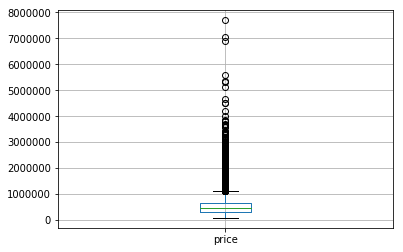

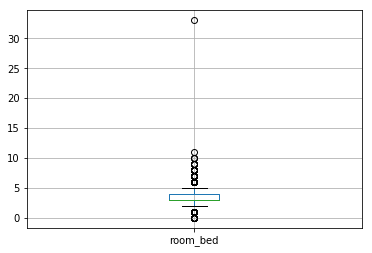

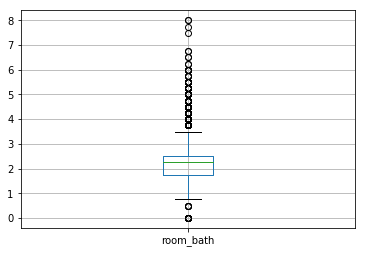

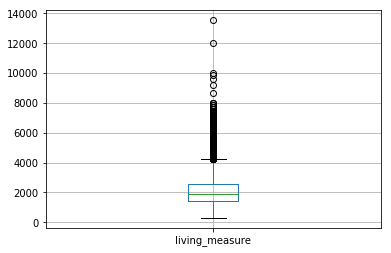

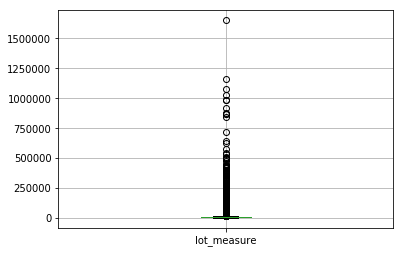

...

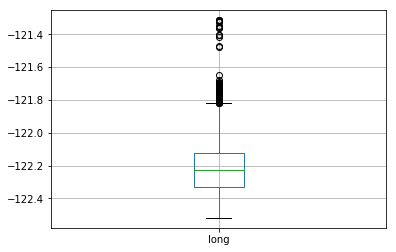

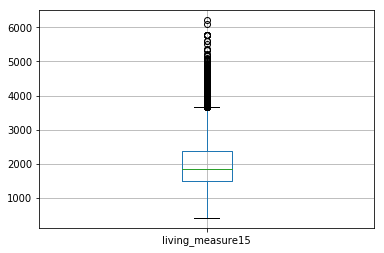

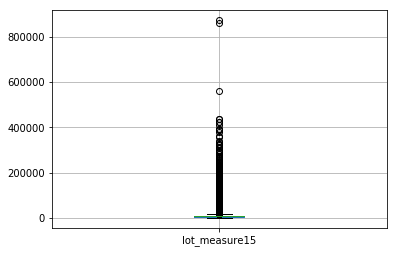

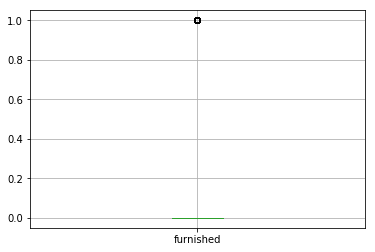

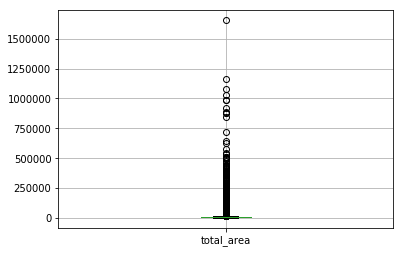

In [10]:
#let's first import the required libraries for the plots
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# size of plots to make it uniform throughout our analysis in the notebook
plotSizeX = 12
plotSizeY = 6
# let's boxplot all the numerical columns and see if there any outliers
for i in house_df.iloc[:, 2:].columns:
    house_df.iloc[:, 1:].boxplot(column=i)
    plt.show()

We can see, there are lot of features which have outliers. So we might need to treat those before building model

#### Analyzing Feature: cid

In [11]:
#cid - CID is appearing muliple times, it seems data contains house which is sold multiple times
cid_count=house_df.cid.value_counts()
cid_count[cid_count>1].shape

(176,)

We have 176 properties that were sold more than once in the given data

#### Analyzing Feature: dayhours

In [12]:
#we will create new data frame that can be used for modeling
#We will convert the dayhours to 'month_year' as sale month-year is relevant for analysis

house_dfr=house_df.copy()
house_df.dayhours=house_df.dayhours.str.replace('T000000', "")
house_df.dayhours=pd.to_datetime(house_df.dayhours,format='%Y%m%d')
house_df['month_year']=house_df['dayhours'].apply(lambda x: x.strftime('%B-%Y'))
house_df['month_year'].head()

0    November-2014
1    December-2014
2       April-2015
3         May-2014
4       April-2015
Name: month_year, dtype: object

We successfully converted dayhours feature to month_year for better analysis.

In [13]:
house_df['month_year'].value_counts()

April-2015        2231
July-2014         2211
June-2014         2180
August-2014       1940
October-2014      1878
March-2015        1875
September-2014    1774
May-2014          1768
December-2014     1471
November-2014     1411
February-2015     1250
January-2015       978
May-2015           646
Name: month_year, dtype: int64

We can see, most houses sold in April, July month

In [14]:
house_df.groupby(['month_year'])['price'].agg('mean')

month_year
April-2015        561933.463021
August-2014       536527.039691
December-2014     524602.893270
February-2015     507919.603200
January-2015      525963.251534
July-2014         544892.161013
June-2014         558123.736239
March-2015        544057.683200
May-2014          548166.600113
May-2015          558193.095975
November-2014     522058.861800
October-2014      539127.477636
September-2014    529315.868095
Name: price, dtype: float64

So the time line of the sale data of the properties is from May-2014 to May-2015 and April month have the highest mean price.

#### Analyzing Feature: Price (our Target)

In [15]:
house_df.price.describe()

count    2.161300e+04
mean     5.401822e+05
std      3.673622e+05
min      7.500000e+04
25%      3.219500e+05
50%      4.500000e+05
75%      6.450000e+05
max      7.700000e+06
Name: price, dtype: float64

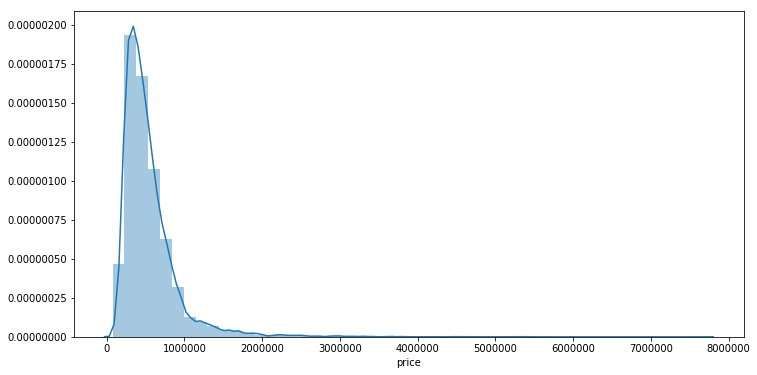

In [16]:
plt.figure(figsize=(plotSizeX, plotSizeY))
sns.distplot(house_df['price'])

The Price is ranging from 75,000 to 77,00,000 and distribution is right-skewed.

##### Analyzing Feature: room_bed

In [17]:
house_df['room_bed'].value_counts()

3     9824
4     6882
2     2760
5     1601
6      272
1      199
7       38
8       13
0       13
9        6
10       3
11       1
33       1
Name: room_bed, dtype: int64

The value of 33 seems to be outlier we need to check the data point before imputing the same

In [18]:
house_df[house_df['room_bed']==33]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,month_year
750,2402100895,2014-06-25,640000,33,1.75,1620,6000,1.0,0,0,...,1947,0,98103,47.6878,-122.331,1330,4700,0,7620,June-2014


Will delete this data point after bivariate analysis as it looks to be an outlier as it has low price for 33 bed room property

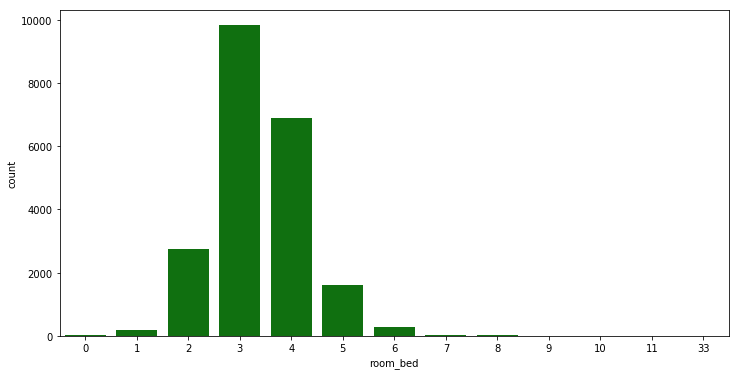

In [19]:
plt.figure(figsize=(plotSizeX, plotSizeY))
sns.countplot(house_df.room_bed,color='green')

Most of the houses/properties have 3 or 4 bedrooms

#### Analyzing Feature: room_bath

0.00      10
0.50       4
0.75      72
1.00    3852
1.25       9
1.50    1446
1.75    3048
2.00    1930
2.25    2047
2.50    5380
2.75    1185
3.00     753
3.25     589
3.50     731
3.75     155
4.00     136
4.25      79
4.50     100
4.75      23
5.00      21
5.25      13
5.50      10
5.75       4
6.00       6
6.25       2
6.50       2
6.75       2
7.50       1
7.75       1
8.00       2
Name: room_bath, dtype: int64

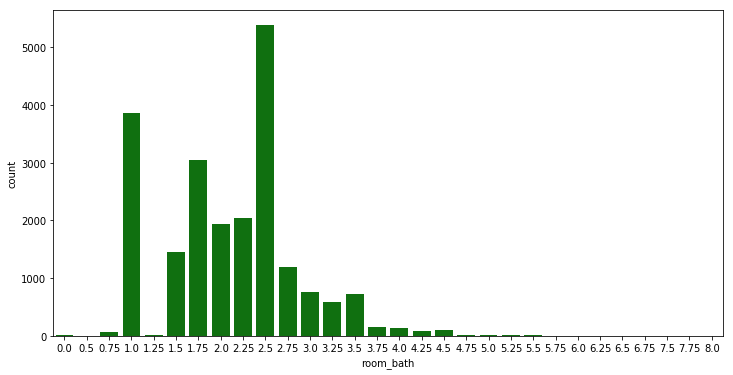

In [20]:
plt.figure(figsize=(plotSizeX, plotSizeY))
sns.countplot(house_df.room_bath,color='green')
house_df['room_bath'].value_counts().sort_index()

Majority of the properties have bathroom in the range of 1.0 to 2.5

Skewness is : 0.511107573347417


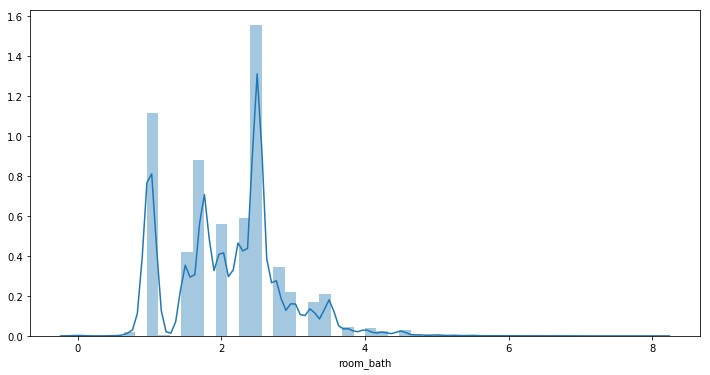

In [21]:
plt.figure(figsize=(plotSizeX, plotSizeY))
print("Skewness is :",house_df.room_bath.skew())
sns.distplot(house_df.room_bath)

#### Analyzing Feature: Living measure

Skewness is : 1.471555426802092


count    21613.000000
mean      2079.899736
std        918.440897
min        290.000000
25%       1427.000000
50%       1910.000000
75%       2550.000000
max      13540.000000
Name: living_measure, dtype: float64

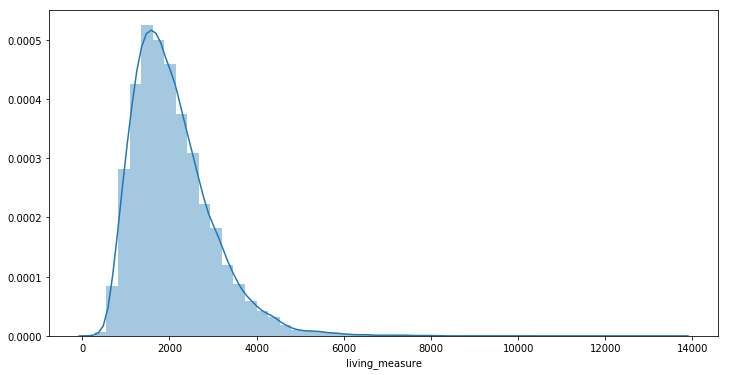

In [22]:
#Data is skewed as visible from plot, as its distribution is normal
plt.figure(figsize=(plotSizeX, plotSizeY))
print("Skewness is :",house_df.living_measure.skew())
sns.distplot(house_df.living_measure)
house_df.living_measure.describe()

Data distribution tells us, living_measure is right-skewed.

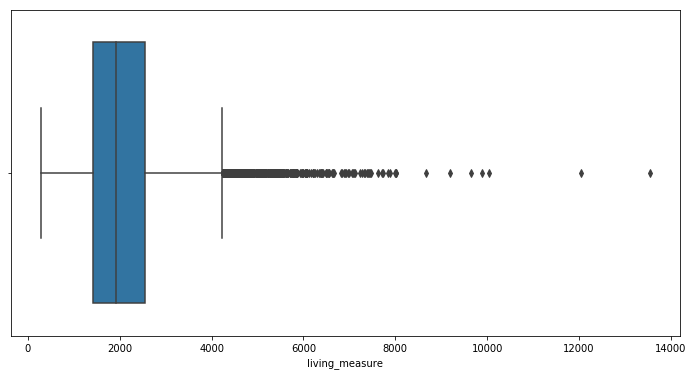

In [23]:
#Let's plot the boxplot for living_measure
plt.figure(figsize=(plotSizeX, plotSizeY))
sns.boxplot(house_df.living_measure)

There are many outliers in living measure. Need to review further to treat the same.

In [24]:
#checking the no. of data points with Living measure greater than 8000
house_df[house_df['living_measure']>8000]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,month_year
264,9208900037,2014-09-19,6890000,6,7.75,9890,31374,2.0,0,4,...,2001,0,98039,47.6305,-122.240,4540,42730,1,41264,September-2014
668,1924059029,2014-06-17,4670000,5,6.75,9640,13068,1.0,1,4,...,1983,2009,98040,47.5570,-122.210,3270,10454,1,22708,June-2014
1123,2303900035,2014-06-11,2890000,5,6.25,8670,64033,2.0,0,4,...,1965,2003,98177,47.7295,-122.372,4140,81021,1,72703,June-2014
4789,1247600105,2014-10-20,5110000,5,5.25,8010,45517,2.0,1,4,...,1999,0,98033,47.6767,-122.211,3430,26788,1,53527,October-2014
16785,6762700020,2014-10-13,7700000,6,8.00,12050,27600,2.5,0,3,...,1910,1987,98102,47.6298,-122.323,3940,8800,1,39650,October-2014
18393,6072800246,2014-07-02,3300000,5,6.25,8020,21738,2.0,0,0,...,2001,0,98006,47.5675,-122.189,4160,18969,1,29758,July-2014
19888,9808700762,2014-06-11,7060000,5,4.50,10040,37325,2.0,1,2,...,1940,2001,98004,47.6500,-122.214,3930,25449,1,47365,June-2014
20740,1225069038,2014-05-05,2280000,7,8.00,13540,307752,3.0,0,4,...,1999,0,98053,47.6675,-121.986,4850,217800,1,321292,May-2014
20917,2470100110,2014-08-04,5570000,5,5.75,9200,35069,2.0,0,0,...,2001,0,98039,47.6289,-122.233,3560,24345,1,44269,August-2014


We have only 9 properties/house which have more than 8k living_measure. So will treat these outliers.

#### Analyzing Feature: lot_measure

Skewness is : 13.06001895903175


count    2.161300e+04
mean     1.510697e+04
std      4.142051e+04
min      5.200000e+02
25%      5.040000e+03
50%      7.618000e+03
75%      1.068800e+04
max      1.651359e+06
Name: lot_measure, dtype: float64

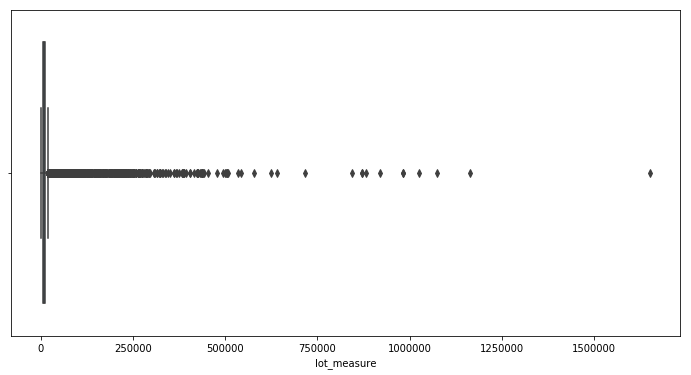

In [25]:
#Data is skewed as visible from plot
plt.figure(figsize=(plotSizeX, plotSizeY))
print("Skewness is :",house_df.lot_measure.skew())
sns.boxplot(house_df.lot_measure)
house_df.lot_measure.describe()

In [26]:
#checking the no. of data points with Lot measure greater than 1250000
house_df[house_df['lot_measure']>1250000]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,month_year
1113,1020069017,2015-03-27,700000,4,1.0,1300,1651359,1.0,0,3,...,1920,0,98022,47.2313,-122.023,2560,425581,0,1652659,March-2015


We have only 1 property with more than 12,50,000 lot_measure. So we need to treat this.

#### Analyzing Feature: ceil

In [27]:
#let's see the ceil count for all the records
house_df.ceil.value_counts()

1.0    10680
2.0     8241
1.5     1910
3.0      613
2.5      161
3.5        8
Name: ceil, dtype: int64

We can see, most houses have 1 floor

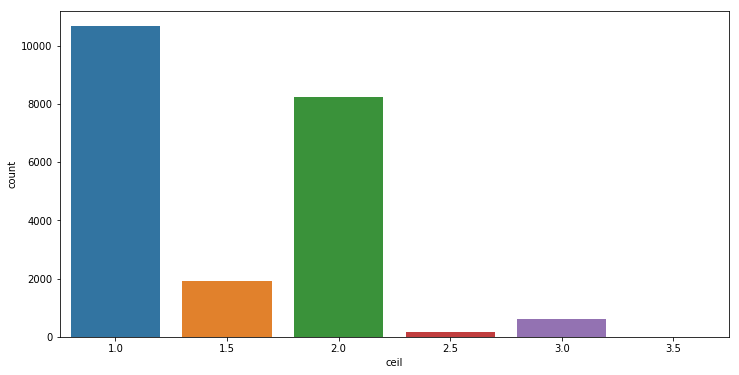

In [28]:
plt.figure(figsize=(plotSizeX, plotSizeY))
sns.countplot('ceil',data=house_df)

Above grapth confirming the same, that most properties have 1 and 2 floors

#### Analyzing Feature: coast

In [29]:
#coast - most houses donot have waterfront view, very few are waterfront
house_df.coast.value_counts()

0    21450
1      163
Name: coast, dtype: int64

#### Analyzing Feature: sight

In [30]:
#sight - most sights have not been viewed
house_df.sight.value_counts()

0    19489
2      963
3      510
1      332
4      319
Name: sight, dtype: int64

#### Analyzing Feature: condition

In [31]:
#condition - Overall most houses are rated as 3 and above for its condition overall
house_df.condition.value_counts()

3    14031
4     5679
5     1701
2      172
1       30
Name: condition, dtype: int64

#### Analyzing Feature: quality

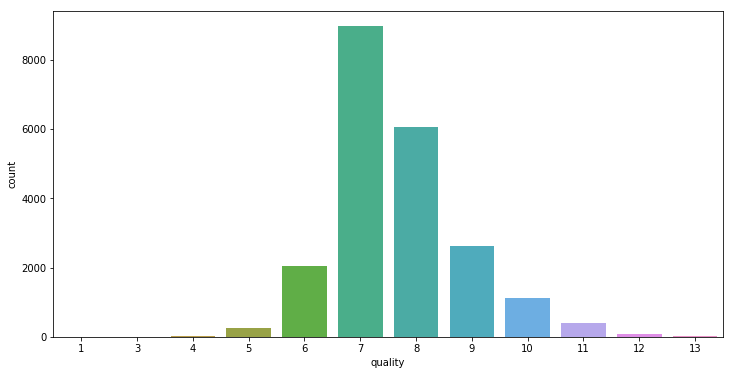

In [32]:
#Quality - most properties have quality rating between 6 to 10
house_df.quality.value_counts()
plt.figure(figsize=(plotSizeX, plotSizeY))
sns.countplot('quality',data=house_df)

In [33]:
#checking the no. of data points with quality rating as 13
house_df[house_df['quality']==13]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,month_year
264,9208900037,2014-09-19,6890000,6,7.75,9890,31374,2.0,0,4,...,2001,0,98039,47.6305,-122.240,4540,42730,1,41264,September-2014
1123,2303900035,2014-06-11,2890000,5,6.25,8670,64033,2.0,0,4,...,1965,2003,98177,47.7295,-122.372,4140,81021,1,72703,June-2014
1583,2426039123,2015-01-30,2420000,5,4.75,7880,24250,2.0,0,2,...,1996,0,98177,47.7334,-122.362,2740,10761,1,32130,January-2015
7095,2303900100,2014-09-11,3800000,3,4.25,5510,35000,2.0,0,4,...,1997,0,98177,47.7296,-122.370,3430,45302,1,40510,September-2014
8509,4139900180,2015-04-20,2340000,4,2.50,4500,35200,1.0,0,0,...,1988,0,98006,47.5477,-122.126,4760,35200,1,39700,April-2015
9446,1068000375,2014-09-23,3200000,6,5.00,7100,18200,2.5,0,0,...,1933,2002,98199,47.6427,-122.408,3130,6477,1,25300,September-2014
10387,7237501190,2014-10-10,1780000,4,3.25,4890,13402,2.0,0,0,...,2004,0,98059,47.5303,-122.131,5790,13539,1,18292,October-2014
12320,1725059316,2014-11-20,2390000,4,4.00,6330,13296,2.0,0,2,...,2000,0,98033,47.6488,-122.201,2200,9196,1,19626,November-2014
12686,853200010,2014-07-01,3800000,5,5.50,7050,42840,1.0,0,2,...,1978,0,98004,47.6229,-122.220,5070,20570,1,49890,July-2014
16785,6762700020,2014-10-13,7700000,6,8.00,12050,27600,2.5,0,3,...,1910,1987,98102,47.6298,-122.323,3940,8800,1,39650,October-2014


There are only 13 propeties which have the highest quality rating

#### Analyzing Feature: ceil_measure

Skewness is : 1.4466644733818372


count    21613.000000
mean      1788.390691
std        828.090978
min        290.000000
25%       1190.000000
50%       1560.000000
75%       2210.000000
max       9410.000000
Name: ceil_measure, dtype: float64

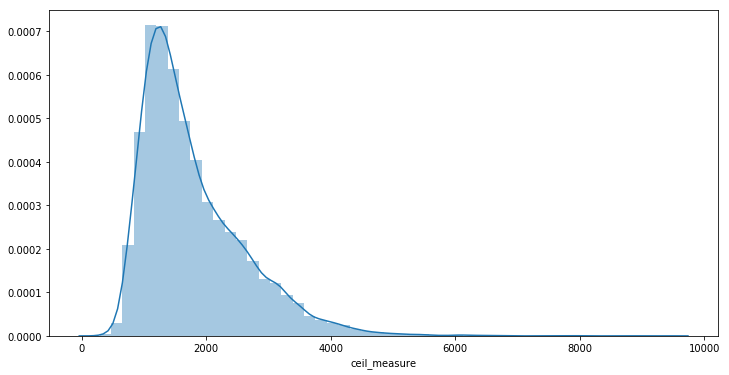

In [34]:
#ceil_measure - its highly skewed
print("Skewness is :", house_df.ceil_measure.skew())
plt.figure(figsize=(plotSizeX, plotSizeY))
sns.distplot(house_df.ceil_measure)
house_df.ceil_measure.describe()

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3672: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


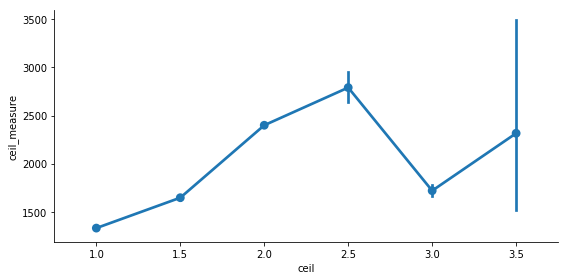

In [35]:
sns.factorplot(x='ceil',y='ceil_measure',data=house_df, size = 4, aspect = 2)

There is no pattern in Ceil Vs Ceil_measure

The vertival lines at each point represent the inter quartile range of values at that point

#### Analyzing Feature: basement

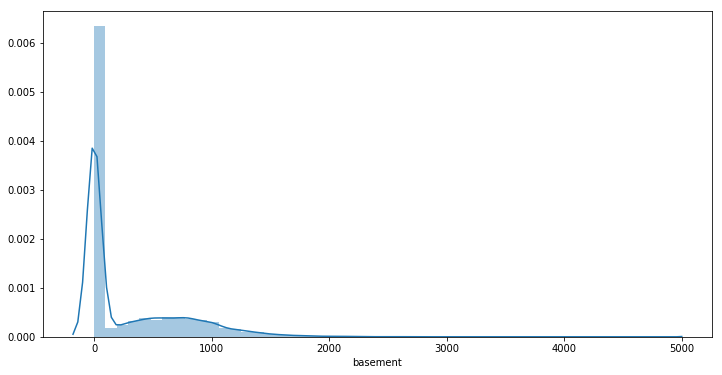

In [36]:
#basement_measure
plt.figure(figsize=(plotSizeX, plotSizeY))
sns.distplot(house_df.basement)

We can see 2 gaussians, which tells us there are propeties which don't have basements and some have the basements

In [37]:
house_df[house_df.basement==0].shape

(13126, 24)

We have almost 60% of the properties without basement

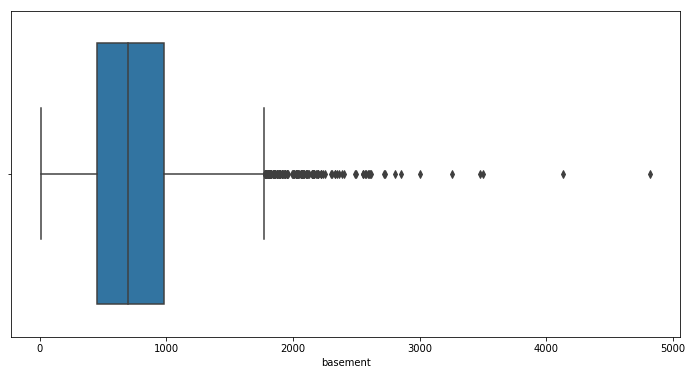

In [38]:
#houses have zero measure of basement i.e. they donot have basements
#let's plot boxplot for properties which have basements only
house_df_base=house_df[house_df['basement']>0]
plt.figure(figsize=(plotSizeX, plotSizeY))
sns.boxplot(house_df_base['basement'])

We can clearly see, there are outliers. We need to treat this before our model.

In [39]:
#checking the no. of data points with 'basement' greater than 4000
house_df[house_df['basement']>4000]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,month_year
668,1924059029,2014-06-17,4670000,5,6.75,9640,13068,1.0,1,4,...,1983,2009,98040,47.5570,-122.210,3270,10454,1,22708,June-2014
20740,1225069038,2014-05-05,2280000,7,8.00,13540,307752,3.0,0,4,...,1999,0,98053,47.6675,-121.986,4850,217800,1,321292,May-2014


We have only 2 properties with more than 4,000 measure basement

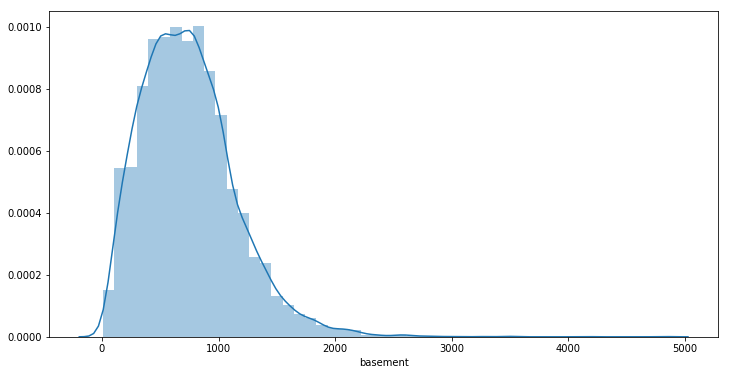

In [40]:
#Distribution of houses having basement
plt.figure(figsize=(plotSizeX, plotSizeY))
sns.distplot(house_df_base.basement)

Distribution having basement is right-skewed

#### Analyzing Feature: yr_built

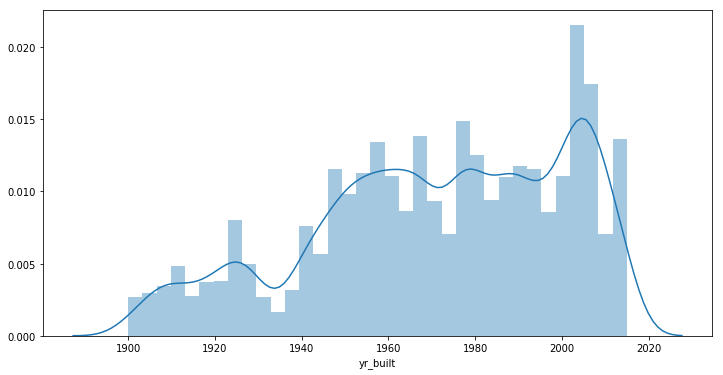

In [41]:
#house range from new to very old
plt.figure(figsize=(plotSizeX, plotSizeY))
sns.distplot(house_df.yr_built)

The built year of the properties range from 1900 to 2014 and we can see upward trend with time

#### Analyzing Feature: yr_renovated

In [42]:
house_df[house_df['yr_renovated']>0].shape

(914, 24)

Only 914 houses were renovated out of 21613 houses

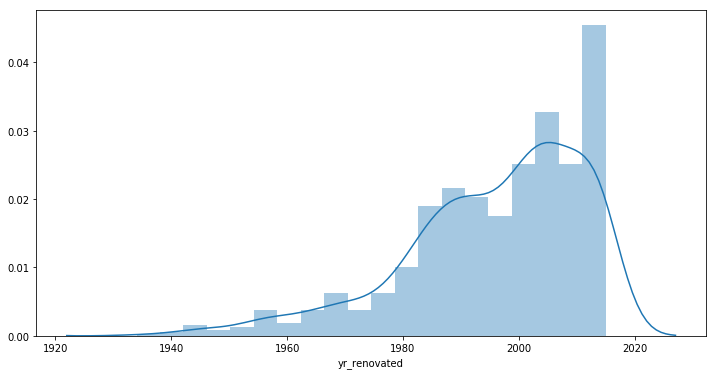

In [43]:
#yr_renovated - plot of houses which are renovated
house_df_reno=house_df[house_df['yr_renovated']>0]
plt.figure(figsize=(plotSizeX, plotSizeY))
sns.distplot(house_df_reno.yr_renovated)

Now will create age column from columns : yr_built & yr_renovated

#### Analyzing Feature: Zipcode, Lat, Long

In [46]:
#For geographic visual
import geopandas as gpd
from shapely.geometry import Point, Polygon
#For current working directory
import os
cwd = os.getcwd()

In [47]:
## Need to add file USA ZipCodes_1.xlsx to current working directory to access this data
USAZip=pd.read_excel("USA ZipCodes_1.xlsx",sheet_name="Sheet8")
USAZip.head()

,zipcode,City,County,Type
0,98001,Auburn,King,Standard
1,98002,Auburn,King,Standard
2,98003,Federal Way,King,Standard
3,98004,Bellevue,King,Standard
4,98005,Bellevue,King,Standard


In [48]:
house_df=house_df.merge(USAZip,how='left',on='zipcode')
#house_df.drop_duplicates()

In [49]:
#let's see the shape of our dataframe
house_df.shape

(21613, 27)

Now we have 27 features

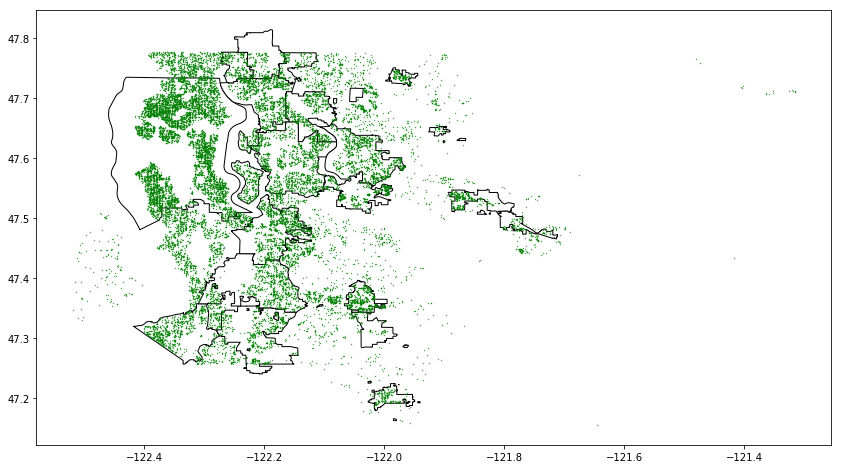

<Figure size 1080x1080 with 0 Axes>

In [5]:
#Add the folder WA to your current working directory
usa = gpd.read_file(cwd+'\\WA\\WSDOT__City_Limits.shp')
usa.head()
gdf = gpd.GeoDataFrame(
    house_df,geometry = [Point(xy) for xy in zip(house_df['long'], house_df['lat'])])
#We can now plot our ``GeoDataFrame``
ax=usa[usa.CityName.isin(house_df.City.unique())].plot(
    color='white', edgecolor='black',figsize=(20,8))
plt.figure(figsize=(15,15))
gdf.plot(ax=ax, color='green', marker='o',markersize=0.1)

In [51]:
#let's see the columns of dataframe once again
house_df.columns

Index(['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'living_measure15', 'lot_measure15', 'furnished',
       'total_area', 'month_year', 'City', 'County', 'Type'],
      dtype='object')

So we have 'City', 'Country', 'Type' as new feature in our dataframe

In [52]:
house_df.Type.value_counts()

Standard    21613
Name: Type, dtype: int64

As the type is same for all the columns, we will remove this column in further analysis

In [53]:
house_df.City.value_counts()

Seattle          8977
Renton           1597
Bellevue         1407
Kent             1203
Redmond           979
Kirkland          977
Auburn            912
Sammamish         800
Federal Way       779
Issaquah          733
Maple Valley      590
Woodinville       471
Snoqualmie        310
Kenmore           283
Mercer Island     282
Enumclaw          234
North Bend        221
Bothell           195
Duvall            190
Carnation         124
Vashon            118
Black Diamond     100
Fall City          81
Medina             50
Name: City, dtype: int64

So we have most properties in 'Seattle' city and least in 'Medina' city

#### Analyzing Feature: furnished

0    17362
1     4251
Name: furnished, dtype: int64

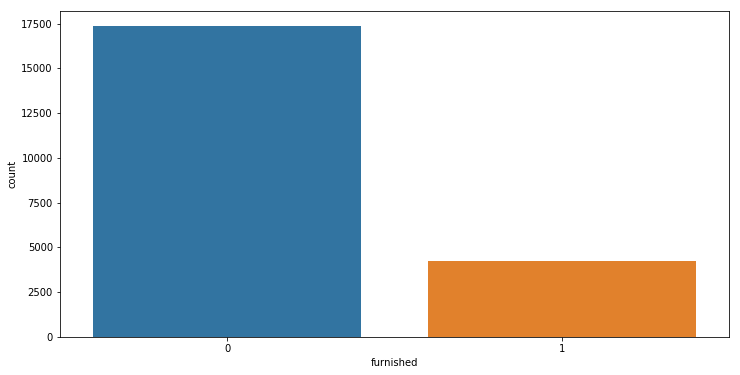

In [54]:
plt.figure(figsize=(plotSizeX, plotSizeY))
sns.countplot('furnished',data=house_df)
house_df.furnished.value_counts()

Most properties are not furnished. Furnish column need to be converted into categorical column

# BIVARIATE ANALYSIS

### PairPlot

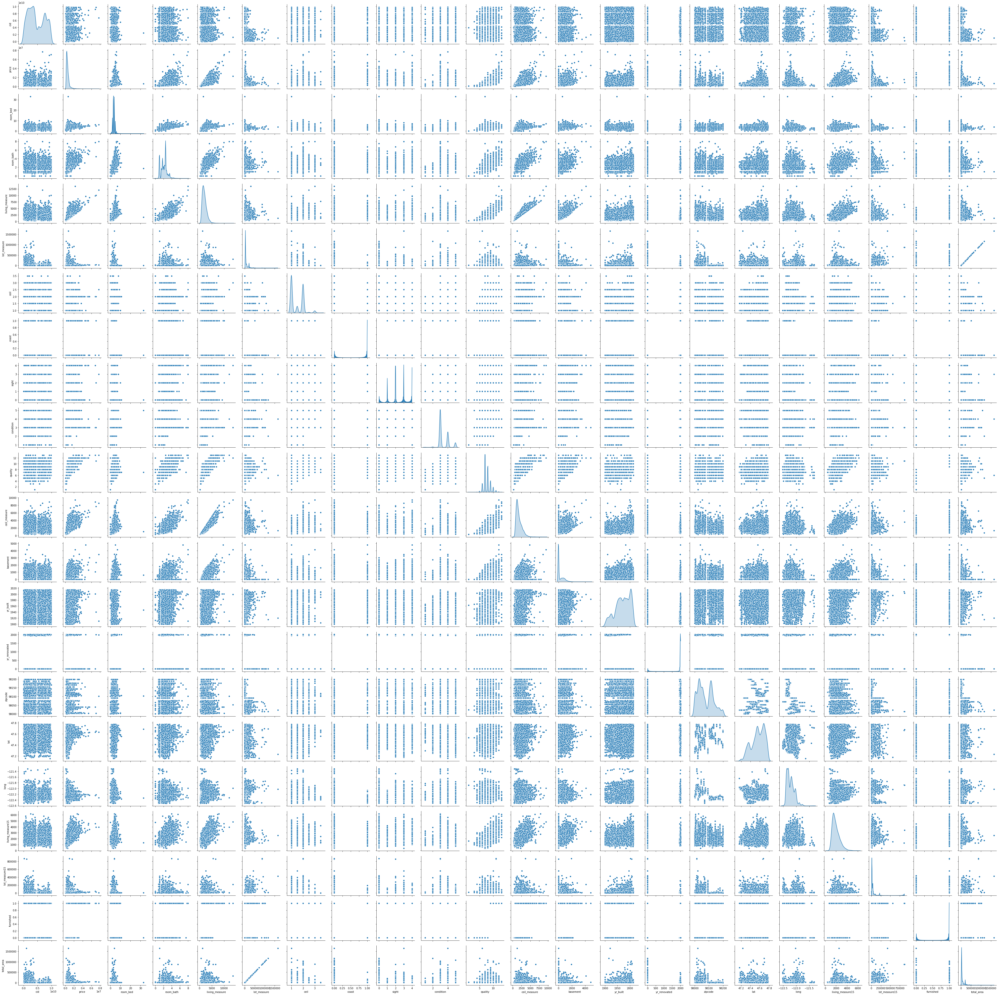

In [55]:
# let's plot all the variables and confirm our above deduction with more confidence
sns.pairplot(house_df, diag_kind = 'kde')

From above pair plot, we observed/deduced below 

<ol>
    <li><b>price:</b> price distribution is Right-Skewed as we deduced earlier from our 5-factor analysis</li>
    <li><b>room_bed:</b> our target variable (price) and room_bed plot is not linear. It's distribution have lot of gaussians</li>
    <li><b>room_bath:</b> It's plot with price has <b>somewhat linear relationship</b>. Distribution has number of gaussians.</li>
    <li><b>living_measure:</b> Plot against price has <b>strong linear relationship</b>. It also have linear relationship with room_bath variable. So <b>might remove one of these 2</b>. Distribution is Right-Skewed.
    <li><b>lot_measure: No clear relationship</b> with price.</li>
    <li><b>ceil: No clear relationship</b> with price. We can see, it's <b>have 6 unique values</b> only. Therefore, we can <b>convert this column into categorical column</b> for values.</li>
    <li><b>coast: No clear relationship</b> with price. Clearly it's <b>categorical variable with 2 unique values</b>.</li>
    <li><b>sight: No clear relationship</b> with price. This has <b>5 unique values</b>. Can be <b>converted to Categorical variable</b>.</li>
    <li><b>condition: No clear relationship</b> with price. This has <b>5 unique values</b>. Can be <b>converted to Categorical variable</b>.</li>
    <li><b>quality: Somewhat linear relationship with price</b>. Has <b>discrete values from 1 - 13. Can be converted to Categorical variable</b>.</li>
    <li><b>ceil_measure: Strong linear relationship with price</b>. Also with room_bath and living_measure features. Distribution is <b>Right-Skewed</b>.</li>
    <li><b>basement: No clear relationship</b> with price. </li>
    <li><b>yr_built: No clear relationship</b> with price. </li>
    <li><b>yr_renovated: No clear relationship</b> with price. Have <b>2 unique values. Can be converted to Categorical Variable</b> which tells whether house is renovated or not.</li>
    <li><b>zipcode, lat, long: No clear relationship</b> with price or any other feature.</li>
    <li><b>living_measure15: Somewhat linear relationship with target feature</b>. It's same as living_measure. Therefore we can drop this variable.</li>
    <li><b>lot_measure15: No clear relationship</b> with price or any other feature.</li>
    <li><b>furnished: No clear relationship</b> with price or any other feature. <b> 2 unique values so can be converted to Categorical Variable</b></li>
    <li><b>total_area: No clear relationship with price</b>. But it has <b>Very Strong linear relationship with lot_measure</b>. So one of it can be dropped.</li>
    </ol>
    
    In brief, below featues should be converted to Categorical Variable
        ceil, coast, sight, condition, quality, yr_renovated, furnished
    And below columns can be dropped after checking pearson factor
        zipcode, lat, long, living_measure15, lot_measure15, total_area

In [56]:
# let's see corelatoin between the different features
house_corr = house_df.corr(method ='pearson')
house_corr

,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,...,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
cid,1.000000,-0.016797,0.001286,0.005160,-0.012258,-0.132109,0.018525,-0.002721,0.011592,-0.023783,...,-0.005151,0.021380,-0.016907,-0.008224,-0.001891,0.020799,-0.002901,-0.138798,-0.010009,-0.131844
price,-0.016797,1.000000,0.308338,0.525134,0.702044,0.089655,0.256786,0.266331,0.397346,0.036392,...,0.323837,0.053982,0.126442,-0.053168,0.306919,0.021571,0.585374,0.082456,0.565991,0.104796
room_bed,0.001286,0.308338,1.000000,0.515884,0.576671,0.031703,0.175429,-0.006582,0.079532,0.028472,...,0.303093,0.154178,0.018841,-0.152668,-0.008931,0.129473,0.391638,0.029244,0.259268,0.044310
room_bath,0.005160,0.525134,0.515884,1.000000,0.754665,0.087740,0.500653,0.063744,0.187737,-0.124982,...,0.283770,0.506019,0.050739,-0.203866,0.024573,0.223042,0.568634,0.087175,0.484923,0.104050
living_measure,-0.012258,0.702044,0.576671,0.754665,1.000000,0.172826,0.353949,0.103818,0.284611,-0.058753,...,0.435043,0.318049,0.055363,-0.199430,0.052529,0.240223,0.756420,0.183286,0.632947,0.194209
lot_measure,-0.132109,0.089655,0.031703,0.087740,0.172826,1.000000,-0.005201,0.021604,0.074710,-0.008958,...,0.015286,0.053080,0.007644,-0.129574,-0.085683,0.229521,0.144608,0.718557,0.118883,0.999763
ceil,0.018525,0.256786,0.175429,0.500653,0.353949,-0.005201,1.000000,0.023698,0.029444,-0.263768,...,-0.245705,0.489319,0.006338,-0.059121,0.049614,0.125419,0.279885,-0.011269,0.347749,0.002637
coast,-0.002721,0.266331,-0.006582,0.063744,0.103818,0.021604,0.023698,1.000000,0.401857,0.016653,...,0.080588,-0.026161,0.092885,0.030285,-0.014274,-0.041910,0.086463,0.030703,0.069882,0.023809
sight,0.011592,0.397346,0.079532,0.187737,0.284611,0.074710,0.029444,0.401857,1.000000,0.045990,...,0.276947,-0.053440,0.103917,0.084827,0.006157,-0.078400,0.280439,0.072575,0.220250,0.080693
condition,-0.023783,0.036392,0.028472,-0.124982,-0.058753,-0.008958,-0.263768,0.016653,0.045990,1.000000,...,0.174105,-0.361417,-0.060618,0.003026,-0.014941,-0.106500,-0.092824,-0.003406,-0.121902,-0.010219


We have linear relationships in below featues as we got to know from above matrix

<ol>
    <li><b>price</b>: room_bath, living_measure, quality, living_measure15, furnished</li>
    <li><b>living_measure</b>: price, room_bath. So we can consider dropping 'room_bath' variable.</li>
    <li><b>quality</b>: price, room_bath, living_measure</li>
    <li><b>ceil_measure</b>: price, room_bath, living_measure, quality</li>
    <li><b>living_measure15</b>: price, living_measure, quality. So we can  consider dropping living_measure15 as well. As it's giving same info as living_measure.</li>
    <li><b>lot_measure15</b>: lot_measure. Therefore, we can consider dropping lot_measure15, as it's giving same info.</li>
    <li><b>furnished</b>: quality</li>
    <li><b>total_area</b>: lot_measure, lot_measure15. Therefore, we can consider dropping total_area feature as well. As it's giving same info as lot_measure.</li>
</ol>

We can plot heatmap and can easily confirm our above findings

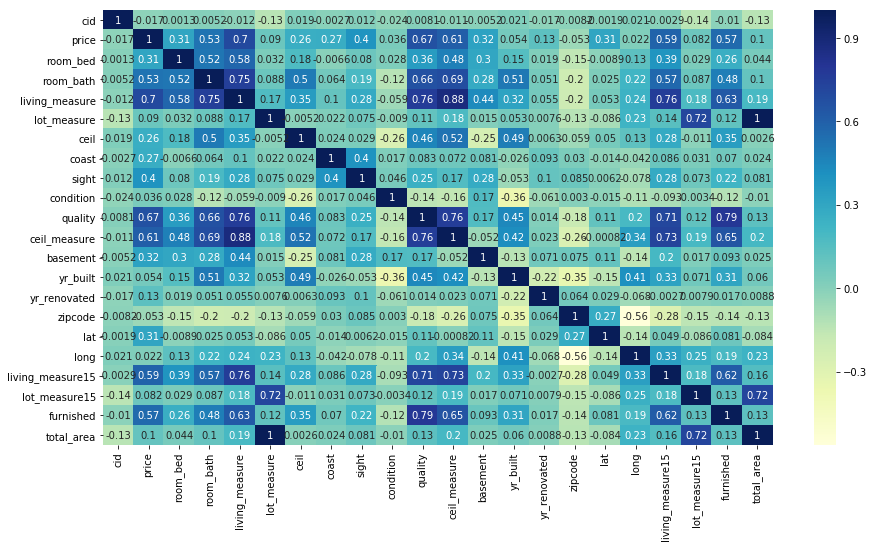

In [57]:
# Plotting heatmap
plt.subplots(figsize =(15, 8)) 
sns.heatmap(house_corr,cmap="YlGnBu",annot=True)

### Analyzing Bivariate for Feature: month_year

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3672: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


,mean,median,size
month_year,,,
April-2015,561933.463021,476500,2231
August-2014,536527.039691,442100,1940
December-2014,524602.893270,432500,1471
February-2015,507919.603200,425545,1250
January-2015,525963.251534,438500,978
July-2014,544892.161013,465000,2211
June-2014,558123.736239,465000,2180
March-2015,544057.683200,450000,1875
May-2014,548166.600113,465000,1768


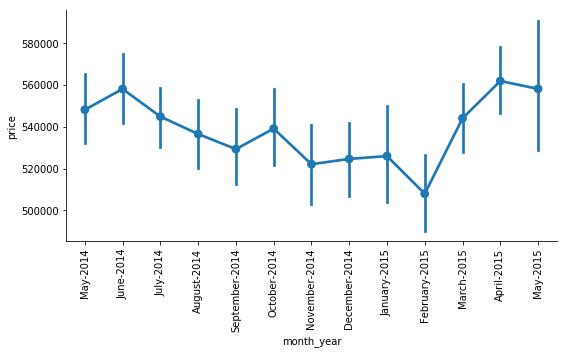

In [58]:
#month,year in which house is sold. Price is not influenced by it, though there are outliers and can be easily seen.
house_df['month_year'] = pd.to_datetime(house_df['month_year'], format='%B-%Y')

house_df.sort_values(["month_year"], axis=0, 
                 ascending=True, inplace=True) 
house_df["month_year"] = house_df["month_year"].dt.strftime('%B-%Y')

sns.factorplot(x='month_year',y='price',data=house_df, size=4, aspect=2)
plt.xticks(rotation=90)
#groupby
house_df.groupby('month_year')['price'].agg(['mean','median','size'])

The mean price of the houses tend to be high during March,April, May as compared to that of September, October, November,December period. 

### Analyzing Bivariate for Feature: room_bed

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3672: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


,mean,median,size
room_bed,,,
0,4.102231e+05,288000.0,13
1,3.176580e+05,299000.0,199
2,4.013877e+05,374000.0,2760
3,4.662766e+05,413000.0,9824
4,6.355647e+05,549997.5,6882
5,7.868741e+05,620000.0,1601
6,8.258535e+05,650000.0,272
7,9.514478e+05,728580.0,38
8,1.105077e+06,700000.0,13


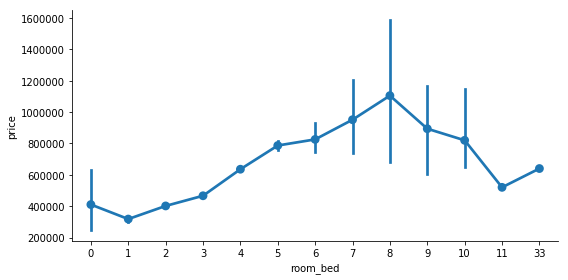

In [59]:
#Room_bed - outliers can be seen easily. Mean and median of price increases with number bedrooms/house uptill a point
#and then drops
sns.factorplot(x='room_bed',y='price',data=house_df, size=4, aspect=2)

#groupby
house_df.groupby('room_bed')['price'].agg(['mean','median','size'])

There is clear increasing trend in price with room_bed

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3672: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


,mean,median,size
room_bath,,,
0.00,4.490950e+05,317500,10
0.50,2.373750e+05,264000,4
0.75,2.945209e+05,273500,72
1.00,3.470412e+05,320000,3852
1.25,6.217722e+05,516500,9
1.50,4.093457e+05,370000,1446
1.75,4.549158e+05,422900,3048
2.00,4.579050e+05,423250,1930
2.25,5.337688e+05,472500,2047


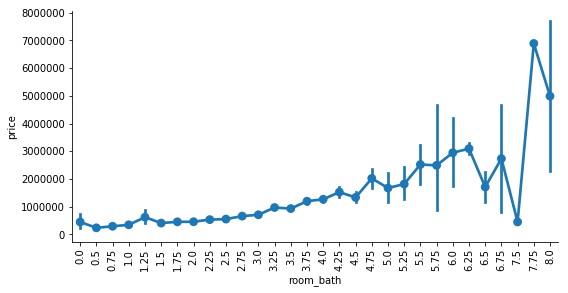

In [60]:
#room_bath - outliers can be seen easily. Overall mean and median price increares with increasing room_bath
sns.factorplot(x='room_bath',y='price',data=house_df,size=4, aspect=2)
plt.xticks(rotation=90)
#groupby
house_df.groupby('room_bath')['price'].agg(['mean','median','size'])

There is upward trend in price with increase in room_bath

### Analyzing Bivariate for Feature: living_measure

AxesSubplot(0.125,0.125;0.775x0.755)


count    21613.000000
mean      2079.899736
std        918.440897
min        290.000000
25%       1427.000000
50%       1910.000000
75%       2550.000000
max      13540.000000
Name: living_measure, dtype: float64

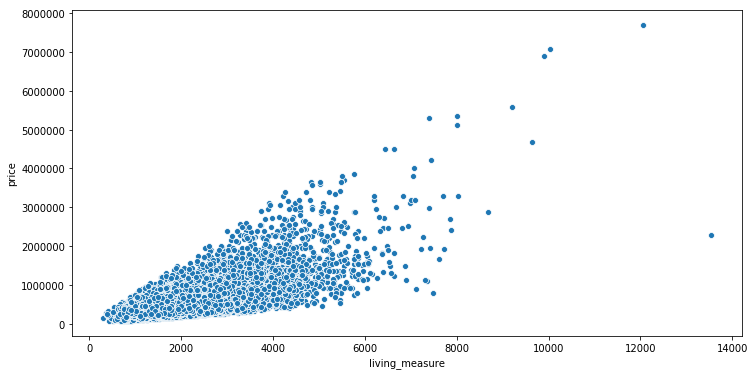

In [61]:
#living_measure - price increases with increase in living measure
plt.figure(figsize=(plotSizeX, plotSizeY))
print(sns.scatterplot(house_df['living_measure'],house_df['price']))
house_df['living_measure'].describe()

There is clear increment in price of the property with increment in the living measure
But there seems to be one outlier to this trend. Need to evaluate the same

### Analyzing Bivariate for Feature: lot_measure

AxesSubplot(0.125,0.125;0.775x0.755)


count    2.161300e+04
mean     1.510697e+04
std      4.142051e+04
min      5.200000e+02
25%      5.040000e+03
50%      7.618000e+03
75%      1.068800e+04
max      1.651359e+06
Name: lot_measure, dtype: float64

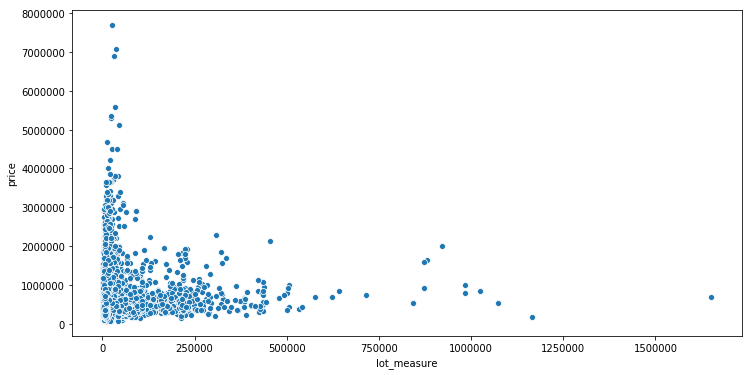

In [62]:
#lot_measure - there seems to be no relation between lot_measure and price
#lot_measure - data value range is very large so breaking it get better view.
plt.figure(figsize=(plotSizeX, plotSizeY))
print(sns.scatterplot(house_df['lot_measure'],house_df['price']))
house_df['lot_measure'].describe()

There doesnt seem to be no relation between lot_measure and price trend

AxesSubplot(0.125,0.125;0.775x0.755)


count    19713.000000
mean      7762.510577
std       4252.549162
min        520.000000
25%       4997.000000
50%       7253.000000
75%       9620.000000
max      24969.000000
Name: lot_measure, dtype: float64

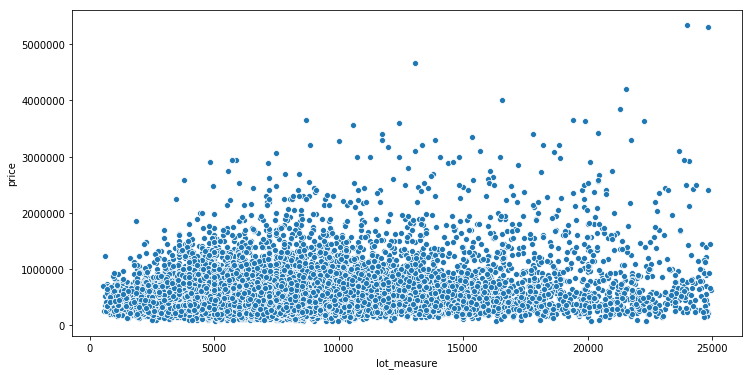

In [63]:
#lot_measure <25000
plt.figure(figsize=(plotSizeX, plotSizeY))
x=house_df[house_df['lot_measure']<25000]
print(sns.scatterplot(x['lot_measure'],x['price']))
x['lot_measure'].describe()

Almost 95% of the houses have <25000 lot_measure. But there is no clear trend between lot_measure and price

AxesSubplot(0.125,0.125;0.775x0.755)


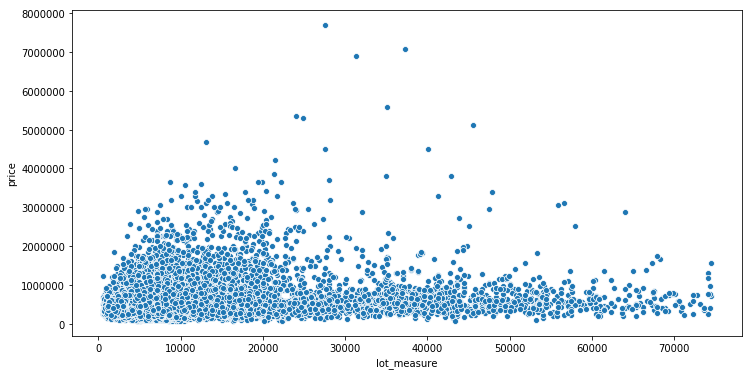

In [64]:
#lot_measure >100000 - price increases with increase in living measure
plt.figure(figsize=(plotSizeX, plotSizeY))
y=house_df[house_df['lot_measure']<=75000]
print(sns.scatterplot(y['lot_measure'],y['price']))
#y['lot_measure'].describe()

### Analyzing Bivariate for Feature: ceil

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3672: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


,mean,median,size
ceil,,,
1.0,4.422196e+05,390000,10680
1.5,5.590449e+05,524475,1910
2.0,6.490515e+05,542950,8241
2.5,1.061021e+06,799200,161
3.0,5.826201e+05,490000,613
3.5,9.339375e+05,534500,8


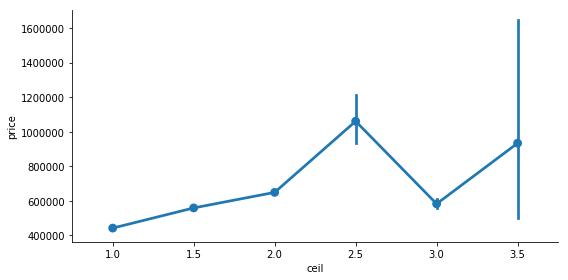

In [65]:
#ceil - median price increases initially and then falls
print(sns.factorplot(x='ceil',y='price',data=house_df, size = 4, aspect = 2))
#groupby
house_df.groupby('ceil')['price'].agg(['mean','median','size'])

There is some slight upward trend in price with the ceil

### Analyzing Bivariate for Feature: coast

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3672: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


living_measure                 price              
              median         mean   median          mean
coast                                                   
0               1910  2071.587972   450000  5.316534e+05
1               2850  3173.687117  1400000  1.662524e+06

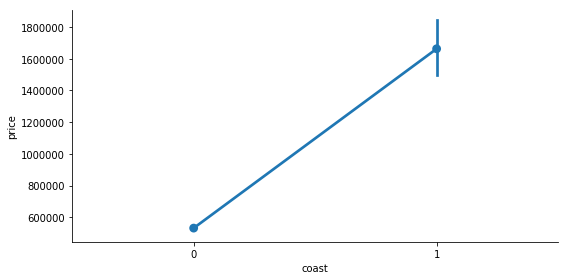

In [66]:
#coast - mean and median of waterfront view is high however such houses are very small in compare to non-waterfront
#Also, living_measure mean and median is greater for waterfront house.
print(sns.factorplot(x='coast',y='price',data=house_df, size = 4, aspect = 2))
#groupby
house_df.groupby('coast')['living_measure','price'].agg(['median','mean'])

The house properties with water_front tend to have higher price compared to that of non-water_front properties

### Analyzing Bivariate for Feature: sight

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3672: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


price                 living_measure              
               mean   median   size           mean median   size
sight                                                           
0      4.966235e+05   432500  19489    1997.761660   1850  19489
1      8.125186e+05   690944    332    2568.960843   2420    332
2      7.927462e+05   675000    963    2655.257529   2470    963
3      9.724684e+05   802500    510    3018.564706   2840    510
4      1.464363e+06  1190000    319    3351.473354   3050    319

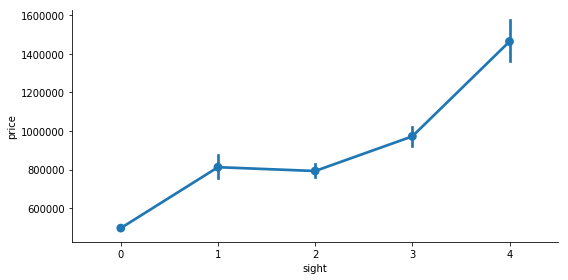

In [67]:
#sight - have outliers. The house sighted more have high price (mean and median) and have large living area as well.
print(sns.factorplot(x='sight',y='price',data=house_df, size = 4, aspect = 2))
#groupby
house_df.groupby('sight')['price','living_measure'].agg(['mean','median','size'])

Properties with higher price have more no.of sights compared to that of houses with lower price

AxesSubplot(0.125,0.125;0.775x0.755)


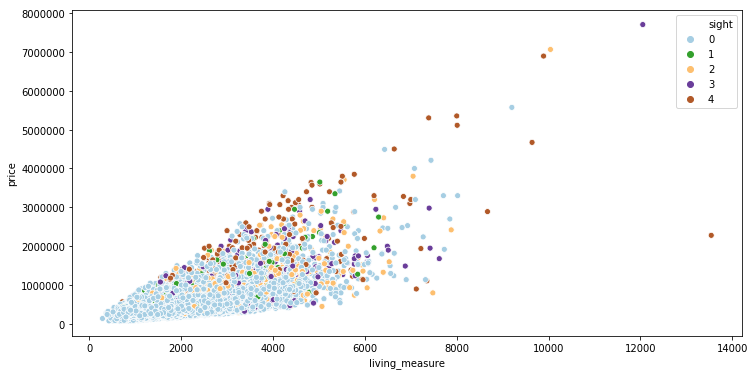

In [68]:
#Sight - Viewed in relation with price and living_measure
#Costlier houses with large living area are sighted more.
plt.figure(figsize=(plotSizeX, plotSizeY))
print(sns.scatterplot(house_df['living_measure'],house_df['price'],hue=house_df['sight'],palette='Paired',legend='full'))

The above graph also justify that: Properties with higher price have more no.of sights compared to that of houses with lower price

### Analyzing Bivariate for Feature: condition

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3672: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


price                living_measure              
                    mean  median   size           mean median   size
condition                                                           
1          334431.666667  262500     30    1216.000000   1000     30
2          327316.215116  279000    172    1410.058140   1320    172
3          542097.086024  450000  14031    2149.042050   1970  14031
4          521300.705230  440000   5679    1950.991724   1820   5679
5          612577.742504  526000   1701    2022.911229   1880   1701

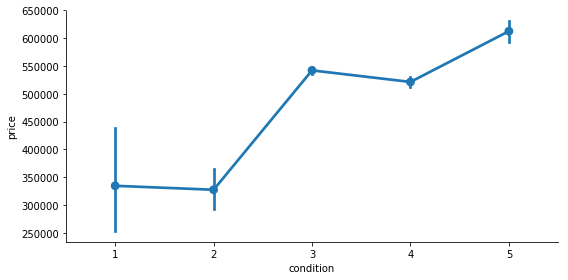

In [69]:
#condition - as the condition rating increases its price and living measure mean and median also increases.
print(sns.factorplot(x='condition',y='price',data=house_df, size = 4, aspect = 2))
#groupby
house_df.groupby('condition')['price','living_measure'].agg(['mean','median','size'])

The price of the house increases with condition rating of the house

AxesSubplot(0.125,0.125;0.775x0.755)


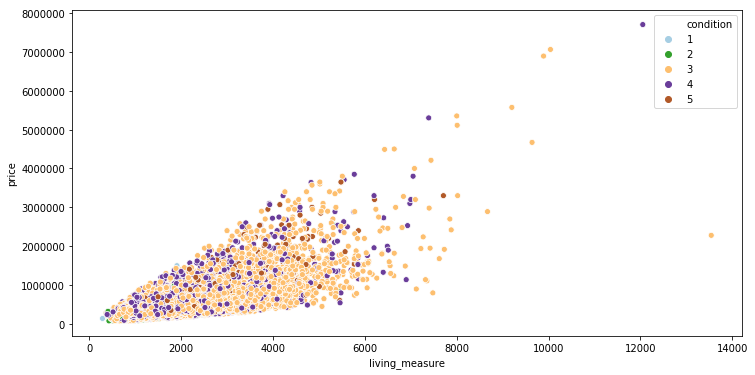

In [70]:
#Condition - Viewed in relation with price and living_measure. Most houses are rated as 3 or more. 
#We can see some outliers as well
plt.figure(figsize=(plotSizeX, plotSizeY))
print(sns.scatterplot(house_df['living_measure'],house_df['price'],hue=house_df['condition'],palette='Paired',legend='full'))

***So we found out that smaller houses are in better condition and better condition houses are having higher prices***

### Analyzing Bivariate for Feature: quality

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3672: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


price                  living_measure             
                 mean     median  size           mean median  size
quality                                                           
1        1.420000e+05   142000.0     1     290.000000    290     1
3        2.056667e+05   262000.0     3     596.666667    600     3
4        2.143810e+05   205000.0    29     660.482759    660    29
5        2.485240e+05   228700.0   242     983.326446    905   242
6        3.019166e+05   275276.5  2038    1191.561335   1120  2038
7        4.025933e+05   375000.0  8981    1689.400401   1630  8981
8        5.428955e+05   510000.0  6068    2184.748517   2150  6068
9        7.737382e+05   720000.0  2615    2868.139962   2820  2615
10       1.072347e+06   914327.0  1134    3520.299824   3450  1134
11       1.497792e+06  1280000.0   399    4395.448622   4260   399
12       2.192500e+06  1820000.0    90    5471.588889   4965    90
13       3.710769e+06  2980000.0    13    7483.076923   7100    13

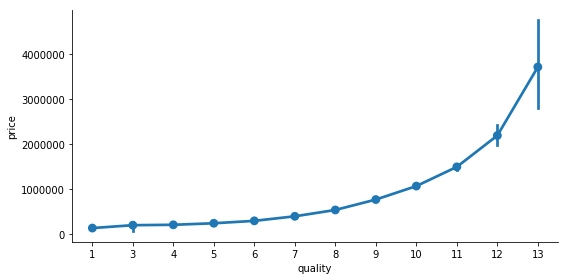

In [71]:
#quality - with grade increase price and living_measure increase (mean and median)

print(sns.factorplot(x='quality',y='price',data=house_df, size = 4, aspect = 2))
#groupby
house_df.groupby('quality')['price','living_measure'].agg(['mean','median','size'])

There is clear increase in price of the house with higher rating on quality

AxesSubplot(0.125,0.125;0.775x0.755)


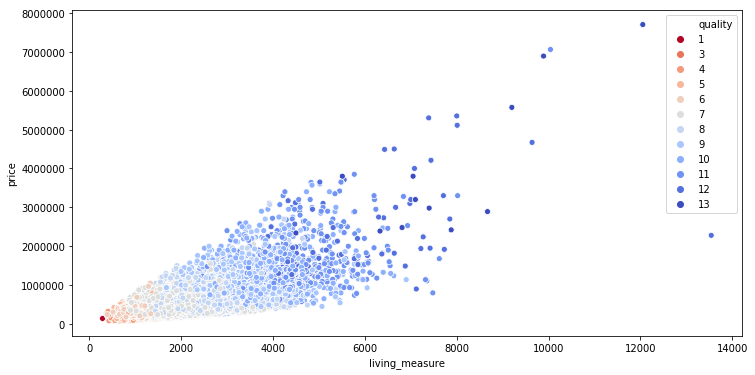

In [72]:
#quality - Viewed in relation with price and living_measure. Most houses are graded as 6 or more. 
#We can see some outliers as well
plt.figure(figsize=(plotSizeX, plotSizeY))
print(sns.scatterplot(house_df['living_measure'],house_df['price'],hue=house_df['quality'],palette='coolwarm_r',
                      legend='full'))

### Analyzing Bivariate for Feature: ceil_measure

AxesSubplot(0.125,0.125;0.775x0.755)


count    21613.000000
mean      1788.390691
std        828.090978
min        290.000000
25%       1190.000000
50%       1560.000000
75%       2210.000000
max       9410.000000
Name: ceil_measure, dtype: float64

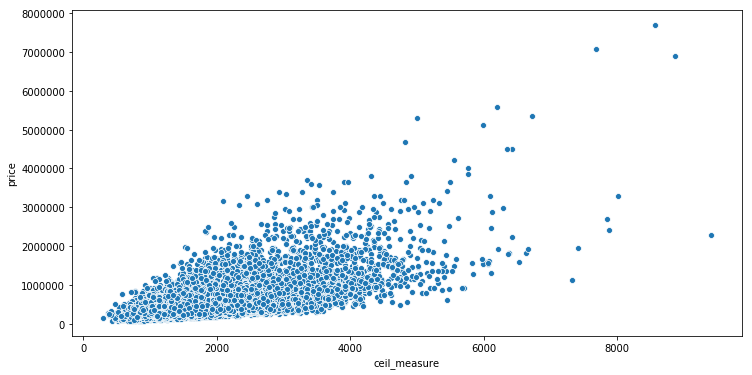

In [73]:
#ceil_measure - price increases with increase in ceil measure
plt.figure(figsize=(plotSizeX, plotSizeY))
print(sns.scatterplot(house_df['ceil_measure'],house_df['price']))
house_df['ceil_measure'].describe()

There is upward trend in price with ceil_measure

### Analyzing Bivariate for Feature: basement

AxesSubplot(0.125,0.125;0.775x0.755)


count    21613.000000
mean       291.509045
std        442.575043
min          0.000000
25%          0.000000
50%          0.000000
75%        560.000000
max       4820.000000
Name: basement, dtype: float64

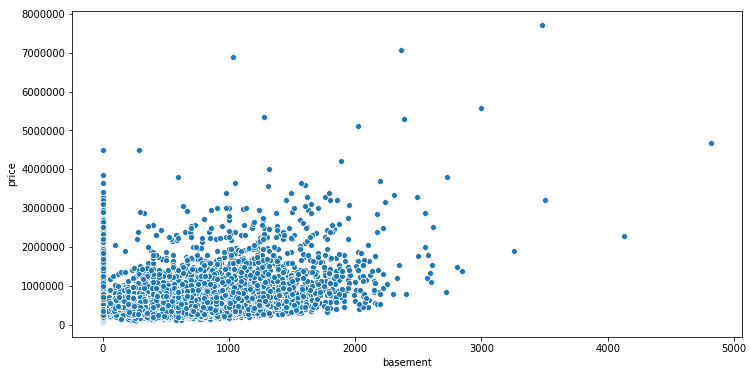

In [74]:
#basement - price increases with increase in ceil measure
plt.figure(figsize=(plotSizeX, plotSizeY))
print(sns.scatterplot(house_df['basement'],house_df['price']))
house_df['basement'].describe()

We will create the categorical variable for basement 'has_basement' for houses with basement and no basement.This categorical variable will be used for further analysis.

In [75]:
#Binning Basement to analyse data
def create_basement_group(series):
    if series == 0:
        return "No"
    elif series > 0:
        return "Yes"
    
house_df['has_basement'] = house_df['basement'].apply(create_basement_group)

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3672: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


price                living_measure              
                       mean  median   size           mean median   size
has_basement                                                           
No            486945.394789  411500  13126    1928.879628   1740  13126
Yes           622518.174384  515000   8487    2313.467539   2100   8487

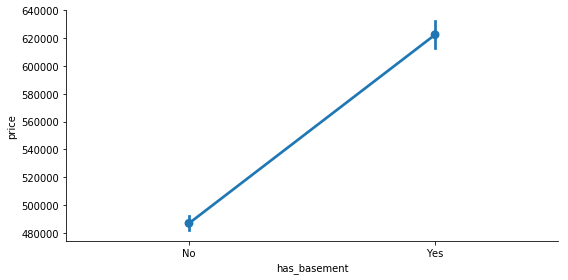

In [76]:
#basement - after binning we data shows with basement houses are costlier and have higher 
#living measure (mean & median)
print(sns.factorplot(x='has_basement',y='price',data=house_df, size = 4, aspect = 2))
house_df.groupby('has_basement')['price','living_measure'].agg(['mean','median','size'])

The houses with basement has better price compared to that of houses without basement

AxesSubplot(0.125,0.125;0.775x0.755)


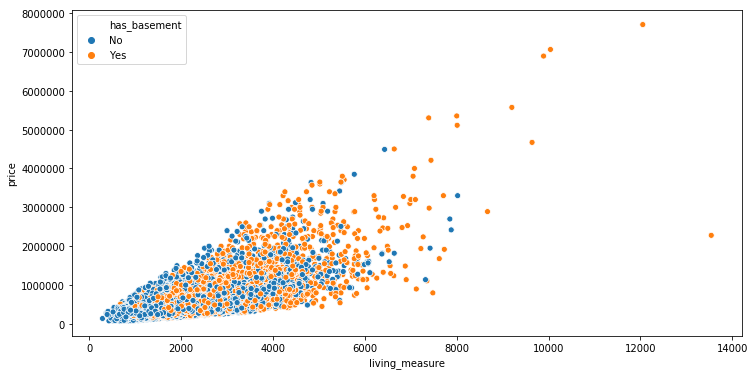

In [77]:
#basement - have higher price & living measure
plt.figure(figsize=(plotSizeX, plotSizeY))
print(sns.scatterplot(house_df['living_measure'],house_df['price'],hue=house_df['has_basement']))

AxesSubplot(0.125,0.125;0.775x0.755)


,mean,median,size
yr_built,,,
1900,581536.632184,549000,87
1901,557108.344828,550000,29
1902,673192.592593,624000,27
1903,480958.195652,461000,46
1904,583867.755556,478000,45
1905,753443.932432,597500,74
1906,670027.663043,555000,92
1907,676324.476923,595000,65
1908,564499.848837,519475,86


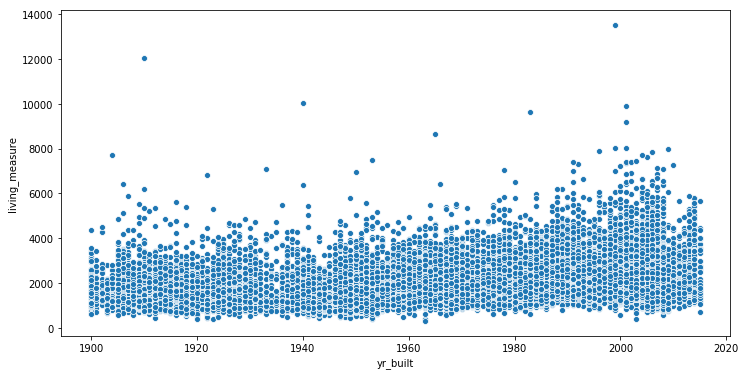

In [78]:
#yr_built - outliers can be seen easily.
plt.figure(figsize=(plotSizeX, plotSizeY))
print(sns.scatterplot(house_df['yr_built'],house_df['living_measure']))
#groupby
house_df.groupby('yr_built')['price'].agg(['mean','median','size'])

We will create new variable: Houselandratio - This is proportion of living area in the total area of the house. We will explore the trend of price against this houselandratio.

In [79]:
#HouseLandRatio - Computing new variable as ratio of living_measure/total_area
#Significes - Land used for construction of house
house_df["HouseLandRatio"]=np.round((house_df['living_measure']/house_df['total_area']),2)*100
house_df["HouseLandRatio"].head()

17786    19.0
3782     16.0
10069    16.0
7114     24.0
10080    22.0
Name: HouseLandRatio, dtype: float64

### Analyzing Bivariate for Feature: yr_renovated

AxesSubplot(0.125,0.125;0.775x0.755)


,mean,median,size
yr_renovated,,,
1934,4.599500e+05,459950.0,1
1940,3.784000e+05,378400.0,2
1944,5.210000e+05,521000.0,1
1945,3.986667e+05,375000.0,3
1946,3.511375e+05,351137.5,2
1948,4.100000e+05,410000.0,1
1950,2.914500e+05,291450.0,2
1951,2.760000e+05,276000.0,1
1953,2.458167e+05,247500.0,3


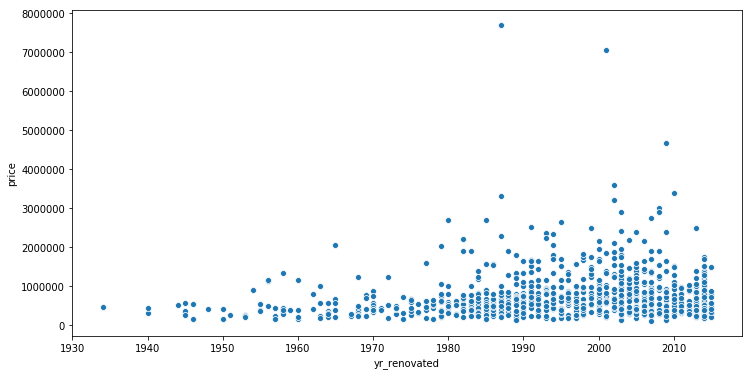

In [80]:
#yr_renovated - 
plt.figure(figsize=(plotSizeX, plotSizeY))
x=house_df[house_df['yr_renovated']>0]
print(sns.scatterplot(x['yr_renovated'],x['price']))
#groupby
x.groupby('yr_renovated')['price'].agg(['mean','median','size'])

So most houses are renovated after 1980's. We will create new categorical variable 'has_renovated' to categorize the property as renovated and non-renovated. For further ananlysis we will use this categorical variable.

In [81]:
#Lets try to group yr_renovated
#Binning Basement to analyse data
def create_renovated_group(series):
    if series == 0:
        return "No"
    elif series > 0:
        return "Yes"
    
house_df['has_renovated'] = house_df['yr_renovated'].apply(create_renovated_group)

AxesSubplot(0.125,0.125;0.775x0.755)


price                HouseLandRatio              
                        mean  median   size           mean median   size
has_renovated                                                           
No             530447.958597  448000  20699      22.067056   20.0  20699
Yes            760628.777899  600000    914      22.296499   21.0    914

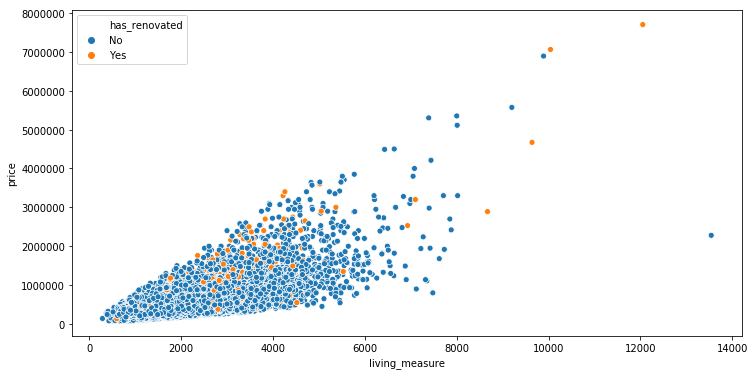

In [84]:
#has_renovated - renovated have higher mean and median, however it does not confirm if the prices of house renovated 
#actually increased or not.
#HouseLandRatio - Renovated house utilized more land area for construction of house
plt.figure(figsize=(plotSizeX, plotSizeY))
print(sns.scatterplot(house_df['living_measure'],house_df['price'],hue=house_df['has_renovated']))
#groupby
house_df.groupby(['has_renovated'])['price','HouseLandRatio'].agg(['mean','median','size'])

Renovated properties have higher price than others with same living measure space.

In [85]:
#pd.crosstab(house_df['yearbuilt_group'],house_df['has_renovated'])

AxesSubplot(0.125,0.125;0.775x0.755)


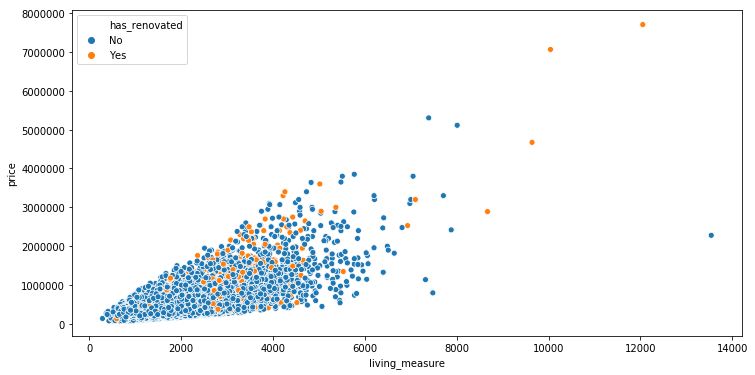

In [86]:
#has_renovated - have higher price & living measure
plt.figure(figsize=(plotSizeX, plotSizeY))
x=house_df[house_df['yr_built']<2000]
print(sns.scatterplot(x['living_measure'],x['price'],hue=x['has_renovated']))

### Analyzing Bivariate for Feature: furnished

AxesSubplot(0.125,0.125;0.775x0.755)


price                living_measure                \
                    mean  median   size           mean median   size   
furnished                                                              
0          437300.158968  401000  17362    1792.256652   1720  17362   
1          960374.414961  810000   4251    3254.696072   3110   4251   

          HouseLandRatio                
                    mean median   size  
furnished                               
0              21.508236   19.0  17362  
1              24.398730   24.0   4251

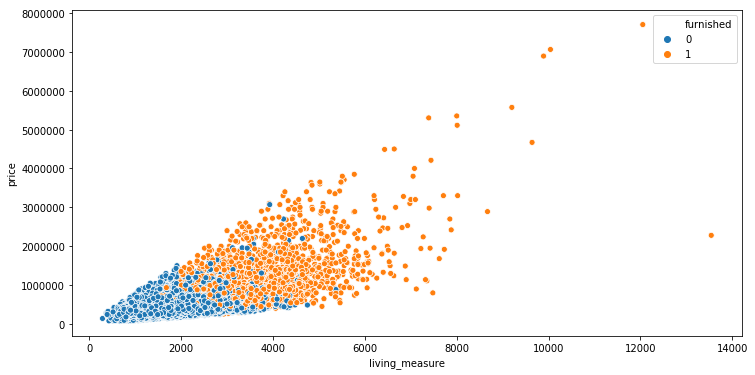

In [87]:
#furnished - Furnished has higher price value and has greater living_measure
plt.figure(figsize=(plotSizeX, plotSizeY))
print(sns.scatterplot(house_df['living_measure'],house_df['price'],hue=house_df['furnished']))
#groupby
house_df.groupby('furnished')['price','living_measure','HouseLandRatio'].agg(['mean','median','size'])

***Furnished houses have higher price than that of the Non-furnished houses***

### Analyzing Bivariate for Feature: city

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3672: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


,mean,median,size
City,,,
Medina,2.161300e+06,1895000.0,50
Mercer Island,1.194874e+06,993750.0,282
Bellevue,8.984661e+05,749000.0,1407
Sammamish,7.328210e+05,688500.0,800
Redmond,6.589089e+05,625000.0,979
Issaquah,6.151222e+05,572000.0,733
Woodinville,6.174979e+05,570000.0,471
Kirkland,6.465428e+05,510000.0,977
Snoqualmie,5.280031e+05,500000.0,310


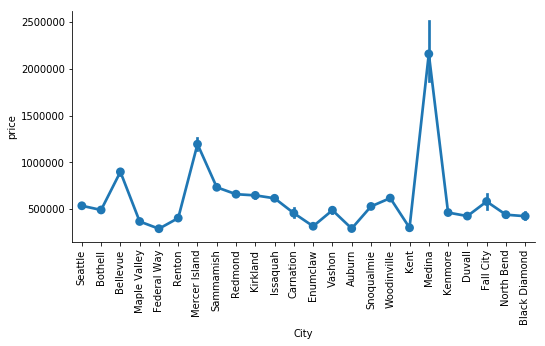

In [88]:
#City - outliers can be seen easily.

print(sns.factorplot(x='City',y='price',data=house_df, size = 4, aspect = 2))
plt.xticks(rotation=90)
#groupby
house_df.groupby('City')['price'].agg(['mean','median','size']).sort_values(by='median',ascending=False)

From the above graph, few cities have higher average price of the houses compared to others. We need to further analyse why the price varies among cities.

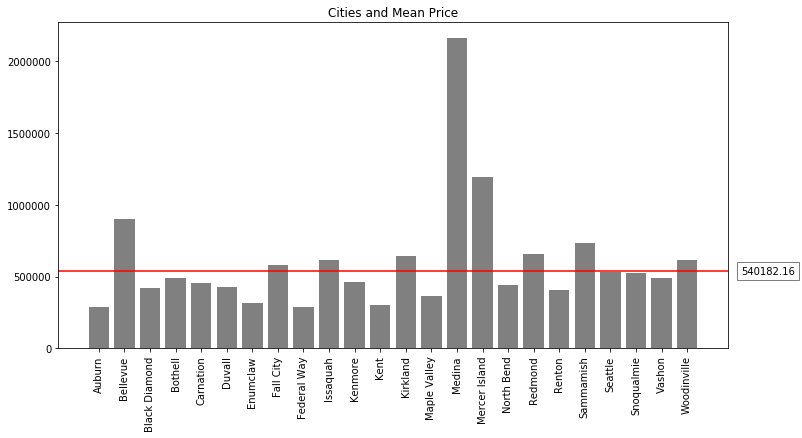

In [89]:
#City mean price distribution with average
city_price=pd.DataFrame(house_df.groupby('City')['price'].agg(['mean','median','size']))

indx=city_price.index
overall_price_mean=np.mean(house_df['price'])
overall_price_median=np.median(house_df['price'])

fig, ax1 = plt.subplots(figsize=(plotSizeX, plotSizeY))
barlist=ax1.bar(city_price.index,city_price['mean'],color='gray')
plt.xticks(rotation=90)
ax1.axhline(overall_price_mean, color="red")
ax1.text(1.02, overall_price_mean, "{0:.2f}".format(round(overall_price_mean,2)), va='center', ha="left", bbox=dict(facecolor="w",alpha=0.5),
        transform=ax1.get_yaxis_transform())
plt.title("Cities and Mean Price")
plt.show()

As we can see from above grapgh, majorly below cities have higher mean house prices
<ol>
    <li>Bellevue</li> 
    <li>Fall City</li>
    <li>Federal Way</li>
    <li>Kirkland</li>
    <li>Medina</li>
    <li>Mercer Island</li>
    <li>Redmond</li>
    <li>Sammanmish</li>
    <li>Woodinville</li>
</ol>

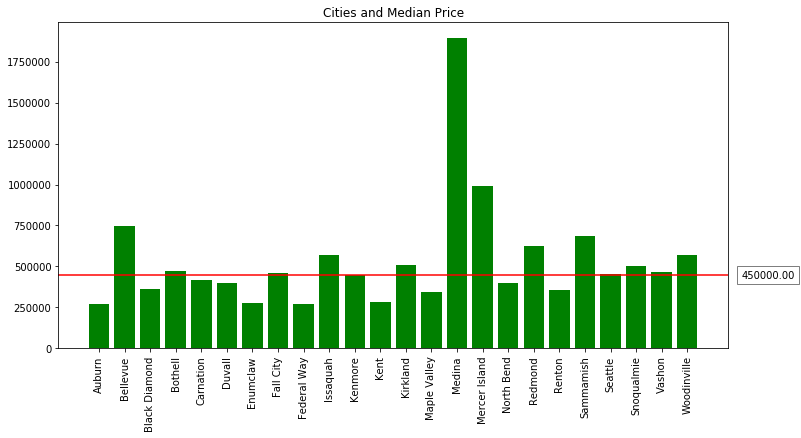

In [90]:
#City median price distribution with average
fig, ax1 = plt.subplots(figsize=(plotSizeX, plotSizeY))
barlist=ax1.bar(city_price.index,city_price['median'],color='green')
plt.xticks(rotation=90)
ax1.axhline(overall_price_median, color="red")
ax1.text(1.02, overall_price_median, "{0:.2f}".format(round(overall_price_median,2)), va='center', ha="left", bbox=dict(facecolor="w",alpha=0.5),
        transform=ax1.get_yaxis_transform())

plt.title("Cities and Median Price")
plt.show()

As we can see from above grapgh, majorly below cities have higher median house prices
<ol>
    <li>Bellevue</li> 
    <li>Bothell</li>
    <li>Issaquah</li>
    <li>Kirkland</li>
    <li>Medina</li>
    <li>Mercer Island</li>
    <li>Redmond</li>
    <li>Sammanmish</li>
    <li>Snoqualmie</li>
    <li>Woodinville</li>
</ol>

In [91]:
#let's make the copy of the dataframe, before making any furhter changes
house_df_bdp=house_df.copy()

# DATA PROCESSING

### Treating Outlilers 
We have seen outliers for columns room_bath(33 bed), living_measure, lot_measure, ceil_measure and Basement 

In [92]:
def outlier_treatment(datacolumn):
    sorted(datacolumn)
    Q1,Q3 = np.percentile(datacolumn , [25,75])
    IQR = Q3-Q1
    lower_range = Q1-(1.5 * IQR)
    upper_range = Q3+(1.5 * IQR)
    return lower_range,upper_range

Using the above function, lets get the lowerbound and upperbound values

#### Treating outliers for column - ceil_measure

In [93]:
lowerbound,upperbound = outlier_treatment(house_df.ceil_measure)
print(lowerbound,upperbound)

-340.0 3740.0


Lets check which column is considered as an outlier

In [94]:
house_df[(house_df.ceil_measure < lowerbound) | (house_df.ceil_measure > upperbound)]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,lot_measure15,furnished,total_area,month_year,City,County,Type,has_basement,HouseLandRatio,has_renovated
7142,7397300220,2014-05-29,2750000,4,3.25,4430,21000,2.0,0,0,...,20000,1,25430,May-2014,Medina,King,Standard,No,17.0,Yes
10270,3221059044,2014-05-23,799950,4,3.50,4220,196817,2.0,0,0,...,195395,1,201037,May-2014,Auburn,King,Standard,No,2.0,No
9770,2424049029,2014-05-29,3100000,6,4.25,6980,15682,3.0,0,4,...,18367,1,22662,May-2014,Mercer Island,King,Standard,Yes,31.0,No
9909,1724069059,2014-05-24,2000000,5,4.00,4580,4443,3.0,1,4,...,4443,1,9023,May-2014,Sammamish,King,Standard,No,51.0,No
3712,9359100500,2014-05-27,1800000,4,3.25,4060,13000,2.0,0,3,...,13800,1,17060,May-2014,Mercer Island,King,Standard,No,24.0,No
3628,4131900042,2014-05-16,2000000,5,4.25,6490,10862,2.0,0,3,...,14080,1,17352,May-2014,Mercer Island,King,Standard,Yes,37.0,No
18900,3521059134,2014-05-23,900000,3,3.50,4080,217697,1.5,0,3,...,217790,1,221777,May-2014,Auburn,King,Standard,No,2.0,No
13664,2481620310,2014-05-14,1120000,4,2.25,4470,60373,2.0,0,0,...,40450,1,64843,May-2014,Woodinville,King,Standard,No,7.0,No
20740,1225069038,2014-05-05,2280000,7,8.00,13540,307752,3.0,0,4,...,217800,1,321292,May-2014,Redmond,King,Standard,Yes,4.0,No
10672,3892500150,2014-05-21,1550000,3,2.50,4460,26027,2.0,0,0,...,26027,1,30487,May-2014,Kirkland,King,Standard,No,15.0,No


We got 611 records which are outliers

In [95]:
#dropping the record from the dataset
house_df.drop(house_df[ (house_df.ceil_measure > upperbound) | (house_df.ceil_measure < lowerbound) ].index, inplace=True)

In [96]:
house_df.shape

(21002, 30)

Skewness is : 0.8198869256569326


count    21002.000000
mean      1712.238168
std        696.044073
min        290.000000
25%       1180.000000
50%       1540.000000
75%       2140.000000
max       3740.000000
Name: ceil_measure, dtype: float64

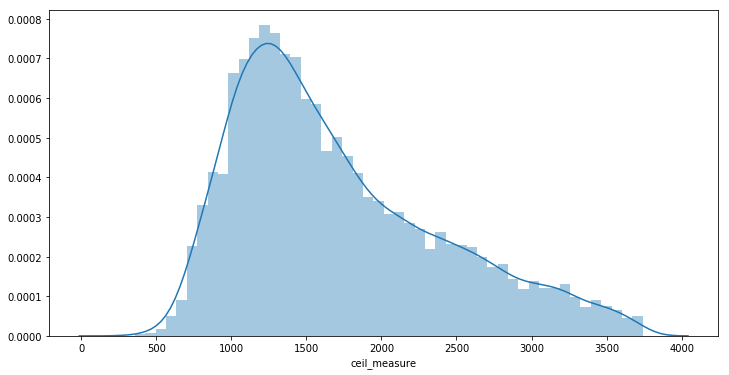

In [97]:
#ceil_measure
print("Skewness is :", house_df.ceil_measure.skew())
plt.figure(figsize=(plotSizeX, plotSizeY))
sns.distplot(house_df.ceil_measure)
house_df.ceil_measure.describe()

After treating outliers of ceil_measure, the data has reduced by about 600(~3%) data points but data is nicely distributed

#### Treating outliers for column - basement

In [98]:
lowerbound_base,upperbound_base = outlier_treatment(house_df.basement)
print(lowerbound_base,upperbound_base)

-855.0 1425.0


In [99]:
house_df[(house_df.basement < lowerbound_base) | (house_df.basement > upperbound_base)]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,lot_measure15,furnished,total_area,month_year,City,County,Type,has_basement,HouseLandRatio,has_renovated
16357,3211270170,2014-05-23,404000,4,3.00,4060,35621,1.0,0,0,...,35259,1,39681,May-2014,Auburn,King,Standard,Yes,10.0,No
7386,5700003640,2014-05-19,2100000,5,3.75,5340,10655,2.5,0,3,...,9418,1,15995,May-2014,Seattle,King,Standard,Yes,33.0,No
9727,5119010090,2014-05-10,549900,5,2.75,3060,7015,1.0,0,0,...,7600,0,10075,May-2014,Seattle,King,Standard,Yes,30.0,No
16069,7663700968,2014-05-28,565000,7,4.50,4140,9066,1.0,0,0,...,1865,0,13206,May-2014,Seattle,King,Standard,Yes,31.0,No
1783,7430200100,2014-05-14,1220000,4,3.50,4910,9444,1.5,0,0,...,11063,1,14354,May-2014,Sammamish,King,Standard,Yes,34.0,No
1145,7856410030,2014-05-05,1030000,5,2.75,3190,16920,1.0,0,3,...,13100,1,20110,May-2014,Bellevue,King,Standard,Yes,16.0,No
13624,7855801610,2014-05-19,1220000,4,2.50,3190,8684,1.0,0,3,...,8684,1,11874,May-2014,Bellevue,King,Standard,Yes,27.0,No
6610,1424059154,2014-05-16,1270000,4,3.00,5520,8313,2.0,0,3,...,8278,1,13833,May-2014,Bellevue,King,Standard,Yes,40.0,No
13951,9322800210,2014-05-20,879950,4,2.25,3500,13875,1.0,0,4,...,15000,1,17375,May-2014,Seattle,King,Standard,Yes,20.0,No
13757,4219401236,2014-05-20,1690000,3,1.75,3400,8965,1.0,0,2,...,8500,1,12365,May-2014,Seattle,King,Standard,Yes,27.0,No


We got 408 records as outliers, let's drop these outliers

In [100]:
#dropping the record from the dataset
house_df.drop(house_df[ (house_df.basement > upperbound_base) | (house_df.basement < lowerbound_base) ].index, inplace=True)

In [101]:
house_df.shape

(20594, 30)

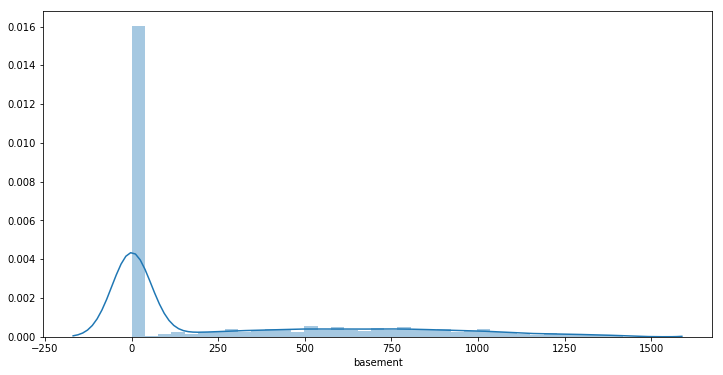

In [102]:
#basement_measure
plt.figure(figsize=(plotSizeX, plotSizeY))
sns.distplot(house_df.basement)

After treating outliers of basement, we can see that 400(~2%) data points got imputed. Total about 5% data has been imputed after treating ceil_measure and basement.

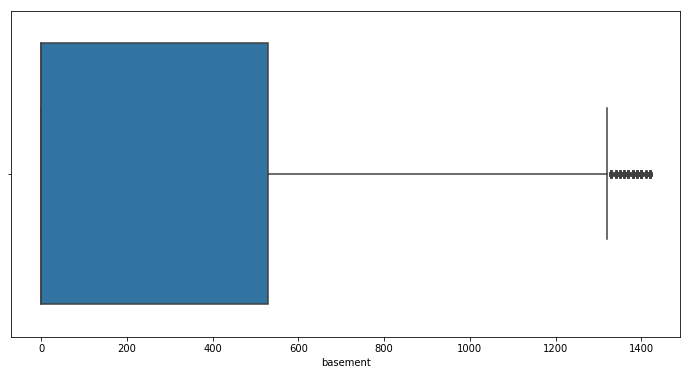

In [103]:
#Let's see the boxplot now for basement
plt.figure(figsize=(plotSizeX, plotSizeY))
sns.boxplot(house_df['basement'])

#### Treating outliers for column - living_measure

In [104]:
lowerbound_lim,upperbound_lim = outlier_treatment(house_df.living_measure)
print(lowerbound_lim,upperbound_lim)

-160.0 4000.0


In [105]:
house_df[(house_df.living_measure < lowerbound_lim) | (house_df.living_measure > upperbound_lim)]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,lot_measure15,furnished,total_area,month_year,City,County,Type,has_basement,HouseLandRatio,has_renovated
10110,6669100070,2014-05-12,900000,4,3.25,4700,38412,2.0,0,0,...,35571,1,43112,May-2014,Bellevue,King,Standard,Yes,11.0,No
7275,2926069083,2014-05-07,900000,5,3.75,4130,226076,2.0,0,0,...,55321,1,230206,May-2014,Woodinville,King,Standard,Yes,2.0,No
10549,6819100020,2014-05-29,1430000,4,4.25,4960,6000,2.5,0,0,...,4080,1,10960,May-2014,Seattle,King,Standard,Yes,45.0,Yes
1438,5093300325,2014-05-23,1610000,4,3.50,4390,11600,2.0,0,3,...,12000,1,15990,May-2014,Mercer Island,King,Standard,Yes,27.0,No
13897,7853280350,2014-05-12,809000,5,4.50,4630,6324,2.0,0,0,...,6790,1,10954,May-2014,Snoqualmie,King,Standard,Yes,42.0,No
10530,6169901185,2014-05-20,490000,5,3.50,4460,2975,3.0,0,2,...,4231,1,7435,May-2014,Seattle,King,Standard,Yes,60.0,No
6830,425079099,2014-05-07,560000,3,3.00,4120,60392,2.0,0,2,...,64033,1,64512,May-2014,Carnation,King,Standard,Yes,6.0,No
2969,7853280550,2014-05-28,700000,4,3.50,4490,5099,2.0,0,0,...,5537,1,9589,May-2014,Snoqualmie,King,Standard,Yes,47.0,No
2864,251620090,2014-05-30,2400000,4,3.25,4140,20734,1.0,0,1,...,20008,1,24874,May-2014,Bellevue,King,Standard,Yes,17.0,Yes
2680,587550280,2014-05-30,625000,4,3.25,4240,25639,2.0,0,3,...,24967,1,29879,May-2014,Federal Way,King,Standard,Yes,14.0,No


We got 178 records as outliers. Let's treat this by dropping

In [106]:
#dropping the record from the dataset
house_df.drop(house_df[ (house_df.living_measure > upperbound_lim) | (house_df.living_measure < lowerbound_lim) ].index, inplace=True)

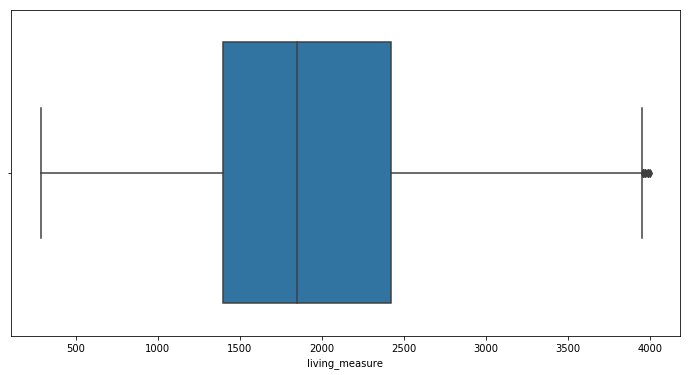

In [107]:
#let's see the boxplot after dropping the outliers
plt.figure(figsize=(plotSizeX, plotSizeY))
sns.boxplot(house_df['living_measure'])

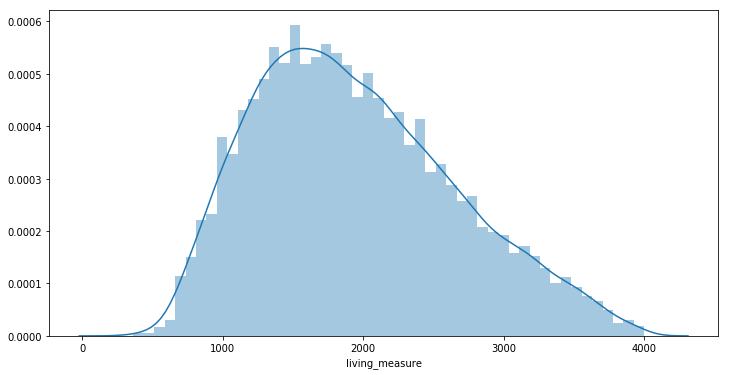

In [108]:
plt.figure(figsize=(plotSizeX, plotSizeY))
sns.distplot(house_df.living_measure)

By treating outliers of living_measure, we lost 178 data points more and data distribution looks normal

In [109]:
# shape of the data after imputing outliers in living_column
house_df.shape

(20416, 30)

#### Treating outliers for column - lot_measure

In [110]:
lowerbound_lom,upperbound_lom = outlier_treatment(house_df.lot_measure)
print(lowerbound_lom,upperbound_lom)

-2774.875 17958.125


In [111]:
house_df[(house_df.lot_measure < lowerbound_lom) | (house_df.lot_measure > upperbound_lom)]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,lot_measure15,furnished,total_area,month_year,City,County,Type,has_basement,HouseLandRatio,has_renovated
10082,1121039059,2014-05-22,503000,2,1.75,2860,59612,1.0,1,4,...,59612,0,62472,May-2014,Federal Way,King,Standard,Yes,5.0,Yes
14089,6070500055,2014-05-06,599000,4,2.25,2260,29930,2.0,0,0,...,29930,0,32190,May-2014,Bellevue,King,Standard,Yes,7.0,No
1611,5561000190,2014-05-02,437500,3,2.25,1970,35100,2.0,0,0,...,35100,1,37070,May-2014,Issaquah,King,Standard,No,5.0,No
14068,5111400086,2014-05-12,110000,3,1.00,1250,53143,1.0,0,0,...,217800,0,54393,May-2014,Maple Valley,King,Standard,No,2.0,No
14081,3022039071,2014-05-30,800000,2,2.25,1730,31491,2.0,1,2,...,12410,0,33221,May-2014,Vashon,King,Standard,No,5.0,Yes
20351,9808610190,2014-05-09,782000,4,2.50,2830,20345,2.0,0,0,...,13732,1,23175,May-2014,Bellevue,King,Standard,Yes,12.0,No
9981,2324800350,2014-05-06,860000,4,2.00,3740,32417,2.0,0,0,...,32417,1,36157,May-2014,Redmond,King,Standard,No,10.0,No
16273,1823069279,2014-05-20,499950,5,3.50,3200,43560,2.0,0,0,...,43560,0,46760,May-2014,Renton,King,Standard,No,7.0,No
16325,7214700160,2014-05-09,610000,3,3.00,2480,45302,1.0,0,0,...,14100,0,47782,May-2014,Woodinville,King,Standard,Yes,5.0,No
10030,2025700730,2014-05-02,287200,3,3.00,1850,19966,1.0,0,0,...,6715,0,21816,May-2014,Maple Valley,King,Standard,Yes,8.0,No


We got 2155 records which are outliers. Let's drop these outlier records.

In [112]:
#dropping the record from the dataset
house_df.drop(house_df[ (house_df.lot_measure > upperbound_lom) | (house_df.lot_measure < lowerbound_lom) ].index, inplace=True)

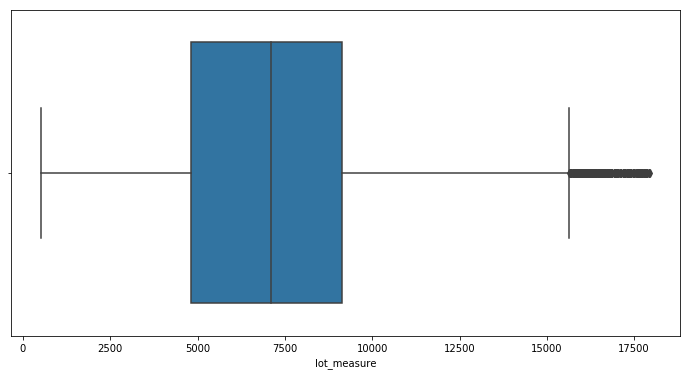

In [113]:
#let's plot after treating outliers
plt.figure(figsize=(plotSizeX, plotSizeY))
sns.boxplot(house_df['lot_measure'])

In [114]:
house_df.shape

(18288, 30)

Total outliers in the lot_measure are 2128 data points. But still we are going ahead with imputing the data. We will analyze later whether there is any impact on the data set or not. 

#### Treating outliers for column - room_bed

In [115]:
#As we know for room_bed = 33 was outlier from our earlier findings, let's see the record and drop it
house_df[house_df['room_bed']==33]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,lot_measure15,furnished,total_area,month_year,City,County,Type,has_basement,HouseLandRatio,has_renovated
750,2402100895,2014-06-25,640000,33,1.75,1620,6000,1.0,0,0,...,4700,0,7620,June-2014,Seattle,King,Standard,Yes,21.0,No


In [116]:
#dropping the record from the dataset
house_df.drop(house_df[ (house_df.room_bed == 33) ].index, inplace=True)

In [117]:
house_df.shape

(18287, 30)

##### In summary, after treating outliers, we have lost about 15% of the data. We will analyse the impact of this data loss during the model evaluation.

In [118]:
#let's see the feature/columns and drop the unneccessary features
house_df.columns

Index(['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'living_measure15', 'lot_measure15', 'furnished',
       'total_area', 'month_year', 'City', 'County', 'Type', 'has_basement',
       'HouseLandRatio', 'has_renovated'],
      dtype='object')

As we already have this information in other features. We will drop the unwanted columns from new copied dataframe instance : cid,dayhours,yr_renovated,zipcode,lat,long,county,type

In [119]:
#Let's create another dataframe for modeling
df_model=house_df.copy()

In [120]:
#let's check the new copy of dataframe by printing first few records
df_model.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,lot_measure15,furnished,total_area,month_year,City,County,Type,has_basement,HouseLandRatio,has_renovated
17786,7568700740,2014-05-21,430000,3,2.75,2550,11160,2.0,0,0,...,7440,0,13710,May-2014,Seattle,King,Standard,No,19.0,No
3782,2248000080,2014-05-21,385500,3,2.00,1540,7947,1.0,0,0,...,7950,0,9487,May-2014,Bothell,King,Standard,Yes,16.0,No
10069,7805450110,2014-05-06,736000,4,2.50,2290,12047,2.0,0,0,...,15666,1,14337,May-2014,Bellevue,King,Standard,No,16.0,No
7114,2215500080,2014-05-28,580000,5,2.00,1940,6000,1.0,0,0,...,6000,0,7940,May-2014,Seattle,King,Standard,Yes,24.0,No
10080,1219000043,2014-05-09,315000,5,1.75,2320,8100,1.0,0,0,...,7271,0,10420,May-2014,Seattle,King,Standard,Yes,22.0,No


New instance of dataframe for model created successfully

In [121]:
#let's verify the columns
df_model.columns

Index(['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'living_measure15', 'lot_measure15', 'furnished',
       'total_area', 'month_year', 'City', 'County', 'Type', 'has_basement',
       'HouseLandRatio', 'has_renovated'],
      dtype='object')

In [122]:
#Dropping the feature not required in 1st Iteration
df_final=df_model.drop(['cid','dayhours','yr_renovated','zipcode','lat','long','County','Type'],axis=1)

In [123]:
df_final.shape

(18287, 22)

In [124]:
df_final.head()

,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,...,yr_built,living_measure15,lot_measure15,furnished,total_area,month_year,City,has_basement,HouseLandRatio,has_renovated
17786,430000,3,2.75,2550,11160,2.0,0,0,3,8,...,1994,1020,7440,0,13710,May-2014,Seattle,No,19.0,No
3782,385500,3,2.00,1540,7947,1.0,0,0,3,7,...,1961,1910,7950,0,9487,May-2014,Bothell,Yes,16.0,No
10069,736000,4,2.50,2290,12047,2.0,0,0,4,9,...,1988,3130,15666,1,14337,May-2014,Bellevue,No,16.0,No
7114,580000,5,2.00,1940,6000,1.0,0,0,5,7,...,1945,1700,6000,0,7940,May-2014,Seattle,Yes,24.0,No
10080,315000,5,1.75,2320,8100,1.0,0,0,4,7,...,1956,1410,7271,0,10420,May-2014,Seattle,Yes,22.0,No


In [125]:
df_final.columns

Index(['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'coast', 'sight', 'condition', 'quality', 'ceil_measure',
       'basement', 'yr_built', 'living_measure15', 'lot_measure15',
       'furnished', 'total_area', 'month_year', 'City', 'has_basement',
       'HouseLandRatio', 'has_renovated'],
      dtype='object')

##### Creating dummies for categorical variables: 'room_bed', 'room_bath', 'ceil', 'coast', 'sight', 'condition', 'quality', 'furnished','City', 'has_basement', 'has_renovated'

In [126]:
# Getting dummies for columns ceil, coast, sight, condition, quality, yr_renovated, furnished
dff = pd.get_dummies(df_final, columns=['room_bed', 'room_bath', 'ceil', 'coast', 'sight', 'condition', 'quality', 'furnished','City', 
                                        'has_basement', 'has_renovated'],drop_first=True)


In [127]:
# let's see the data types of the features
dff.shape

(18287, 92)

In [128]:
dff.columns

Index(['price', 'living_measure', 'lot_measure', 'ceil_measure', 'basement',
       'yr_built', 'living_measure15', 'lot_measure15', 'total_area',
       'month_year', 'HouseLandRatio', 'room_bed_1', 'room_bed_2',
       'room_bed_3', 'room_bed_4', 'room_bed_5', 'room_bed_6', 'room_bed_7',
       'room_bed_8', 'room_bed_9', 'room_bed_10', 'room_bed_11',
       'room_bath_0.5', 'room_bath_0.75', 'room_bath_1.0', 'room_bath_1.25',
       'room_bath_1.5', 'room_bath_1.75', 'room_bath_2.0', 'room_bath_2.25',
       'room_bath_2.5', 'room_bath_2.75', 'room_bath_3.0', 'room_bath_3.25',
       'room_bath_3.5', 'room_bath_3.75', 'room_bath_4.0', 'room_bath_4.25',
       'room_bath_4.5', 'room_bath_4.75', 'room_bath_5.0', 'room_bath_5.25',
       'room_bath_5.75', 'ceil_1.5', 'ceil_2.0', 'ceil_2.5', 'ceil_3.0',
       'ceil_3.5', 'coast_1', 'sight_1', 'sight_2', 'sight_3', 'sight_4',
       'condition_2', 'condition_3', 'condition_4', 'condition_5', 'quality_4',
       'quality_5', 'quality_6',

## Ready for model building

### 'dff' is the data frame which is ready for modeling

In [129]:
dff.head()

,price,living_measure,lot_measure,ceil_measure,basement,yr_built,living_measure15,lot_measure15,total_area,month_year,...,City_North Bend,City_Redmond,City_Renton,City_Sammamish,City_Seattle,City_Snoqualmie,City_Vashon,City_Woodinville,has_basement_Yes,has_renovated_Yes
17786,430000,2550,11160,2550,0,1994,1020,7440,13710,May-2014,...,0,0,0,0,1,0,0,0,0,0
3782,385500,1540,7947,1120,420,1961,1910,7950,9487,May-2014,...,0,0,0,0,0,0,0,0,1,0
10069,736000,2290,12047,2290,0,1988,3130,15666,14337,May-2014,...,0,0,0,0,0,0,0,0,0,0
7114,580000,1940,6000,970,970,1945,1700,6000,7940,May-2014,...,0,0,0,0,1,0,0,0,1,0
10080,315000,2320,8100,1160,1160,1956,1410,7271,10420,May-2014,...,0,0,0,0,1,0,0,0,1,0


In [130]:
#let's drop the month_year column as we already analyzed it
dff=dff.drop(['month_year'],axis=1)

In [131]:
#Creating X, y for training and testing set
X = dff.drop("price" , axis=1)
y = dff["price"]

In [132]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=10)

In [133]:
print(X_train.shape)
print(X_test.shape)
print(X_val.shape)

(11703, 90)
(3658, 90)
(2926, 90)


In [134]:
dff.head()

,price,living_measure,lot_measure,ceil_measure,basement,yr_built,living_measure15,lot_measure15,total_area,HouseLandRatio,...,City_North Bend,City_Redmond,City_Renton,City_Sammamish,City_Seattle,City_Snoqualmie,City_Vashon,City_Woodinville,has_basement_Yes,has_renovated_Yes
17786,430000,2550,11160,2550,0,1994,1020,7440,13710,19.0,...,0,0,0,0,1,0,0,0,0,0
3782,385500,1540,7947,1120,420,1961,1910,7950,9487,16.0,...,0,0,0,0,0,0,0,0,1,0
10069,736000,2290,12047,2290,0,1988,3130,15666,14337,16.0,...,0,0,0,0,0,0,0,0,0,0
7114,580000,1940,6000,970,970,1945,1700,6000,7940,24.0,...,0,0,0,0,1,0,0,0,1,0
10080,315000,2320,8100,1160,1160,1956,1410,7271,10420,22.0,...,0,0,0,0,1,0,0,0,1,0


# Model building

Let's build the model and see their performances

### Linear Regression (with Ridge and Lasso)

In [135]:
#importing the necessary libraries
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso

from sklearn import metrics
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

In [136]:
LR1 = LinearRegression()
LR1.fit(X_train, y_train)
#predicting result over test data
y_LR1_predtr= LR1.predict(X_train)
y_LR1_predvl= LR1.predict(X_val)

LR1.coef_

array([ 4.65340600e+01, -2.60438290e+01,  4.15085952e+01,  5.02547332e+00,
       -2.04412513e+03,  5.35189660e+01, -1.85866571e+00,  2.04902213e+01,
        1.71493571e+02, -1.52366392e+04, -1.71559917e+02, -7.41190980e+03,
       -2.49409439e+04, -3.38428650e+04, -7.05629386e+04, -1.39570745e+05,
       -6.13484472e+04, -5.01063903e+04, -1.54205825e+05, -2.24656830e+05,
        1.25982909e+04,  8.20853745e+04,  9.07899656e+04,  2.27686059e+05,
        9.03633165e+04,  1.00072705e+05,  1.08362140e+05,  1.12686599e+05,
        1.12536191e+05,  1.13322504e+05,  1.30547366e+05,  1.77676262e+05,
        1.64433901e+05,  2.85527951e+05,  1.71382012e+05,  1.61500051e+05,
        1.74737226e+05,  9.19752797e+05,  1.55294652e+05,  2.95336027e+05,
       -7.18864612e-09,  1.64060215e+04,  1.53741629e+04,  5.55177883e+04,
        5.71678128e+04,  7.56908538e+04,  2.60659481e+05,  4.01215839e+04,
        4.57278795e+04,  1.17418144e+05,  2.55845105e+05,  9.85063804e+04,
        1.30265390e+05,  

In [137]:
#Model score and Deduction for each Model in a DataFrame
LR1_trscore=r2_score(y_train,y_LR1_predtr)
LR1_trRMSE=np.sqrt(mean_squared_error(y_train, y_LR1_predtr))
LR1_trMSE=mean_squared_error(y_train, y_LR1_predtr)
LR1_trMAE=mean_absolute_error(y_train, y_LR1_predtr)

LR1_vlscore=r2_score(y_val,y_LR1_predvl)
LR1_vlRMSE=np.sqrt(mean_squared_error(y_val, y_LR1_predvl))
LR1_vlMSE=mean_squared_error(y_val, y_LR1_predvl)
LR1_vlMAE=mean_absolute_error(y_val, y_LR1_predvl)

Compa_df=pd.DataFrame({'Method':['Linear Reg Model1'],'Val Score':LR1_vlscore,'RMSE_vl': LR1_vlRMSE, 'MSE_vl': LR1_vlMSE, 'MAE_vl': LR1_vlMAE,'train Score':LR1_trscore,'RMSE_tr': LR1_trRMSE, 'MSE_tr': LR1_trMSE, 'MAE_tr': LR1_trMAE})

#Compa_df = Compa_df[['Method', 'Test Score', 'RMSE', 'MSE', 'MAE']]

Compa_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg Model1,0.718749,137733.698415,1.897057e+10,93994.455301,0.730112,132958.367261,1.767793e+10,92391.001786


The linear regression model performed with scores 0.73 & .72 in training data set and validation data set respectively

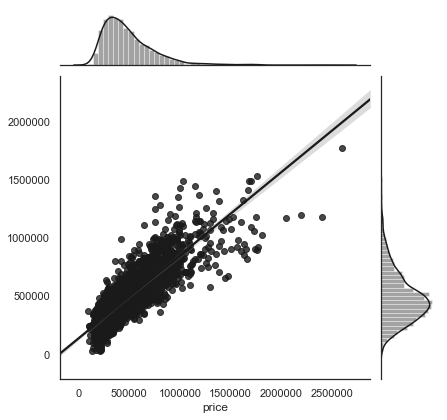

In [138]:
sns.set(style="darkgrid", color_codes=True)
            
with sns.axes_style("white"):
    sns.jointplot(x=y_val, y=y_LR1_predvl, kind="reg", color="k")

#### Lasso model

In [139]:
Lasso1 = Lasso(alpha=1)
Lasso1.fit(X_train, y_train)

#predicting result over test data
y_Lasso1_predtr= Lasso1.predict(X_train)
y_Lasso1_predvl= Lasso1.predict(X_val)

Lasso1.coef_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


array([ 9.65902931e+01, -3.93953142e+00,  1.35529095e+01, -2.29061776e+01,
       -2.04163675e+03,  5.35553554e+01, -1.85807486e+00, -1.60949858e+00,
        1.73465396e+02,  2.58275091e+04,  4.11967331e+04,  3.40052776e+04,
        1.64885732e+04,  7.61896026e+03, -2.86912815e+04, -9.69275851e+04,
       -1.65210854e+04, -4.12121513e+03, -1.00992716e+05, -1.71298527e+05,
       -9.13241618e+04, -2.48925268e+04, -1.60169381e+04,  1.18516529e+05,
       -1.64860326e+04, -6.79525494e+03,  1.46220219e+03,  5.75895038e+03,
        5.60351070e+03,  6.32472345e+03,  2.34670403e+04,  7.06751057e+04,
        5.73457320e+04,  1.78131982e+05,  6.38573909e+04,  5.27207711e+04,
        6.65775444e+04,  8.00797041e+05,  4.05485728e+04,  1.84114085e+05,
        0.00000000e+00,  1.64275884e+04,  1.53464259e+04,  5.53276759e+04,
        5.70768344e+04,  7.27284380e+04,  2.60559411e+05,  3.99774418e+04,
        4.57348433e+04,  1.17367493e+05,  2.55764846e+05,  9.44643505e+04,
        1.25980055e+05,  

In [140]:
#Model score and Deduction for each Model in a DataFrame
Lasso1_trscore=r2_score(y_train,y_Lasso1_predtr)
Lasso1_trRMSE=np.sqrt(mean_squared_error(y_train, y_Lasso1_predtr))
Lasso1_trMSE=mean_squared_error(y_train, y_Lasso1_predtr)
Lasso1_trMAE=mean_absolute_error(y_train, y_Lasso1_predtr)

Lasso1_vlscore=r2_score(y_val,y_Lasso1_predvl)
Lasso1_vlRMSE=np.sqrt(mean_squared_error(y_val, y_Lasso1_predvl))
Lasso1_vlMSE=mean_squared_error(y_val, y_Lasso1_predvl)
Lasso1_vlMAE=mean_absolute_error(y_val, y_Lasso1_predvl)

Lasso1_df=pd.DataFrame({'Method':['Linear-Reg Lasso1'],'Val Score':Lasso1_vlscore,'RMSE_vl': Lasso1_vlRMSE, 'MSE_vl': Lasso1_vlMSE, 'MAE_vl': Lasso1_vlMAE,'train Score':Lasso1_trscore,'RMSE_tr': Lasso1_trRMSE, 'MSE_tr': Lasso1_trMSE, 'MAE_tr': Lasso1_trMAE})
Compa_df = pd.concat([Compa_df, Lasso1_df])

Compa_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg Model1,0.718749,137733.698415,1.897057e+10,93994.455301,0.730112,132958.367261,1.767793e+10,92391.001786
0,Linear-Reg Lasso1,0.719117,137643.639712,1.894577e+10,93939.441186,0.730092,132963.180396,1.767921e+10,92403.854117


The lasso linear regression model performed with scores 0.73 & .72 in training data set and validation data set respectively. The coefficeints of 1 variable in lasso model is almost '0', signifying that the variable with '0' coefficient can be dropped.

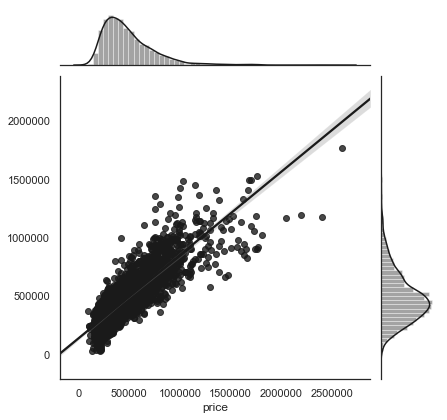

In [141]:
sns.set(style="darkgrid", color_codes=True)
            
with sns.axes_style("white"):
    sns.jointplot(x=y_val, y=y_Lasso1_predvl, kind="reg", color="k")

#### Ridge model

In [142]:
Ridge1 = Ridge(alpha=0.5)
Ridge1.fit(X_train, y_train)

#predicting result over test data
y_Ridge1_predtr= Ridge1.predict(X_train)
y_Ridge1_predvl= Ridge1.predict(X_val)

Ridge1.coef_

array([ 4.66834622e+01, -2.60918244e+01,  4.15530007e+01,  5.13138900e+00,
       -2.04329070e+03,  5.40305072e+01, -1.83894732e+00,  2.05899911e+01,
        1.99149390e+02,  4.75922037e+04,  6.34342640e+04,  5.62050467e+04,
        3.84394798e+04,  2.95688617e+04, -6.95633001e+03, -7.29503951e+04,
        2.07847666e+03,  1.15197429e+04, -6.08136975e+04, -1.07506532e+05,
       -1.24763131e+05, -6.99157975e+04, -6.12127626e+04,  6.84637990e+04,
       -6.18022272e+04, -5.21975799e+04, -4.39150711e+04, -3.96547935e+04,
       -4.00644775e+04, -3.93829165e+04, -2.22301737e+04,  2.63190006e+04,
        1.13660948e+04,  1.31445711e+05,  1.79480665e+04,  7.08429226e+03,
        2.07235857e+04,  5.06032623e+05,  1.96912226e+03,  1.26354803e+05,
        0.00000000e+00,  1.62595610e+04,  1.52860502e+04,  5.48436035e+04,
        5.68361232e+04,  6.73075467e+04,  2.58145115e+05,  3.96081664e+04,
        4.58498930e+04,  1.16570206e+05,  2.54669644e+05,  8.12334931e+04,
        1.12963518e+05,  

In [143]:
#Model score and Deduction for each Model in a DataFrame
Ridge1_trscore=r2_score(y_train,y_Ridge1_predtr)
Ridge1_trRMSE=np.sqrt(mean_squared_error(y_train, y_Ridge1_predtr))
Ridge1_trMSE=mean_squared_error(y_train, y_Ridge1_predtr)
Ridge1_trMAE=mean_absolute_error(y_train, y_Ridge1_predtr)

Ridge1_vlscore=r2_score(y_val,y_Ridge1_predvl)
Ridge1_vlRMSE=np.sqrt(mean_squared_error(y_val, y_Ridge1_predvl))
Ridge1_vlMSE=mean_squared_error(y_val, y_Ridge1_predvl)
Ridge1_vlMAE=mean_absolute_error(y_val, y_Ridge1_predvl)

Ridge1_df=pd.DataFrame({'Method':['Linear-Reg Ridge1'],'Val Score':Ridge1_vlscore,'RMSE_vl': Ridge1_vlRMSE, 'MSE_vl': Ridge1_vlMSE, 'MAE_vl': Ridge1_vlMAE,'train Score':Ridge1_trscore,'RMSE_tr': Ridge1_trRMSE, 'MSE_tr': Ridge1_trMSE, 'MAE_tr': Ridge1_trMAE})
Compa_df = pd.concat([Compa_df, Ridge1_df])

Compa_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg Model1,0.718749,137733.698415,1.897057e+10,93994.455301,0.730112,132958.367261,1.767793e+10,92391.001786
0,Linear-Reg Lasso1,0.719117,137643.639712,1.894577e+10,93939.441186,0.730092,132963.180396,1.767921e+10,92403.854117
0,Linear-Reg Ridge1,0.718929,137689.597398,1.895843e+10,93992.809617,0.729789,133037.735155,1.769904e+10,92497.255174


The Ridge linear regression model performed with scores 0.73 & .72 in training data set and validation data set respectively. The coefficeints of variables in ridge model are all non-zero, indicating that non of the variables can be dropped.

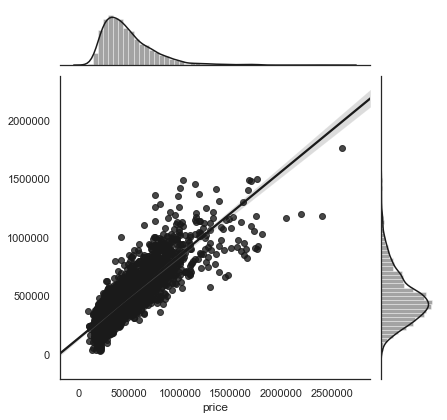

In [144]:
sns.set(style="darkgrid", color_codes=True)
            
with sns.axes_style("white"):
    sns.jointplot(x=y_val, y=y_Ridge1_predvl, kind="reg", color="k")

In summary, Linear models have performed almost with similar results in both regularized model and non-regularized models

### KNN Regressor

In [145]:
from sklearn.neighbors import KNeighborsRegressor

In [146]:
knn1 = KNeighborsRegressor(n_neighbors=4,weights='distance')
knn1.fit(X_train, y_train)

#predicting result over test data
y_knn1_predtr= knn1.predict(X_train)
y_knn1_predvl= knn1.predict(X_val)


In [147]:
#Model score and Deduction for each Model in a DataFrame
knn1_trscore=r2_score(y_train,y_knn1_predtr)
knn1_trRMSE=np.sqrt(mean_squared_error(y_train, y_knn1_predtr))
knn1_trMSE=mean_squared_error(y_train, y_knn1_predtr)
knn1_trMAE=mean_absolute_error(y_train, y_knn1_predtr)

knn1_vlscore=r2_score(y_val,y_knn1_predvl)
knn1_vlRMSE=np.sqrt(mean_squared_error(y_val, y_knn1_predvl))
knn1_vlMSE=mean_squared_error(y_val, y_knn1_predvl)
knn1_vlMAE=mean_absolute_error(y_val, y_knn1_predvl)

knn1_df=pd.DataFrame({'Method':['knn1'],'Val Score':knn1_vlscore,'RMSE_vl': knn1_vlRMSE, 'MSE_vl': knn1_vlMSE, 'MAE_vl': knn1_vlMAE,'train Score':knn1_trscore,'RMSE_tr': knn1_trRMSE, 'MSE_tr': knn1_trMSE, 'MAE_tr': knn1_trMAE})
Compa_df = pd.concat([Compa_df, knn1_df])

Compa_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg Model1,0.718749,137733.698415,1.897057e+10,93994.455301,0.730112,132958.367261,1.767793e+10,92391.001786
0,Linear-Reg Lasso1,0.719117,137643.639712,1.894577e+10,93939.441186,0.730092,132963.180396,1.767921e+10,92403.854117
0,Linear-Reg Ridge1,0.718929,137689.597398,1.895843e+10,93992.809617,0.729789,133037.735155,1.769904e+10,92497.255174
0,knn1,0.425008,196935.451160,3.878357e+10,138494.383286,0.998628,9480.192071,8.987404e+07,887.708707


Though KNN regressor performed well in training set, the performance score in validation set is very less. This shows that the model is overfitted in training set

### Support vector regressor

In [148]:
from sklearn.svm import SVR

In [149]:
SVR1 = SVR(gamma='auto',C=10.0, epsilon=0.2,kernel='rbf')
SVR1.fit(X_train, y_train)

y_SVR1_predtr= SVR1.predict(X_train)
y_SVR1_predvl= SVR1.predict(X_val)

In [150]:
#Model score and Deduction for each Model in a DataFrame
SVR1_trscore=r2_score(y_train,y_SVR1_predtr)
SVR1_trRMSE=np.sqrt(mean_squared_error(y_train, y_SVR1_predtr))
SVR1_trMSE=mean_squared_error(y_train, y_SVR1_predtr)
SVR1_trMAE=mean_absolute_error(y_train, y_SVR1_predtr)

SVR1_vlscore=r2_score(y_val,y_SVR1_predvl)
SVR1_vlRMSE=np.sqrt(mean_squared_error(y_val, y_SVR1_predvl))
SVR1_vlMSE=mean_squared_error(y_val, y_SVR1_predvl)
SVR1_vlMAE=mean_absolute_error(y_val, y_SVR1_predvl)

SVR1_df=pd.DataFrame({'Method':['SVR1'],'Val Score':SVR1_vlscore,'RMSE_vl': SVR1_vlRMSE, 'MSE_vl': SVR1_vlMSE, 'MAE_vl': SVR1_vlMAE,'train Score':SVR1_trscore,'RMSE_tr': SVR1_trRMSE, 'MSE_tr': SVR1_trMSE, 'MAE_tr': SVR1_trMAE})
Compa_df = pd.concat([Compa_df, SVR1_df])

Compa_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg Model1,0.718749,137733.698415,1.897057e+10,93994.455301,0.730112,132958.367261,1.767793e+10,92391.001786
0,Linear-Reg Lasso1,0.719117,137643.639712,1.894577e+10,93939.441186,0.730092,132963.180396,1.767921e+10,92403.854117
0,Linear-Reg Ridge1,0.718929,137689.597398,1.895843e+10,93992.809617,0.729789,133037.735155,1.769904e+10,92497.255174
0,knn1,0.425008,196935.451160,3.878357e+10,138494.383286,0.998628,9480.192071,8.987404e+07,887.708707
0,SVR1,-0.055489,266820.956555,7.119342e+10,183639.593215,-0.046405,261802.341726,6.854047e+10,179434.350170


The above negative scores in SVR model is due to non-learning of the model in the training set which results in non-performance in validation set

In [151]:
SVR2 = SVR(gamma='auto',C=0.1,kernel='linear')
SVR2.fit(X_train, y_train)

y_SVR2_predtr= SVR2.predict(X_train)
y_SVR2_predvl= SVR2.predict(X_val)

#Model score and Deduction for each Model in a DataFrame
SVR2_trscore=r2_score(y_train,y_SVR2_predtr)
SVR2_trRMSE=np.sqrt(mean_squared_error(y_train, y_SVR2_predtr))
SVR2_trMSE=mean_squared_error(y_train, y_SVR2_predtr)
SVR2_trMAE=mean_absolute_error(y_train, y_SVR2_predtr)

SVR2_vlscore=r2_score(y_val,y_SVR2_predvl)
SVR2_vlRMSE=np.sqrt(mean_squared_error(y_val, y_SVR2_predvl))
SVR2_vlMSE=mean_squared_error(y_val, y_SVR2_predvl)
SVR2_vlMAE=mean_absolute_error(y_val, y_SVR2_predvl)

SVR2_df=pd.DataFrame({'Method':['SVR2'],'Val Score':SVR2_vlscore,'RMSE_vl': SVR2_vlRMSE, 'MSE_vl': SVR2_vlMSE, 'MAE_vl': SVR2_vlMAE,'train Score':SVR2_trscore,'RMSE_tr': SVR2_trRMSE, 'MSE_tr': SVR2_trMSE, 'MAE_tr': SVR2_trMAE})
Compa_df = pd.concat([Compa_df, SVR2_df])

Compa_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg Model1,0.718749,137733.698415,1.897057e+10,93994.455301,0.730112,132958.367261,1.767793e+10,92391.001786
0,Linear-Reg Lasso1,0.719117,137643.639712,1.894577e+10,93939.441186,0.730092,132963.180396,1.767921e+10,92403.854117
0,Linear-Reg Ridge1,0.718929,137689.597398,1.895843e+10,93992.809617,0.729789,133037.735155,1.769904e+10,92497.255174
0,knn1,0.425008,196935.451160,3.878357e+10,138494.383286,0.998628,9480.192071,8.987404e+07,887.708707
0,SVR1,-0.055489,266820.956555,7.119342e+10,183639.593215,-0.046405,261802.341726,6.854047e+10,179434.350170
0,SVR2,0.458252,191157.623415,3.654124e+10,132876.663665,0.454410,189041.408746,3.573665e+10,130250.868504


The SVR model with modified parameters has not performed well with just ~0.45 in both training and validation data sets

### Decision Tree Regressor

In [152]:
from sklearn.tree import DecisionTreeRegressor

In [153]:
DT1 = DecisionTreeRegressor()
DT1.fit(X_train, y_train)

y_DT1_predtr= DT1.predict(X_train)
y_DT1_predvl= DT1.predict(X_val)

#Model score and Deduction for each Model in a DataFrame
DT1_trscore=r2_score(y_train,y_DT1_predtr)
DT1_trRMSE=np.sqrt(mean_squared_error(y_train, y_DT1_predtr))
DT1_trMSE=mean_squared_error(y_train, y_DT1_predtr)
DT1_trMAE=mean_absolute_error(y_train, y_DT1_predtr)

DT1_vlscore=r2_score(y_val,y_DT1_predvl)
DT1_vlRMSE=np.sqrt(mean_squared_error(y_val, y_DT1_predvl))
DT1_vlMSE=mean_squared_error(y_val, y_DT1_predvl)
DT1_vlMAE=mean_absolute_error(y_val, y_DT1_predvl)

DT1_df=pd.DataFrame({'Method':['DT1'],'Val Score':DT1_vlscore,'RMSE_vl': DT1_vlRMSE, 'MSE_vl': DT1_vlMSE, 'MAE_vl': DT1_vlMAE,'train Score':DT1_trscore,'RMSE_tr': DT1_trRMSE, 'MSE_tr': DT1_trMSE, 'MAE_tr': DT1_trMAE})
Compa_df = pd.concat([Compa_df, DT1_df])

Compa_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg Model1,0.718749,137733.698415,1.897057e+10,93994.455301,0.730112,132958.367261,1.767793e+10,92391.001786
0,Linear-Reg Lasso1,0.719117,137643.639712,1.894577e+10,93939.441186,0.730092,132963.180396,1.767921e+10,92403.854117
0,Linear-Reg Ridge1,0.718929,137689.597398,1.895843e+10,93992.809617,0.729789,133037.735155,1.769904e+10,92497.255174
0,knn1,0.425008,196935.451160,3.878357e+10,138494.383286,0.998628,9480.192071,8.987404e+07,887.708707
0,SVR1,-0.055489,266820.956555,7.119342e+10,183639.593215,-0.046405,261802.341726,6.854047e+10,179434.350170
0,SVR2,0.458252,191157.623415,3.654124e+10,132876.663665,0.454410,189041.408746,3.573665e+10,130250.868504
0,DT1,0.542495,175667.376246,3.085903e+10,109891.238551,0.998628,9480.192071,8.987404e+07,887.708707


Above performance of initial Decision tree model shows overfit in training set with 0.99 score and low performance in validation set

In [154]:
DT2 = DecisionTreeRegressor(max_depth=10,min_samples_leaf=5)
DT2.fit(X_train, y_train)

y_DT2_predtr= DT2.predict(X_train)
y_DT2_predvl= DT2.predict(X_val)

#Model score and Deduction for each Model in a DataFrame
DT2_trscore=r2_score(y_train,y_DT2_predtr)
DT2_trRMSE=np.sqrt(mean_squared_error(y_train, y_DT2_predtr))
DT2_trMSE=mean_squared_error(y_train, y_DT2_predtr)
DT2_trMAE=mean_absolute_error(y_train, y_DT2_predtr)

DT2_vlscore=r2_score(y_val,y_DT2_predvl)
DT2_vlRMSE=np.sqrt(mean_squared_error(y_val, y_DT2_predvl))
DT2_vlMSE=mean_squared_error(y_val, y_DT2_predvl)
DT2_vlMAE=mean_absolute_error(y_val, y_DT2_predvl)

DT2_df=pd.DataFrame({'Method':['DT2'],'Val Score':DT2_vlscore,'RMSE_vl': DT2_vlRMSE, 'MSE_vl': DT2_vlMSE, 'MAE_vl': DT2_vlMAE,'train Score':DT2_trscore,'RMSE_tr': DT2_trRMSE, 'MSE_tr': DT2_trMSE, 'MAE_tr': DT2_trMAE})
Compa_df = pd.concat([Compa_df, DT2_df])

Compa_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg Model1,0.718749,137733.698415,1.897057e+10,93994.455301,0.730112,132958.367261,1.767793e+10,92391.001786
0,Linear-Reg Lasso1,0.719117,137643.639712,1.894577e+10,93939.441186,0.730092,132963.180396,1.767921e+10,92403.854117
0,Linear-Reg Ridge1,0.718929,137689.597398,1.895843e+10,93992.809617,0.729789,133037.735155,1.769904e+10,92497.255174
0,knn1,0.425008,196935.451160,3.878357e+10,138494.383286,0.998628,9480.192071,8.987404e+07,887.708707
0,SVR1,-0.055489,266820.956555,7.119342e+10,183639.593215,-0.046405,261802.341726,6.854047e+10,179434.350170
0,SVR2,0.458252,191157.623415,3.654124e+10,132876.663665,0.454410,189041.408746,3.573665e+10,130250.868504
0,DT1,0.542495,175667.376246,3.085903e+10,109891.238551,0.998628,9480.192071,8.987404e+07,887.708707
0,DT2,0.637513,156364.920550,2.444999e+10,102458.587308,0.794647,115977.718333,1.345083e+10,82537.840190


Above decision tree model with modified parameter has better performed on the training set and validation set compared to initial decision tree model.But overall decision tree has not performed well than linear regression models.

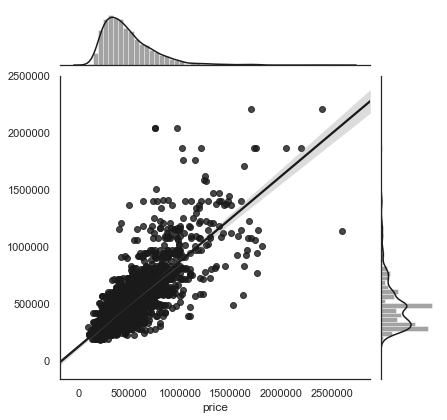

In [155]:
sns.set(style="darkgrid", color_codes=True)
            
with sns.axes_style("white"):
    sns.jointplot(x=y_val, y=y_DT2_predvl, kind="reg", color="k")

In summary, KNN regressor model and decision tree models have not performed well in comparison with linear regression models

### Ensemble techniques

#### Boosting and Bagging

In [156]:
from sklearn.ensemble import GradientBoostingRegressor, BaggingRegressor

In [157]:
GB1=GradientBoostingRegressor(n_estimators = 200, learning_rate = 0.1, random_state=22)
GB1.fit(X_train, y_train)

y_GB1_predtr= GB1.predict(X_train)
y_GB1_predvl= GB1.predict(X_val)

#Model score and Deduction for each Model in a DataFrame
GB1_trscore=r2_score(y_train,y_GB1_predtr)
GB1_trRMSE=np.sqrt(mean_squared_error(y_train, y_GB1_predtr))
GB1_trMSE=mean_squared_error(y_train, y_GB1_predtr)
GB1_trMAE=mean_absolute_error(y_train, y_GB1_predtr)

GB1_vlscore=r2_score(y_val,y_GB1_predvl)
GB1_vlRMSE=np.sqrt(mean_squared_error(y_val, y_GB1_predvl))
GB1_vlMSE=mean_squared_error(y_val, y_GB1_predvl)
GB1_vlMAE=mean_absolute_error(y_val, y_GB1_predvl)

GB1_df=pd.DataFrame({'Method':['GB1'],'Val Score':GB1_vlscore,'RMSE_vl': GB1_vlRMSE, 'MSE_vl': GB1_vlMSE, 'MAE_vl': GB1_vlMAE,'train Score':GB1_trscore,'RMSE_tr': GB1_trRMSE, 'MSE_tr': GB1_trMSE, 'MAE_tr': GB1_trMAE})
Compa_df = pd.concat([Compa_df, GB1_df])

Compa_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg Model1,0.718749,137733.698415,1.897057e+10,93994.455301,0.730112,132958.367261,1.767793e+10,92391.001786
0,Linear-Reg Lasso1,0.719117,137643.639712,1.894577e+10,93939.441186,0.730092,132963.180396,1.767921e+10,92403.854117
0,Linear-Reg Ridge1,0.718929,137689.597398,1.895843e+10,93992.809617,0.729789,133037.735155,1.769904e+10,92497.255174
0,knn1,0.425008,196935.451160,3.878357e+10,138494.383286,0.998628,9480.192071,8.987404e+07,887.708707
0,SVR1,-0.055489,266820.956555,7.119342e+10,183639.593215,-0.046405,261802.341726,6.854047e+10,179434.350170
0,SVR2,0.458252,191157.623415,3.654124e+10,132876.663665,0.454410,189041.408746,3.573665e+10,130250.868504
0,DT1,0.542495,175667.376246,3.085903e+10,109891.238551,0.998628,9480.192071,8.987404e+07,887.708707
0,DT2,0.637513,156364.920550,2.444999e+10,102458.587308,0.794647,115977.718333,1.345083e+10,82537.840190
0,GB1,0.782471,121129.989228,1.467247e+10,82824.319932,0.820821,108334.766538,1.173642e+10,76533.619644


Gradient boosting model has provided good scores in both training and validation sets

In [158]:
BGG1=BaggingRegressor(n_estimators=50, oob_score= True,random_state=14)
BGG1.fit(X_train, y_train)

y_BGG1_predtr= BGG1.predict(X_train)
y_BGG1_predvl= BGG1.predict(X_val)

#Model score and Deduction for each Model in a DataFrame
BGG1_trscore=r2_score(y_train,y_BGG1_predtr)
BGG1_trRMSE=np.sqrt(mean_squared_error(y_train, y_BGG1_predtr))
BGG1_trMSE=mean_squared_error(y_train, y_BGG1_predtr)
BGG1_trMAE=mean_absolute_error(y_train, y_BGG1_predtr)

BGG1_vlscore=r2_score(y_val,y_BGG1_predvl)
BGG1_vlRMSE=np.sqrt(mean_squared_error(y_val, y_BGG1_predvl))
BGG1_vlMSE=mean_squared_error(y_val, y_BGG1_predvl)
BGG1_vlMAE=mean_absolute_error(y_val, y_BGG1_predvl)

BGG1_df=pd.DataFrame({'Method':['BGG1'],'Val Score':BGG1_vlscore,'RMSE_vl': BGG1_vlRMSE, 'MSE_vl':BGG1_vlMSE, 'MAE_vl': BGG1_vlMAE,'train Score':BGG1_trscore,'RMSE_tr': BGG1_trRMSE, 'MSE_tr': BGG1_trMSE, 'MAE_tr': BGG1_trMAE})
Compa_df = pd.concat([Compa_df, BGG1_df])

Compa_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg Model1,0.718749,137733.698415,1.897057e+10,93994.455301,0.730112,132958.367261,1.767793e+10,92391.001786
0,Linear-Reg Lasso1,0.719117,137643.639712,1.894577e+10,93939.441186,0.730092,132963.180396,1.767921e+10,92403.854117
0,Linear-Reg Ridge1,0.718929,137689.597398,1.895843e+10,93992.809617,0.729789,133037.735155,1.769904e+10,92497.255174
0,knn1,0.425008,196935.451160,3.878357e+10,138494.383286,0.998628,9480.192071,8.987404e+07,887.708707
0,SVR1,-0.055489,266820.956555,7.119342e+10,183639.593215,-0.046405,261802.341726,6.854047e+10,179434.350170
0,SVR2,0.458252,191157.623415,3.654124e+10,132876.663665,0.454410,189041.408746,3.573665e+10,130250.868504
0,DT1,0.542495,175667.376246,3.085903e+10,109891.238551,0.998628,9480.192071,8.987404e+07,887.708707
0,DT2,0.637513,156364.920550,2.444999e+10,102458.587308,0.794647,115977.718333,1.345083e+10,82537.840190
0,GB1,0.782471,121129.989228,1.467247e+10,82824.319932,0.820821,108334.766538,1.173642e+10,76533.619644
0,BGG1,0.769319,124738.101557,1.555959e+10,80102.360544,0.966466,46867.181534,2.196533e+09,29441.780117


Bagging model also performed well in training and validation sets.There seems to be overfitting in training set. We need to analyse further by hypertuning

#### Random forest

In [159]:
from sklearn.ensemble import RandomForestRegressor

In [160]:
RF1=RandomForestRegressor()
RF1.fit(X_train, y_train)

y_RF1_predtr= RF1.predict(X_train)
y_RF1_predvl= RF1.predict(X_val)

#Model score and Deduction for each Model in a DataFrame
RF1_trscore=r2_score(y_train,y_RF1_predtr)
RF1_trRMSE=np.sqrt(mean_squared_error(y_train, y_RF1_predtr))
RF1_trMSE=mean_squared_error(y_train, y_RF1_predtr)
RF1_trMAE=mean_absolute_error(y_train, y_RF1_predtr)

RF1_vlscore=r2_score(y_val,y_RF1_predvl)
RF1_vlRMSE=np.sqrt(mean_squared_error(y_val, y_RF1_predvl))
RF1_vlMSE=mean_squared_error(y_val, y_RF1_predvl)
RF1_vlMAE=mean_absolute_error(y_val, y_RF1_predvl)

RF1_df=pd.DataFrame({'Method':['RF1'],'Val Score':RF1_vlscore,'RMSE_vl': RF1_vlRMSE, 'MSE_vl':RF1_vlMSE, 'MAE_vl': RF1_vlMAE,'train Score':RF1_trscore,'RMSE_tr': RF1_trRMSE, 'MSE_tr': RF1_trMSE, 'MAE_tr': RF1_trMAE})
Compa_df = pd.concat([Compa_df, RF1_df])

Compa_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg Model1,0.718749,137733.698415,1.897057e+10,93994.455301,0.730112,132958.367261,1.767793e+10,92391.001786
0,Linear-Reg Lasso1,0.719117,137643.639712,1.894577e+10,93939.441186,0.730092,132963.180396,1.767921e+10,92403.854117
0,Linear-Reg Ridge1,0.718929,137689.597398,1.895843e+10,93992.809617,0.729789,133037.735155,1.769904e+10,92497.255174
0,knn1,0.425008,196935.451160,3.878357e+10,138494.383286,0.998628,9480.192071,8.987404e+07,887.708707
0,SVR1,-0.055489,266820.956555,7.119342e+10,183639.593215,-0.046405,261802.341726,6.854047e+10,179434.350170
0,SVR2,0.458252,191157.623415,3.654124e+10,132876.663665,0.454410,189041.408746,3.573665e+10,130250.868504
0,DT1,0.542495,175667.376246,3.085903e+10,109891.238551,0.998628,9480.192071,8.987404e+07,887.708707
0,DT2,0.637513,156364.920550,2.444999e+10,102458.587308,0.794647,115977.718333,1.345083e+10,82537.840190
0,GB1,0.782471,121129.989228,1.467247e+10,82824.319932,0.820821,108334.766538,1.173642e+10,76533.619644
0,BGG1,0.769319,124738.101557,1.555959e+10,80102.360544,0.966466,46867.181534,2.196533e+09,29441.780117


Random forest model has performed well in training and validation set. There is scope of further analysis on this model

##### Enseble models: in summary ensemble models have performed well on training and validation sets. These models will be selected for further analysis with hypertuning and feature selection

First 20 feature importance:	 Imp    90.184
dtype: float64
First 30 feature importance:	 Imp    95.098
dtype: float64


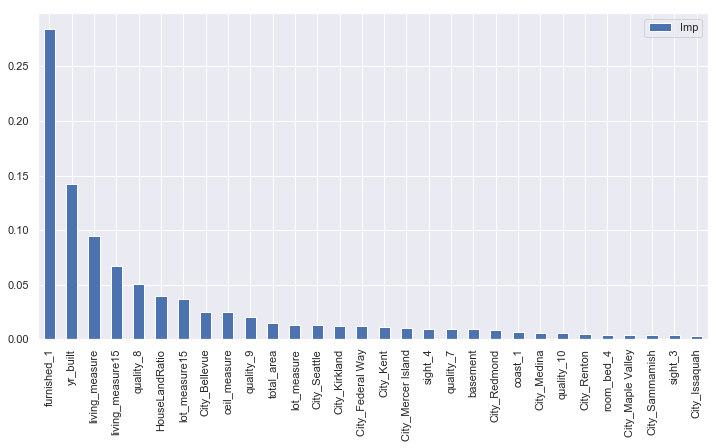

In [161]:
#feature importance
rf_imp_feature_1=pd.DataFrame(RF1.feature_importances_, columns = ["Imp"], index = X_val.columns)
rf_imp_feature_1.sort_values(by="Imp",ascending=False)
rf_imp_feature_1['Imp'] = rf_imp_feature_1['Imp'].map('{0:.5f}'.format)
rf_imp_feature_1=rf_imp_feature_1.sort_values(by="Imp",ascending=False)
rf_imp_feature_1.Imp=rf_imp_feature_1.Imp.astype("float")

rf_imp_feature_1[:30].plot.bar(figsize=(plotSizeX, plotSizeY))

#First 20 features have an importance of 90.5% and first 30 have importance of 95.15
print("First 20 feature importance:\t",(rf_imp_feature_1[:20].sum())*100)
print("First 30 feature importance:\t",(rf_imp_feature_1[:30].sum())*100)

Above are top 30 important features that account for 95% of variation in model. This need to be further analysed during hypertuning of the models for better scores

#### Model performance Summary:

Ensemble methods are performing better than linear models. 
Of all the ensemble models, Gradient boosting regressor is giving better R2 score.
we identified top 30 features that are explaining the 95% variation in model(Random Forest). Will further hypertune the model to improve the model performance. Will further explore and evaluate the features while hyperturning the ensemble models

## Building Function/Pipeline for models

In [162]:
rf_imp_feature_1[:30]

,Imp
furnished_1,0.28448
yr_built,0.14227
living_measure,0.09463
living_measure15,0.06691
quality_8,0.05062
HouseLandRatio,0.04008
lot_measure15,0.03731
City_Bellevue,0.02532
ceil_measure,0.02459
quality_9,0.02049


In [163]:
from sklearn.pipeline import Pipeline

In [164]:
def result (model,pipe_model,X_train_set,y_train_set,X_val_set,y_val_set):
    pipe_model.fit(X_train_set,y_train_set)
    #predicting result over test data
    y_train_predict= pipe_model.predict(X_train_set)
    y_val_predict= pipe_model.predict(X_val_set)

    trscore=r2_score(y_train_set,y_train_predict)
    trRMSE=np.sqrt(mean_squared_error(y_train_set,y_train_predict))
    trMSE=mean_squared_error(y_train_set,y_train_predict)
    trMAE=mean_absolute_error(y_train_set,y_train_predict)

    vlscore=r2_score(y_val,y_val_predict)
    vlRMSE=np.sqrt(mean_squared_error(y_val,y_val_predict))
    vlMSE=mean_squared_error(y_val,y_val_predict)
    vlMAE=mean_absolute_error(y_val,y_val_predict)
    result_df=pd.DataFrame({'Method':[model],'val score':vlscore,'RMSE_val':vlRMSE,'MSE_val':vlMSE,'MSE_vl': vlMSE,
                          'train Score':trscore,'RMSE_tr': trRMSE,'MSE_tr': trMSE, 'MAE_tr': trMAE})  
    return result_df

Above function will run the model and return the r2 score,rmse,mse of the model

In [165]:
#Creating empty dataframe to capture results
result_dff=pd.DataFrame()
pipe_LR = Pipeline([('LR', LinearRegression())])
result_dff=pd.concat([result_dff,result('LR',pipe_LR,X_train,y_train,X_val,y_val)])

pipe_knr = Pipeline([('KNNR', KNeighborsRegressor(n_neighbors=4,weights='distance'))])
result_dff=pd.concat([result_dff,result('KNNR',pipe_knr,X_train,y_train,X_val,y_val)])

pipe_DTR = Pipeline([('DTR', DecisionTreeRegressor())])
result_dff=pd.concat([result_dff,result('DTR',pipe_DTR,X_train,y_train,X_val,y_val)])

pipe_GBR = Pipeline([('GBR', GradientBoostingRegressor(n_estimators = 200, learning_rate = 0.1, random_state=22))])
result_dff=pd.concat([result_dff,result('GBR',pipe_GBR,X_train,y_train,X_val,y_val)])

pipe_BGR = Pipeline([('BGR', BaggingRegressor(n_estimators=50, oob_score= True,random_state=14))])
result_dff=pd.concat([result_dff,result('BGR',pipe_BGR,X_train,y_train,X_val,y_val)])

pipe_RFR = Pipeline([('RFR', RandomForestRegressor())])
result_dff=pd.concat([result_dff,result('RFR',pipe_RFR,X_train,y_train,X_val,y_val)])

result_dff

,Method,val score,RMSE_val,MSE_val,MSE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,LR,0.718749,137733.698415,1.897057e+10,1.897057e+10,0.730112,132958.367261,1.767793e+10,92391.001786
0,KNNR,0.425008,196935.451160,3.878357e+10,3.878357e+10,0.998628,9480.192071,8.987404e+07,887.708707
0,DTR,0.537219,176677.375867,3.121490e+10,3.121490e+10,0.998628,9480.192071,8.987404e+07,887.708707
0,GBR,0.782471,121129.989228,1.467247e+10,1.467247e+10,0.820821,108334.766538,1.173642e+10,76533.619644
0,BGR,0.769319,124738.101557,1.555959e+10,1.555959e+10,0.966466,46867.181534,2.196533e+09,29441.780117
0,RFR,0.757473,127900.773592,1.635861e+10,1.635861e+10,0.955380,54061.682258,2.922665e+09,32834.525684


Above sequence of steps with pipeline function will run all the models and compile the scores in result_dff dataframe. We can see that the above 2 steps are concise instead of running individual models and compiling the scores as earlier.

#### We can clearly see gradient boosting is giving better result in comparison with other ensemble methods. Also the score of 0.82 on training set indicates no overfitting of the model

In [166]:
#Storing results of initial data set - dff

result_ds1=result_dff.copy()
result_ds1

,Method,val score,RMSE_val,MSE_val,MSE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,LR,0.718749,137733.698415,1.897057e+10,1.897057e+10,0.730112,132958.367261,1.767793e+10,92391.001786
0,KNNR,0.425008,196935.451160,3.878357e+10,3.878357e+10,0.998628,9480.192071,8.987404e+07,887.708707
0,DTR,0.537219,176677.375867,3.121490e+10,3.121490e+10,0.998628,9480.192071,8.987404e+07,887.708707
0,GBR,0.782471,121129.989228,1.467247e+10,1.467247e+10,0.820821,108334.766538,1.173642e+10,76533.619644
0,BGR,0.769319,124738.101557,1.555959e+10,1.555959e+10,0.966466,46867.181534,2.196533e+09,29441.780117
0,RFR,0.757473,127900.773592,1.635861e+10,1.635861e+10,0.955380,54061.682258,2.922665e+09,32834.525684


## FEATURE SELECTION (PCA)

Now, we will explore the possibility of features reduction using PCA

In [167]:
dff.shape

(18287, 91)

In [168]:
dff.columns

Index(['price', 'living_measure', 'lot_measure', 'ceil_measure', 'basement',
       'yr_built', 'living_measure15', 'lot_measure15', 'total_area',
       'HouseLandRatio', 'room_bed_1', 'room_bed_2', 'room_bed_3',
       'room_bed_4', 'room_bed_5', 'room_bed_6', 'room_bed_7', 'room_bed_8',
       'room_bed_9', 'room_bed_10', 'room_bed_11', 'room_bath_0.5',
       'room_bath_0.75', 'room_bath_1.0', 'room_bath_1.25', 'room_bath_1.5',
       'room_bath_1.75', 'room_bath_2.0', 'room_bath_2.25', 'room_bath_2.5',
       'room_bath_2.75', 'room_bath_3.0', 'room_bath_3.25', 'room_bath_3.5',
       'room_bath_3.75', 'room_bath_4.0', 'room_bath_4.25', 'room_bath_4.5',
       'room_bath_4.75', 'room_bath_5.0', 'room_bath_5.25', 'room_bath_5.75',
       'ceil_1.5', 'ceil_2.0', 'ceil_2.5', 'ceil_3.0', 'ceil_3.5', 'coast_1',
       'sight_1', 'sight_2', 'sight_3', 'sight_4', 'condition_2',
       'condition_3', 'condition_4', 'condition_5', 'quality_4', 'quality_5',
       'quality_6', 'quality_7', 

will drop the price column as it is the target variable

In [169]:
df_pca = dff.drop(['price'], axis = 1)

In [170]:
numerical_cols = df_pca.copy()

numerical_cols.shape

(18287, 90)

In [171]:
# Let's first transform the entire X (independent variable data) to zscores. 
# We will create the PCA dimensions on this distribution.
from scipy.stats import zscore

# As PCA for Independent columns of Numerical types, let's pass numerical_cols (16 numerical features)
numerical_cols =  numerical_cols.apply(zscore)      

cov_matrix = np.cov(numerical_cols.T)
print('Covariance Matrix \n%s', cov_matrix)

Covariance Matrix 
%s [[ 1.00005469  0.20028185  0.84597846 ...  0.01415428  0.20094885
   0.05257785]
 [ 0.20028185  1.00005469  0.1663024  ...  0.08035946 -0.02988448
  -0.00617414]
 [ 0.84597846  0.1663024   1.00005469 ...  0.01649371 -0.27730605
   0.01739462]
 ...
 [ 0.01415428  0.08035946  0.01649371 ...  1.00005469 -0.0056238
  -0.01445085]
 [ 0.20094885 -0.02988448 -0.27730605 ... -0.0056238   1.00005469
   0.04524435]
 [ 0.05257785 -0.00617414  0.01739462 ... -0.01445085  0.04524435
   1.00005469]]


***As we can see, near the value to 1, more the features related.***

In [172]:
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)
print('Eigen Vectors \n%s', eigenvectors)
print('\n Eigen Values \n%s', eigenvalues)

Eigen Vectors 
%s [[ 3.38140157e-01 -5.91272225e-02  2.10933458e-01 ... -5.27282174e-03
   5.54142192e-03 -1.67124034e-04]
 [ 7.12659835e-02 -4.34121260e-01 -8.88436080e-02 ... -1.68818774e-02
   4.57078107e-03 -8.52995967e-03]
 [ 3.49772357e-01 -8.00383876e-03 -4.05156781e-02 ... -4.68496505e-03
  -1.39683527e-02  2.43243338e-03]
 ...
 [ 1.29688720e-02 -3.80398560e-02 -3.41813657e-02 ...  1.07174062e-01
   8.41737918e-02 -1.95413367e-01]
 [-2.50075399e-02 -3.74622282e-02  4.39476539e-01 ...  3.99982110e-03
   4.08181763e-02  2.32617269e-02]
 [-3.18537004e-03 -6.23000043e-04  1.02661626e-01 ...  2.84579669e-02
  -1.47963772e-02 -6.62692406e-02]]

 Eigen Values 
%s [ 6.40030103e+00  4.23053272e+00  3.02200570e+00  2.36069955e+00
  1.72278028e+00  1.70533047e+00  5.17634008e-02  7.84864255e-02
  1.23323929e-01  1.58239483e+00  1.94704947e-01  2.10588552e-01
  2.45372409e-01  3.37764061e-01  3.52383334e-01  2.24756725e-03
  9.93351422e-04  1.28503648e-04  8.54683326e-05  1.51669793e+00
  

In [173]:
# Let's Sort eigenvalues in descending order

# Make a set of (eigenvalue, eigenvector) pairs
eig_pairs = [(eigenvalues[index], eigenvectors[:,index]) for index in range(len(eigenvalues))]

# Sort the (eigenvalue, eigenvector) pairs from highest to lowest with respect to eigenvalue
eig_pairs.sort()

eig_pairs.reverse()
print(eig_pairs)

# Extract the descending ordered eigenvalues and eigenvectors
eigvalues_sorted = [eig_pairs[index][0] for index in range(len(eigenvalues))]
eigvectors_sorted = [eig_pairs[index][1] for index in range(len(eigenvalues))]

# Let's confirm our sorting worked, print out eigenvalues
print('Eigenvalues in descending order: \n%s' %eigvalues_sorted)

[(6.400301029851477, array([ 3.38140157e-01,  7.12659835e-02,  3.49772357e-01,  1.21826278e-02,
        2.45688226e-01,  3.13509594e-01,  5.85711636e-02,  1.32118243e-01,
        1.24188241e-01, -5.39557358e-02, -1.55322767e-01, -7.38082454e-02,
        1.69280354e-01,  6.71341866e-02,  1.76807150e-02,  8.40382554e-03,
        2.25638942e-03,  3.61933268e-03,  1.42331836e-03,  5.17260476e-04,
       -5.63803984e-03, -2.85596080e-02, -2.20914937e-01, -2.56073225e-03,
       -6.59873013e-02, -6.94849495e-02, -5.10691490e-02,  2.99009064e-02,
        1.96828062e-01,  7.27758185e-02,  4.47037234e-02,  6.43544191e-02,
        8.98255374e-02,  3.57441062e-02,  2.39042699e-02,  1.82629160e-02,
        2.35903040e-02,  9.52118613e-03,  6.36445584e-03,  6.71514053e-03,
        4.22319789e-03, -8.25472478e-02,  2.65712150e-01,  2.24314600e-02,
       -1.44008864e-03, -1.59380115e-04,  1.36351362e-02,  1.21584859e-02,
        2.79651538e-02,  3.46589095e-02,  2.87868177e-02, -3.59443998e-02,
    

In [174]:
tot = sum(eigenvalues)
var_explained = [(i / tot) for i in sorted(eigenvalues, reverse=True)]  

# an array of variance explained by each 

# eigen vector... there will be 90 entries as there are 90 eigen vectors)
cum_var_exp = np.cumsum(var_explained)  
# an array of cumulative variance. There will be 90 entries with 90 th entry cumulative reaching almost 100%

In [175]:
print(len(var_explained))

print((cum_var_exp))

90
[0.07111057 0.11811392 0.15168992 0.17791848 0.19705944 0.21600652
 0.23358772 0.250439   0.26692704 0.28239426 0.29726149 0.31142248
 0.32501714 0.33854764 0.35181802 0.36496782 0.37802505 0.39092136
 0.40368144 0.41611953 0.42844778 0.4407242  0.45285059 0.46490109
 0.47693082 0.48883227 0.50065039 0.512367   0.5240281  0.53567358
 0.54724669 0.55878091 0.57026308 0.58168114 0.59305629 0.60433586
 0.61559781 0.62684051 0.63805413 0.6492338  0.66040571 0.67156283
 0.6826951  0.69381134 0.70485163 0.71588727 0.72687989 0.73784581
 0.74876618 0.75966841 0.77044347 0.78103098 0.79158375 0.8020751
 0.8125378  0.82291272 0.83325705 0.84343441 0.85345344 0.86334895
 0.87322138 0.88298928 0.89257737 0.90181865 0.91080445 0.91957366
 0.92803933 0.93642683 0.94454751 0.95221608 0.95955405 0.96675604
 0.97310471 0.97782723 0.98224717 0.98616233 0.98991506 0.99264127
 0.99498101 0.99714428 0.99851447 0.9993865  0.99996161 0.99998659
 0.99999762 0.99999905 1.         1.         1.         1.  

From above table we conclude that 96% variance is contributed by about 72 features

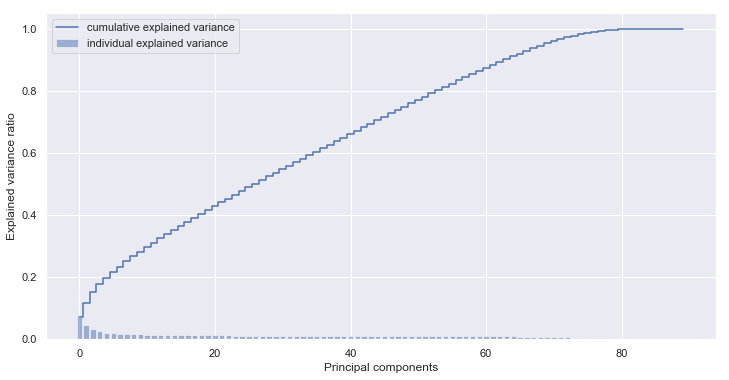

In [176]:
plt.figure(figsize=(plotSizeX, plotSizeY))
plt.bar(range(0,90), np.array(var_explained), alpha = 0.5, align='center', label='individual explained variance')
plt.step(range(0,90), np.array(cum_var_exp), where= 'mid', label='cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components')
plt.legend(loc = 'best')
plt.show()

##### 72 dimensions covering 97% variance in the data. So we can reduce to 72 dimension space

Now will recall the ensemble models from our initial run to check the feature selection using feature_imp_ from individual models

In [177]:
#Building fuction to return the feature importances for the model
predictors = [x for x in dff.columns if x not in ['price']]

def modelfit(alg, dxtrain, dytrain, printFeatureImportance=True):
    #feature importance
    alg.fit(dxtrain,dytrain)
    alg_imp_feature_1=pd.DataFrame(alg.feature_importances_, columns = ["Imp"], index = predictors)
    alg_imp_feature_1.sort_values(by="Imp",ascending=False)
    alg_imp_feature_1['Imp'] = alg_imp_feature_1['Imp'].map('{0:.5f}'.format)
    alg_imp_feature_1=alg_imp_feature_1.sort_values(by="Imp",ascending=False)
    alg_imp_feature_1.Imp=alg_imp_feature_1.Imp.astype("float")
    
    feat_30list=list(alg_imp_feature_1.index[:30])
    

    
    if printFeatureImportance:
        alg_imp_feature_1[:30].plot.bar(figsize=(plotSizeX, plotSizeY))
        #First 20 features have an importance of 90.5% and first 30 have importance of 95.15
        print("First 25 feature importance:\t",(alg_imp_feature_1[:25].sum())*100)
        print("First 30 feature importance:\t",(alg_imp_feature_1[:30].sum())*100)
        
    return feat_30list

Will run above function with ensemble models: Gradient boosting, Random forest, Bagging

First 25 feature importance:	 Imp    96.698
dtype: float64
First 30 feature importance:	 Imp    98.305
dtype: float64


['furnished_1',
 'living_measure',
 'yr_built',
 'living_measure15',
 'quality_8',
 'City_Bellevue',
 'City_Seattle',
 'lot_measure15',
 'HouseLandRatio',
 'City_Kent',
 'quality_9',
 'sight_4',
 'City_Federal Way',
 'coast_1',
 'City_Mercer Island',
 'City_Kirkland',
 'City_Medina',
 'City_Redmond',
 'quality_11',
 'ceil_measure',
 'quality_7',
 'City_Renton',
 'City_Maple Valley',
 'quality_6',
 'total_area',
 'quality_10',
 'basement',
 'City_Issaquah',
 'City_Sammamish',
 'condition_5']

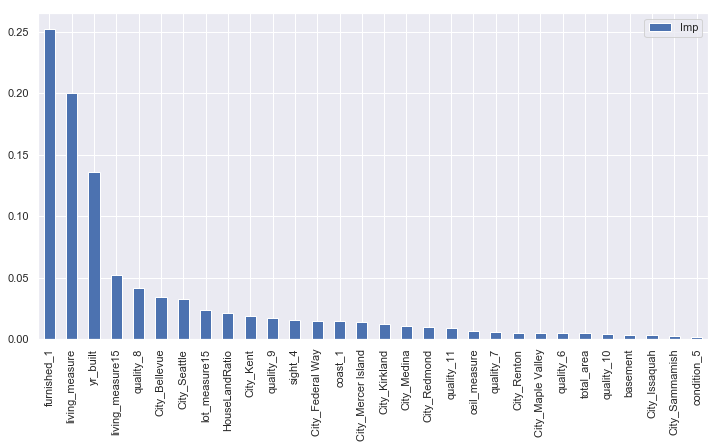

In [178]:
#Gradient boost model
modelfit(GB1,X_train,y_train)

The top 30 features are covering about 98% in gradient boosting model. This is very good coverage for just 30% of the variables

First 25 feature importance:	 Imp    93.273
dtype: float64
First 30 feature importance:	 Imp    95.008
dtype: float64


['furnished_1',
 'yr_built',
 'living_measure',
 'living_measure15',
 'quality_8',
 'HouseLandRatio',
 'lot_measure15',
 'quality_9',
 'ceil_measure',
 'City_Bellevue',
 'total_area',
 'lot_measure',
 'City_Seattle',
 'City_Kirkland',
 'City_Kent',
 'City_Federal Way',
 'coast_1',
 'basement',
 'City_Mercer Island',
 'quality_7',
 'City_Redmond',
 'sight_4',
 'City_Renton',
 'City_Maple Valley',
 'City_Medina',
 'City_Sammamish',
 'quality_10',
 'has_renovated_Yes',
 'room_bath_2.5',
 'room_bed_3']

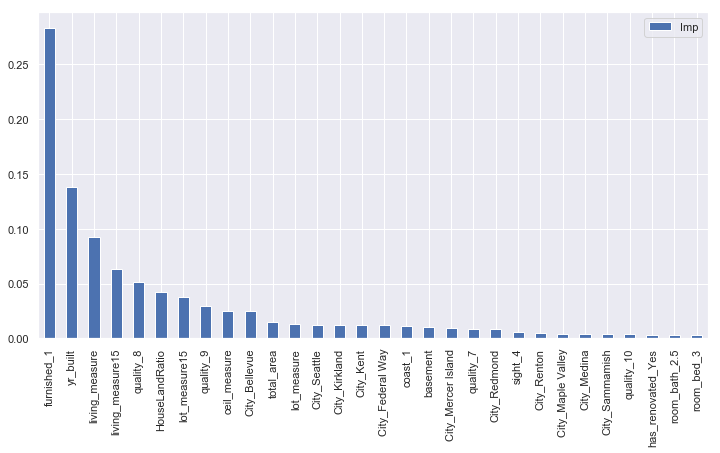

In [179]:
#Random Forest model
modelfit(RF1,X_train,y_train)

The top 30 features are covering about 95% in random forest model

Now will extract the top 30 features from the above models

In [180]:
feat_list_GB1=modelfit(GB1,X_train,y_train, printFeatureImportance=False)
print(feat_list_GB1)

feat_list_RF1=modelfit(RF1,X_train,y_train, printFeatureImportance=False)
print(feat_list_RF1)

['furnished_1', 'living_measure', 'yr_built', 'living_measure15', 'quality_8', 'City_Bellevue', 'City_Seattle', 'lot_measure15', 'HouseLandRatio', 'City_Kent', 'quality_9', 'sight_4', 'City_Federal Way', 'coast_1', 'City_Mercer Island', 'City_Kirkland', 'City_Medina', 'City_Redmond', 'quality_11', 'ceil_measure', 'quality_7', 'City_Renton', 'City_Maple Valley', 'quality_6', 'total_area', 'quality_10', 'basement', 'City_Issaquah', 'City_Sammamish', 'condition_5']
['furnished_1', 'yr_built', 'living_measure', 'living_measure15', 'quality_8', 'HouseLandRatio', 'lot_measure15', 'quality_9', 'ceil_measure', 'City_Bellevue', 'total_area', 'lot_measure', 'basement', 'City_Kent', 'City_Kirkland', 'City_Federal Way', 'City_Seattle', 'quality_7', 'City_Mercer Island', 'City_Redmond', 'coast_1', 'City_Renton', 'sight_4', 'quality_10', 'City_Maple Valley', 'City_Sammamish', 'City_Medina', 'room_bed_4', 'condition_3', 'City_Issaquah']


From the above 2 feature list, we will consolidate all the features

In [181]:
Key_feat=list(set(feat_list_GB1).union(feat_list_RF1))
print(len(Key_feat))
print(Key_feat)

33
['City_Mercer Island', 'condition_5', 'City_Sammamish', 'yr_built', 'sight_4', 'City_Seattle', 'City_Federal Way', 'City_Maple Valley', 'City_Bellevue', 'furnished_1', 'City_Kent', 'quality_9', 'City_Redmond', 'City_Issaquah', 'quality_8', 'total_area', 'quality_7', 'ceil_measure', 'City_Medina', 'coast_1', 'condition_3', 'lot_measure15', 'HouseLandRatio', 'City_Kirkland', 'City_Renton', 'living_measure15', 'basement', 'room_bed_4', 'quality_6', 'lot_measure', 'quality_10', 'quality_11', 'living_measure']


From two models we have 33 importance features. We will freeze on the above 33 list and make another dataframe (along with 'price')

In [182]:
dff33=dff[['price','basement', 'City_Bellevue', 'coast_1', 'HouseLandRatio', 'City_Seattle', 'quality_10', 'quality_9', 'ceil_measure', 'City_Renton', 'City_Redmond', 'City_Federal Way', 'City_Mercer Island', 'yr_built', 'living_measure15', 'living_measure', 'City_Maple Valley', 'sight_3', 'total_area', 'City_Kirkland', 'sight_4', 'quality_6', 'quality_7', 'City_Sammamish', 'quality_8', 'City_Kent', 'quality_12', 'lot_measure', 'condition_3', 'furnished_1', 'City_Issaquah', 'quality_11', 'City_Medina', 'lot_measure15']].copy()

In [183]:
dff33.shape

(18287, 34)

In [184]:
dff33.head()

,price,basement,City_Bellevue,coast_1,HouseLandRatio,City_Seattle,quality_10,quality_9,ceil_measure,City_Renton,...,quality_8,City_Kent,quality_12,lot_measure,condition_3,furnished_1,City_Issaquah,quality_11,City_Medina,lot_measure15
17786,430000,0,0,0,19.0,1,0,0,2550,0,...,1,0,0,11160,1,0,0,0,0,7440
3782,385500,420,0,0,16.0,0,0,0,1120,0,...,0,0,0,7947,1,0,0,0,0,7950
10069,736000,0,1,0,16.0,0,0,1,2290,0,...,0,0,0,12047,0,1,0,0,0,15666
7114,580000,970,0,0,24.0,1,0,0,970,0,...,0,0,0,6000,0,0,0,0,0,6000
10080,315000,1160,0,0,22.0,1,0,0,1160,0,...,0,0,0,8100,0,0,0,0,0,7271


In [185]:
X3 = dff33.drop("price" , axis=1)
y3 = dff33["price"]

X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, test_size=0.2, random_state=10)
X3_train, X3_val, y3_train, y3_val = train_test_split(X3_train, y3_train, test_size=0.2, random_state=10)

print(X3_train.shape)
print(X3_test.shape)
print(X3_val.shape)

(11703, 33)
(3658, 33)
(2926, 33)


### Eventhough PCA is helping us to reduce dimensions upto about 60 dimensions, we can see that in our random forest model top 30 features are explaining the 95% variance in the regression and in gradient boosting model top 30 features are covering 98% varience.
### Hence we conclude that we will use features selection by considering the feature importance fucntion in individual models. Thus we extracted 33 important features

### HYPERTUNING with Gridsearch CV

In [186]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import cross_val_score

Since we have better performance in gradient boosting model, we will hypertune the model for improving the score

Following are the parameters we tune for the gradient boosting model.

In [187]:
param_grid = {
    'loss':['ls','lad','huber'],
    'bootstrap': ['True','False'],
    'max_depth': range(5,11,1),
    'max_features': ['auto','sqrt'],
    'learning_rate': [0.05,0.1,0.2,0.25],
    'min_samples_leaf': [4,10,20],
    'min_samples_split': [5,10,1000],
    'n_estimators': [10,50,100,150,200],
    'subsample':[0.8,1]
}

In [188]:
GBR_test=GradientBoostingRegressor(random_state=22)


First will tune each parameter separately

In [189]:
param_grid1 = {'n_estimators': range(50,401,50)}

In [190]:
grid_search1 = GridSearchCV(estimator = GBR_test, param_grid = param_grid1, 
                          cv = 3, n_jobs = 2, verbose = 1)

In [191]:
grid_search1.fit(X_train,y_train)
grid_search1.best_params_

Fitting 3 folds for each of 8 candidates, totalling 24 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  24 out of  24 | elapsed:   57.6s finished


{'n_estimators': 400}

In [192]:
grid_search1.best_params_, grid_search1.best_score_

({'n_estimators': 400}, 0.7757647547223905)

n_estimators of 400 is best in range 50 to 400. Will test same until 1000

In [193]:
param_grid2 = {'n_estimators': range(400,1001,200)}
GBR_test=GradientBoostingRegressor(random_state=22)

grid_search2 = GridSearchCV(estimator = GBR_test, param_grid = param_grid2, 
                          cv = 3, n_jobs = 2, verbose = 1)
grid_search2.fit(X_train,y_train)


Fitting 3 folds for each of 4 candidates, totalling 12 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  12 out of  12 | elapsed:  1.3min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.1, loss='ls', max_depth=3, max_features=None,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=1,
             min_sampl...te=22, subsample=1.0, tol=0.0001,
             validation_fraction=0.1, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=2,
       param_grid={'n_estimators': range(400, 1001, 200)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [194]:
grid_search2.cv_results_,grid_search2.best_params_, grid_search2.best_score_

({'mean_fit_time': array([ 7.2032059 , 10.84747616, 14.41415413, 17.8464543 ]),
  'std_fit_time': array([0.0866392 , 0.19536189, 0.14661922, 0.92177025]),
  'mean_score_time': array([0.03063202, 0.04291979, 0.06155936, 0.07675632]),
  'std_score_time': array([0.00097431, 0.00340029, 0.00733648, 0.01039824]),
  'param_n_estimators': masked_array(data=[400, 600, 800, 1000],
               mask=[False, False, False, False],
         fill_value='?',
              dtype=object),
  'params': [{'n_estimators': 400},
   {'n_estimators': 600},
   {'n_estimators': 800},
   {'n_estimators': 1000}],
  'split0_test_score': array([0.77559185, 0.77864467, 0.77983937, 0.78052058]),
  'split1_test_score': array([0.76537408, 0.77109939, 0.77235457, 0.7724209 ]),
  'split2_test_score': array([0.78632834, 0.78828157, 0.78829273, 0.78811941]),
  'mean_test_score': array([0.77576475, 0.77934188, 0.78016222, 0.78035363]),
  'std_test_score': array([0.00855542, 0.0070319 , 0.00651073, 0.00640998]),
  'rank_te

In [195]:
param_grid2 = {'n_estimators': range(1000,2000,300)}
GBR_test=GradientBoostingRegressor(random_state=22)

grid_search2 = GridSearchCV(estimator = GBR_test, param_grid = param_grid2, 
                          cv = 5, n_jobs = 3, verbose = 1)
grid_search2.fit(X_train,y_train)


Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  20 out of  20 | elapsed:  4.1min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.1, loss='ls', max_depth=3, max_features=None,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=1,
             min_sampl...te=22, subsample=1.0, tol=0.0001,
             validation_fraction=0.1, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=3,
       param_grid={'n_estimators': range(1000, 2000, 300)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [196]:
grid_search2.best_params_, grid_search2.best_score_

({'n_estimators': 1000}, 0.7885965739886799)

n_estimators of 1000 is giving best result in range 400 to 1000

In [197]:
param_grid3 = {
    'learning_rate': [0.1,0.2],
    'min_samples_leaf': [5,10,20],
    'min_samples_split': [5,10,20],
    'n_estimators': [500,1000],
}

In [198]:
GBR_test=GradientBoostingRegressor(random_state=22)

grid_search3 = GridSearchCV(estimator = GBR_test, param_grid = param_grid3, 
                          cv = 5, n_jobs = 3, verbose = 1)
grid_search3.fit(X_train,y_train)


Fitting 5 folds for each of 36 candidates, totalling 180 fits


[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  44 tasks      | elapsed:  5.1min
[Parallel(n_jobs=3)]: Done 180 out of 180 | elapsed: 20.3min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.1, loss='ls', max_depth=3, max_features=None,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=1,
             min_sampl...te=22, subsample=1.0, tol=0.0001,
             validation_fraction=0.1, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=3,
       param_grid={'learning_rate': [0.1, 0.2], 'min_samples_leaf': [5, 10, 20], 'min_samples_split': [5, 10, 20], 'n_estimators': [500, 1000]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [199]:
grid_search3.best_params_, grid_search3.best_score_

({'learning_rate': 0.1,
  'min_samples_leaf': 10,
  'min_samples_split': 5,
  'n_estimators': 1000},
 0.7880978276736184)

In combination of 4 parameters above values are giving best result. We can see n_estimators of 1000 is best again.
Now, will change the ranges of other 3 parameters

In [200]:
param_grid4 = {
    'learning_rate': [0.1,0.15],
    'max_depth': [5,10],
    'min_samples_leaf': [5,8],
    'min_samples_split': [20,30],
    'n_estimators': [1000],
}

In [201]:
GBR_test=GradientBoostingRegressor(random_state=22)

grid_search4 = GridSearchCV(estimator = GBR_test, param_grid = param_grid4, 
                          cv = 5, n_jobs = 3, verbose = 1)
grid_search4.fit(X_train,y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  44 tasks      | elapsed: 23.3min
[Parallel(n_jobs=3)]: Done  80 out of  80 | elapsed: 45.2min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.1, loss='ls', max_depth=3, max_features=None,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=1,
             min_sampl...te=22, subsample=1.0, tol=0.0001,
             validation_fraction=0.1, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=3,
       param_grid={'learning_rate': [0.1, 0.15], 'max_depth': [5, 10], 'min_samples_leaf': [5, 8], 'min_samples_split': [20, 30], 'n_estimators': [1000]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [202]:
grid_search4.best_params_, grid_search4.best_score_

({'learning_rate': 0.1,
  'max_depth': 5,
  'min_samples_leaf': 8,
  'min_samples_split': 20,
  'n_estimators': 1000},
 0.7821899364744039)

Now the score has reduced compared to earlier run

In [203]:
param_grid5 = {
    'learning_rate': [0.1],
    'max_depth': [5],
    'min_samples_leaf': [8,10],
    'min_samples_split': [30,40],
    'n_estimators': [1000],
}

GBR_test=GradientBoostingRegressor(random_state=22)

grid_search5 = GridSearchCV(estimator = GBR_test, param_grid = param_grid5, 
                          cv = 5, n_jobs = 2, verbose = 1)
grid_search5.fit(X_train,y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  20 out of  20 | elapsed:  7.6min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.1, loss='ls', max_depth=3, max_features=None,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=1,
             min_sampl...te=22, subsample=1.0, tol=0.0001,
             validation_fraction=0.1, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=2,
       param_grid={'learning_rate': [0.1], 'max_depth': [5], 'min_samples_leaf': [8, 10], 'min_samples_split': [30, 40], 'n_estimators': [1000]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [204]:
grid_search5.best_params_, grid_search5.best_score_

({'learning_rate': 0.1,
  'max_depth': 5,
  'min_samples_leaf': 10,
  'min_samples_split': 40,
  'n_estimators': 1000},
 0.7844535606632613)

Above score has improved from earlier runs

In [205]:
param_grid6 = {
    'learning_rate': [0.1],
    'max_depth': [5],
    'min_samples_leaf': [8],
    'min_samples_split': [40,50],
    'n_estimators': [1000],
}

GBR_test=GradientBoostingRegressor(random_state=22)

grid_search6 = GridSearchCV(estimator = GBR_test, param_grid = param_grid6, 
                          cv = 5, n_jobs = 2, verbose = 1)
grid_search6.fit(X_train,y_train)

Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  10 out of  10 | elapsed:  3.6min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.1, loss='ls', max_depth=3, max_features=None,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=1,
             min_sampl...te=22, subsample=1.0, tol=0.0001,
             validation_fraction=0.1, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=2,
       param_grid={'learning_rate': [0.1], 'max_depth': [5], 'min_samples_leaf': [8], 'min_samples_split': [40, 50], 'n_estimators': [1000]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [206]:
grid_search6.best_params_, grid_search6.best_score_

({'learning_rate': 0.1,
  'max_depth': 5,
  'min_samples_leaf': 8,
  'min_samples_split': 50,
  'n_estimators': 1000},
 0.7828068526559553)

There is very marginal improvment in score. We are getting best score at min_samples_split of 40 among 30,40,50.

##### Will tune the final set of parameters along with above finalized ones

In [207]:
param_grid7 = {
    'loss':['ls','lad','huber'],
    'max_features': ['auto','sqrt'],
    'learning_rate': [0.1],
    'max_depth': [5],
    'min_samples_leaf': [8],
    'min_samples_split': [40],
    'n_estimators': [1000],
    'subsample':[0.8,1]
}

GBR_test=GradientBoostingRegressor(random_state=22)

grid_search7 = GridSearchCV(estimator = GBR_test, param_grid = param_grid7, 
                          cv = 5, n_jobs = 2, verbose = 1)
grid_search7.fit(X_train,y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed: 12.2min
[Parallel(n_jobs=2)]: Done  60 out of  60 | elapsed: 14.8min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.1, loss='ls', max_depth=3, max_features=None,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=1,
             min_sampl...te=22, subsample=1.0, tol=0.0001,
             validation_fraction=0.1, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=2,
       param_grid={'loss': ['ls', 'lad', 'huber'], 'max_features': ['auto', 'sqrt'], 'learning_rate': [0.1], 'max_depth': [5], 'min_samples_leaf': [8], 'min_samples_split': [40], 'n_estimators': [1000], 'subsample': [0.8, 1]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [208]:
grid_search7.best_params_, grid_search7.best_score_

({'learning_rate': 0.1,
  'loss': 'huber',
  'max_depth': 5,
  'max_features': 'sqrt',
  'min_samples_leaf': 8,
  'min_samples_split': 40,
  'n_estimators': 1000,
  'subsample': 1},
 0.7965973506104334)

There is improvement in the score. will try one more iteration with changing other parameters

In [209]:
param_gridF = {
    'loss':['huber'],
    'max_features': ['sqrt'],
    'learning_rate': [0.1,0.2],
    'max_depth': [5,8],
    'min_samples_leaf': [5],
    'min_samples_split': [40,50],
    'n_estimators': [1000],
    'subsample':[1]
}

GBR_test=GradientBoostingRegressor(random_state=22)

grid_searchF = GridSearchCV(estimator = GBR_test, param_grid = param_gridF, 
                          cv = 5, n_jobs = 2, verbose = 1)
grid_searchF.fit(X_train,y_train)
grid_searchF.best_params_,grid_searchF.best_score_

Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  40 out of  40 | elapsed:  6.0min finished


({'learning_rate': 0.1,
  'loss': 'huber',
  'max_depth': 5,
  'max_features': 'sqrt',
  'min_samples_leaf': 5,
  'min_samples_split': 40,
  'n_estimators': 1000,
  'subsample': 1},
 0.7958994895003749)

<li>The above iteration gives best result of 0.799.</li>
<li><b>Final parameters that are giving best result on training set are: </li>

'learning_rate': 0.1,
'loss': 'huber',
'max_depth': 5,
'max_features': 'sqrt',
'min_samples_leaf': 5,
'min_samples_split': 50,
'n_estimators': 1000,
'subsample': 1
</b>

#### Hypertuning using graph

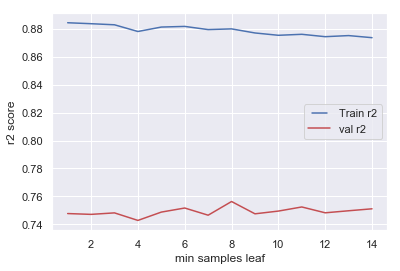

In [210]:
min_samples_leafs = range(1, 15, 1)
train_results = []
val_results = []
for min_samples_leaf in min_samples_leafs:
   GBR_test=GradientBoostingRegressor(
        loss='huber',
        learning_rate=0.1,
        n_estimators=1000,
        subsample=1.0,
        min_samples_split=40,
        min_samples_leaf=min_samples_leaf,
        max_depth=5,
        random_state=22,
        alpha=0.9,
)
   GBR_test.fit(X_train,y_train)
   y_GBR_predtr= GBR_test.predict(X_train)
   y_GBR_predvl= GBR_test.predict(X_val)
   
   result_leafs_tr=r2_score(y_GBR_predtr,y_train)
   train_results.append(result_leafs_tr)
   result_leafs_vl=r2_score(y_GBR_predvl,y_val)
   val_results.append(result_leafs_vl)
   
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(min_samples_leafs,train_results,"b", label='Train r2')
line2, = plt.plot(min_samples_leafs, val_results,"r", label='val r2')
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel("r2 score")
plt.xlabel("min samples leaf")
plt.show()

From above, min_samples_leaf of 6 is giving best score

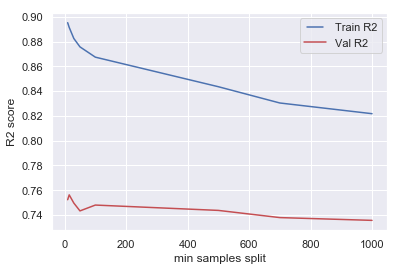

In [211]:
min_samples_splits = [10,15,30,50,100,500,700,1000]
train_results_spt = []
val_results_spt = []
for min_samples_split in min_samples_splits:
   GBR_test=GradientBoostingRegressor(
        loss='huber',
        learning_rate=0.1,
        n_estimators=1000,
        subsample=1.0,
        min_samples_split=min_samples_split,
        min_samples_leaf=5,
        max_depth=5,
        random_state=22,
        alpha=0.9,
        )
   GBR_test.fit(X_train,y_train)
   y_GBR_predtr= GBR_test.predict(X_train)
   y_GBR_predvl= GBR_test.predict(X_val)
   
   result_spt_tr=r2_score(y_GBR_predtr,y_train)
   train_results_spt.append(result_spt_tr)
   result_spt_vl=r2_score(y_GBR_predvl,y_val)
   val_results_spt.append(result_spt_vl)
   
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(min_samples_splits,train_results_spt,"b", label='Train R2')
line2, = plt.plot(min_samples_splits, val_results_spt,"r", label='Val R2')
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel("R2 score")
plt.xlabel("min samples split")
plt.show()

From above, min_samples_splits of about 10 is giving best score. Will try expanding the range around 10

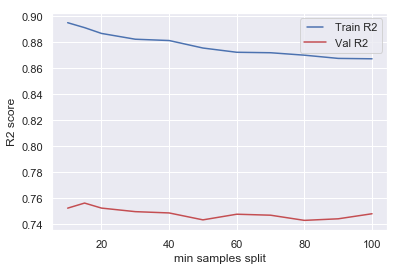

In [212]:
min_samples_splits = [10,15,20,30,40,50,60,70,80,90,100]
train_results_spt = []
val_results_spt = []
for min_samples_split in min_samples_splits:
   GBR_test=GradientBoostingRegressor(
        loss='huber',
        learning_rate=0.1,
        n_estimators=1000,
        subsample=1.0,
        min_samples_split=min_samples_split,
        min_samples_leaf=5,
        max_depth=5,
        random_state=22,
        alpha=0.9,
        )
   GBR_test.fit(X_train,y_train)
   y_GBR_predtr= GBR_test.predict(X_train)
   y_GBR_predvl= GBR_test.predict(X_val)
   
   result_spt_tr=r2_score(y_GBR_predtr,y_train)
   train_results_spt.append(result_spt_tr)
   result_spt_vl=r2_score(y_GBR_predvl,y_val)
   val_results_spt.append(result_spt_vl)
   
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(min_samples_splits,train_results_spt,"b", label='Train R2')
line2, = plt.plot(min_samples_splits, val_results_spt,"r", label='Val R2')
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel("R2 score")
plt.xlabel("min samples split")
plt.show()

From above, min_samples_splits of about 10 is giving best score

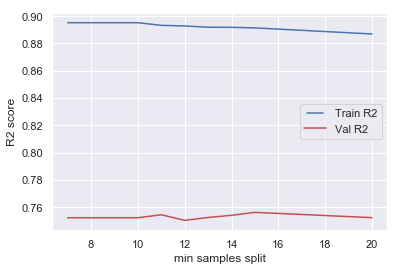

In [213]:
min_samples_splits = [7,8,9,10,11,12,13,14,15,20]
train_results_spt = []
val_results_spt = []
for min_samples_split in min_samples_splits:
   GBR_test=GradientBoostingRegressor(
        loss='huber',
        learning_rate=0.1,
        n_estimators=1000,
        subsample=1.0,
        min_samples_split=min_samples_split,
        min_samples_leaf=5,
        max_depth=5,
        random_state=22,
        alpha=0.9,
        )
   GBR_test.fit(X_train,y_train)
   y_GBR_predtr= GBR_test.predict(X_train)
   y_GBR_predvl= GBR_test.predict(X_val)
   
   result_spt_tr=r2_score(y_GBR_predtr,y_train)
   train_results_spt.append(result_spt_tr)
   result_spt_vl=r2_score(y_GBR_predvl,y_val)
   val_results_spt.append(result_spt_vl)
   
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(min_samples_splits,train_results_spt,"b", label='Train R2')
line2, = plt.plot(min_samples_splits, val_results_spt,"r", label='Val R2')
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel("R2 score")
plt.xlabel("min samples split")
plt.show()

From above, min_samples_splits of about 12 is giving best score

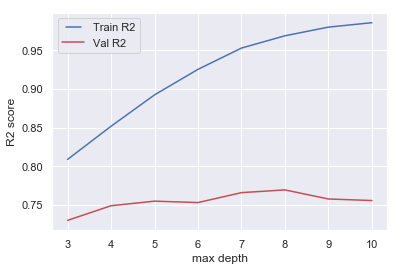

In [214]:
max_depths = range(3,11,1)
train_results_dpt = []
val_results_dpt = []
for max_depth in max_depths:
   GBR_test=GradientBoostingRegressor(
        loss='huber',
        learning_rate=0.1,
        n_estimators=1000,
        subsample=1.0,
        min_samples_split=10,
        min_samples_leaf=6,
        max_depth=max_depth,
        random_state=22,
        alpha=0.9,
        )
   GBR_test.fit(X_train,y_train)
   y_GBR_predtr= GBR_test.predict(X_train)
   y_GBR_predvl= GBR_test.predict(X_val)
   
   result_dpt_tr=r2_score(y_GBR_predtr,y_train)
   train_results_dpt.append(result_dpt_tr)
   result_dpt_vl=r2_score(y_GBR_predvl,y_val)
   val_results_dpt.append(result_dpt_vl)
   
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(max_depths,train_results_dpt,"b", label='Train R2')
line2, = plt.plot(max_depths, val_results_dpt,"r", label='Val R2')
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel("R2 score")
plt.xlabel("max depth")
plt.show()

From above, max_depth of about 6 is giving best score for validation set and not overfitting of training set

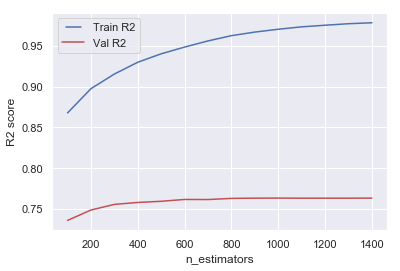

In [215]:
estimators = range(100,1500,100)
train_results_est = []
val_results_est = []
for n_estimators in estimators:
   GBR_test=GradientBoostingRegressor(
        loss='huber',
        learning_rate=0.1,
        n_estimators=n_estimators,
        subsample=1.0,
        min_samples_split=30,
        min_samples_leaf=6,
        max_depth=9,
        random_state=22,
        alpha=0.9,
        )
   GBR_test.fit(X_train,y_train)
   y_GBR_predtr= GBR_test.predict(X_train)
   y_GBR_predvl= GBR_test.predict(X_val)
   
   result_est_tr=r2_score(y_GBR_predtr,y_train)
   train_results_est.append(result_est_tr)
   result_est_vl=r2_score(y_GBR_predvl,y_val)
   val_results_est.append(result_est_vl)
   
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(estimators,train_results_est,"b", label='Train R2')
line2, = plt.plot(estimators, val_results_est,"r", label='Val R2')
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel("R2 score")
plt.xlabel("n_estimators")
plt.show()

From above, n_estimators of about 1000 is giving best score

In [217]:
param_gridF = {
    'loss':['huber'],
    'max_features': ['sqrt'],
    'learning_rate': [0.1],
    'max_depth': [6],
    'min_samples_leaf': [6],
    'min_samples_split': [12],
    'n_estimators': [1000],
    'subsample':[1]
}

GBR_test=GradientBoostingRegressor(random_state=22)

grid_searchF = GridSearchCV(estimator = GBR_test, param_grid = param_gridF, 
                          cv = 5, n_jobs = 2, verbose = 1)
grid_searchF.fit(X_train,y_train)
grid_searchF.best_score_

Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   5 out of   5 | elapsed:   58.4s finished


0.7934419703161365

In [218]:
param_gridF = {
    'loss':['huber'],
    'max_features': ['sqrt'],
    'learning_rate': [0.1],
    'max_depth': [5],
    'min_samples_leaf': [5],
    'min_samples_split': [50],
    'n_estimators': [1000],
    'subsample':[1]
}

GBR_test=GradientBoostingRegressor(random_state=22)

grid_searchF = GridSearchCV(estimator = GBR_test, param_grid = param_gridF, 
                          cv = 5, n_jobs = 2, verbose = 1)
grid_searchF.fit(X_train,y_train)
grid_searchF.best_score_,grid_searchF.best_params_

Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   5 out of   5 | elapsed:   35.2s finished


(0.7928868850462906,
 {'learning_rate': 0.1,
  'loss': 'huber',
  'max_depth': 5,
  'max_features': 'sqrt',
  'min_samples_leaf': 5,
  'min_samples_split': 50,
  'n_estimators': 1000,
  'subsample': 1})

<b> We can conclude from above that gridsearch CV is giving better results compared to that of tuning done by graphical method of individual parameters</b>

<li><b>Final parameters that are giving best result on training set are: </li>

'learning_rate': 0.1,
'loss': 'huber',
'max_depth': 5,
'max_features': 'sqrt',
'min_samples_leaf': 5,
'min_samples_split': 50,
'n_estimators': 1000,
'subsample': 1
</b>

## CONFIDENCE INTERVAL

In [219]:
GBR_bestparam=GradientBoostingRegressor(
        loss='huber',
        learning_rate=0.1,
        n_estimators=1000,
        subsample=1.0,
        min_samples_split=50,
        min_samples_leaf=5,
        max_depth=5,
        random_state=22,
        alpha=0.9,
        )
GBR_bestparam.fit(X_train,y_train)
y_GBRF_predtr= GBR_bestparam.predict(X_train)
y_GBRF_predvl= GBR_bestparam.predict(X_val)
y_GBRF_predts= GBR_bestparam.predict(X_test)

In [220]:
#Model score and Deduction for each Model in a DataFrame
GBRF_trscore=r2_score(y_train,y_GBRF_predtr)
GBRF_trRMSE=np.sqrt(mean_squared_error(y_train, y_GBRF_predtr))
GBRF_trMSE=mean_squared_error(y_train, y_GBRF_predtr)
GBRF_trMAE=mean_absolute_error(y_train, y_GBRF_predtr)

GBRF_vlscore=r2_score(y_val,y_GBRF_predvl)
GBRF_vlRMSE=np.sqrt(mean_squared_error(y_val, y_GBRF_predvl))
GBRF_vlMSE=mean_squared_error(y_val, y_GBRF_predvl)
GBRF_vlMAE=mean_absolute_error(y_val, y_GBRF_predvl)

GBRF_tsscore=r2_score(y_test,y_GBRF_predts)
GBRF_tsRMSE=np.sqrt(mean_squared_error(y_test, y_GBRF_predts))
GBRF_tsMSE=mean_squared_error(y_test, y_GBRF_predts)
GBRF_tsMAE=mean_absolute_error(y_test, y_GBRF_predts)

GBRF_df=pd.DataFrame({'Method':['GBRF'],'Val Score':GBRF_vlscore,'RMSE_vl': GBRF_vlRMSE, 'MSE_vl': GBRF_vlMSE,'train Score':GBRF_trscore,'RMSE_tr': GBRF_trRMSE, 'MSE_tr': GBRF_trMSE,'test Score':GBRF_tsscore,'RMSE_ts': GBRF_tsRMSE, 'MSE_ts': GBRF_tsMSE})


GBRF_df

,Method,Val Score,RMSE_vl,MSE_vl,train Score,RMSE_tr,MSE_tr,test Score,RMSE_ts,MSE_ts
0,GBRF,0.80096,115867.988855,1.342539e+10,0.898909,81372.879729,6.621546e+09,0.793584,114695.310542,1.315501e+10


In [221]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

num_folds = 50
seed = 7

kfold = KFold(n_splits=num_folds, random_state=seed)
model = GradientBoostingRegressor(n_estimators = 200, learning_rate = 0.1, random_state=22)
results = cross_val_score(GBR_bestparam, X, y, cv=kfold)
print(results)
print("Accuracy: %.3f%% (%.3f%%)" % (results.mean()*100.0, results.std()*100.0))

[0.86054651 0.81529    0.80351765 0.86060958 0.79642892 0.85548539
 0.78098527 0.77925365 0.81822936 0.82102096 0.87499995 0.81800409
 0.81853737 0.82096864 0.82206478 0.85415595 0.7952127  0.77879311
 0.85529758 0.83972439 0.76258618 0.80910137 0.80208101 0.82664724
 0.7825543  0.8601369  0.77441922 0.78867005 0.84107987 0.79025948
 0.84773597 0.76865873 0.78487112 0.80018574 0.82324413 0.82243794
 0.74048912 0.82370621 0.82606705 0.83661657 0.79192532 0.8126131
 0.79097264 0.81741328 0.76640402 0.77512715 0.78013298 0.7859921
 0.73054971 0.76721522]
Accuracy: 80.798% (3.241%)


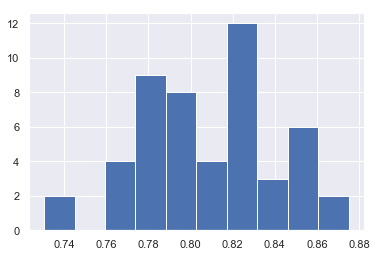

95.0 confidence interval 74.5% and 86.1%


In [222]:
from matplotlib import pyplot
# plot scores
pyplot.hist(results)
pyplot.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence 
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(results, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(results, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

## Dataset-1 Final summary:
<li></li>
<b>
<li>The ensemble models have performed well compared to that of linear,KNN,SVR models</li>
<li>The best performance is given by Gradient boosting model with training (score-0.89,RMSE-81372), Validation (score-0.80,RSME-115867), Testing(score-0.79,RMSE-114695)
    The 95% confidence interval scores range from 0.72 to 0.85.</li>
    
<li>The top key features that drive the price of the property  are: 'furnished_1', 'yr_built', 'living_measure','quality_8', 'HouseLandRatio', 'lot_measure15', 'quality_9', 'ceil_measure', 'total_area'. </li>
    
<li>The above data is also reinforced by the analysis done during bivariate analysis.</li>

<li> For further improvization, the datasets can be made by treating outliers in different ways and hypertuning the ensemble models.</li></b>
    

## Dataset-2

In [2]:
import geopandas as gpd
from shapely.geometry import Point, Polygon
#For current working directory
import os
cwd = os.getcwd()

In [224]:
## Need to add file USA ZipCodes_1.xlsx to current working directory to access this data
USAZip=pd.read_excel("USA ZipCodes_1.xlsx",sheet_name="Sheet8")
USAZip.head()

,zipcode,City,County,Type
0,98001,Auburn,King,Standard
1,98002,Auburn,King,Standard
2,98003,Federal Way,King,Standard
3,98004,Bellevue,King,Standard
4,98005,Bellevue,King,Standard


In [239]:
house_df = pd.read_csv('innercity.csv')

In [240]:
house_df1=house_df.merge(USAZip,how='left',on='zipcode')
#house_df.drop_duplicates()

house_df.shape

(21613, 23)

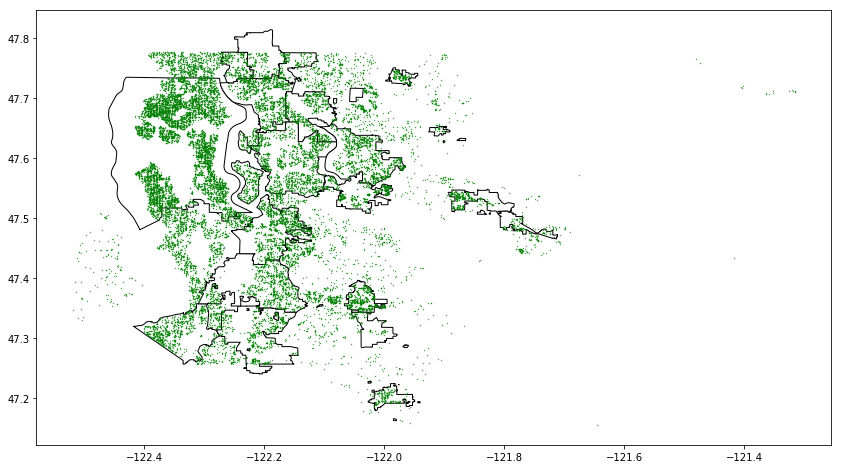

<Figure size 1080x1080 with 0 Axes>

In [5]:
#Add the folder WA to your current working directory
usa = gpd.read_file(cwd+'\\WA\\WSDOT__City_Limits.shp')
usa.head()
gdf = gpd.GeoDataFrame(
    house_df,geometry = [Point(xy) for xy in zip(house_df['long'], house_df['lat'])])
#We can now plot our ``GeoDataFrame``
ax=usa[usa.CityName.isin(house_df.City.unique())].plot(
    color='white', edgecolor='black',figsize=(20,8))
plt.figure(figsize=(15,15))
gdf.plot(ax=ax, color='green', marker='o',markersize=0.1)

In [241]:
#After analysis in p1 - Dropping 'cid','dayhours','basement','yr_built','yr_renovated','zipcode','lat','long','County','Type',
#'geometry','quality_group','month_year' columns.
cols=['cid','dayhours']
house_df_1=house_df.drop(cols, inplace = False, axis = 1)

The dataset worked earlier are giving r2 score on validation set in range 70%-75% with RMSE in range of 96000 to 155000. 
Trying with a different dataset to see if this could be improved further.

For analysis in this iteration categorizing coast, furnished and quality. As in previous version tranformed many features but not got desired result.

### TREATING OUTLIERS
Removing data points which fall into below criteria: 
1. living_measure greater than 9000
2. price greater than 4000000
3. romm_bed greater than 10
4. room_bath greater than 6

We have lost 20 records which is 0.09% of the data available. These records are extreme values for which we dont have much of data to provide their better estimate. Hence removing them.

In [242]:
house_df_2=house_df_1[(house_df['living_measure']<=9000) & (house_df_1['price']<=4000000) & 
                      (house_df_1['room_bed']<=10) & (house_df_1['room_bath']<=6) ]
house_df_2.shape

(21593, 21)

In [243]:
house_df_2.columns

Index(['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'coast', 'sight', 'condition', 'quality', 'ceil_measure',
       'basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'living_measure15', 'lot_measure15', 'furnished', 'total_area'],
      dtype='object')

In [252]:
# Convert into dummies
house_df_final = pd.get_dummies(house_df_2, columns=['coast', 'quality', 'furnished'],drop_first=True)

In [253]:
house_df_final.columns

Index(['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'sight', 'condition', 'ceil_measure', 'basement', 'yr_built',
       'yr_renovated', 'zipcode', 'lat', 'long', 'living_measure15',
       'lot_measure15', 'total_area', 'coast_1', 'quality_3', 'quality_4',
       'quality_5', 'quality_6', 'quality_7', 'quality_8', 'quality_9',
       'quality_10', 'quality_11', 'quality_12', 'quality_13', 'furnished_1'],
      dtype='object')

In [254]:
house_df_final.shape

(21593, 31)

In [268]:
#Final Data columns
house_df_final.columns

Index(['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'sight', 'condition', 'ceil_measure', 'basement', 'yr_built',
       'yr_renovated', 'zipcode', 'lat', 'long', 'living_measure15',
       'lot_measure15', 'total_area', 'coast_1', 'quality_3', 'quality_4',
       'quality_5', 'quality_6', 'quality_7', 'quality_8', 'quality_9',
       'quality_10', 'quality_11', 'quality_12', 'quality_13', 'furnished_1'],
      dtype='object')

#### Shows the Data Correlation between Attributes with Heatmap

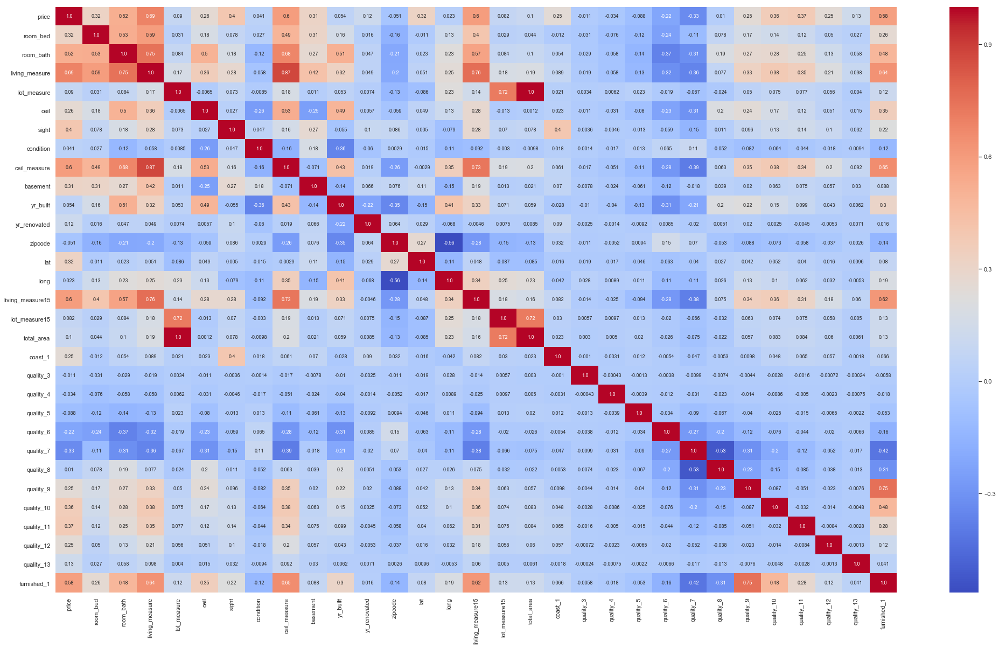

In [256]:
#total_area is highly correlated with lot_measure, ceil_measure is highly correlated with living_measure
house_corr_2 = house_df_final.corr(method ='pearson')
house_corr_2.to_excel("house_corr_2.xls")

plt.figure(figsize=(35,20))
sns.heatmap(house_corr_2,cmap="coolwarm", annot=True,annot_kws={"size":9},fmt='.2')

In [257]:
#creating a copy of the final dataframe
dff2=house_df_final.copy()

In [258]:
df_train, df_test = train_test_split(dff2, test_size=0.2, random_state=10)
df_train, df_val = train_test_split(df_train, test_size=0.2, random_state=10)

In [259]:
print(df_train.shape)
print(df_test.shape)
print(df_val.shape)

(13819, 31)
(4319, 31)
(3455, 31)


In [260]:
# Split the 'df_train' set into X and y
X_train2 = df_train.drop(['price'],axis=1)
y_train2 = df_train['price']
len_train=len(X_train2)
X_train2.shape
y_train2.head()

1320     330000
16628    245000
2923     369000
15818    532000
4665     506400
Name: price, dtype: int64

In [261]:
# Split the 'df_val' set into X and y
X_val2 = df_val.drop(['price'],axis=1)
y_val2 = df_val['price']
len_val=len(X_val2)
X_val2.shape
y_val2.head()

6030     225000
16781    373500
17420    325000
4147     260000
17992    233000
Name: price, dtype: int64

In [262]:
# Split the 'df_test' set into X and y
X_test2 = df_test.drop(['price'],axis=1)
y_test2 = df_test['price']
X_test2.shape
len_test=len(X_test2)
y_test2.head()

19155    510000
10450    264500
14277    266000
7601     735000
6563     600000
Name: price, dtype: int64

##### Will use XGboost model apart from models that used earlier on dataset-1

### Creating Dataframe for Results and Function to compute the scores for each model on its Train and Validation datasets 

In [24]:
#Creating empty dataframe to capture results
result_dff=pd.DataFrame()

In [25]:
#Function to give results of the models for its train and validation dataset.
#as input it requries model name to display, algorithm, train indepedent variables, train dependent variable, 
#validation indepedent variables, validation dependent variable.
def result (model,pipe_model,X_train_set,y_train_set,X_val_set,y_val_set):
    pipe_model.fit(X_train_set,y_train_set)
    #predicting result over test data
    y_train_predict= pipe_model.predict(X_train_set)
    y_val_predict= pipe_model.predict(X_val_set)

    trscore=r2_score(y_train_set,y_train_predict)
    trRMSE=np.sqrt(mean_squared_error(y_train_set,y_train_predict))
    trMSE=mean_squared_error(y_train_set,y_train_predict)
    trMAE=mean_absolute_error(y_train_set,y_train_predict)

    vlscore=r2_score(y_val,y_val_predict)
    vlRMSE=np.sqrt(mean_squared_error(y_val,y_val_predict))
    vlMSE=mean_squared_error(y_val,y_val_predict)
    vlMAE=mean_absolute_error(y_val,y_val_predict)
    result_df=pd.DataFrame({'Method':[model],'val score':vlscore,'RMSE_val':vlRMSE,'MSE_val':vlMSE,'MAE_vl': vlMAE,
                          'train Score':trscore,'RMSE_tr': trRMSE,'MSE_tr': trMSE, 'MAE_tr': trMAE})
    #Plot between actual and predicted values
    plt.figure(figsize=(18,10))
    sns.lineplot(range(len(y_val_set)),y_val_set,color='blue',linewidth=1.5)
    sns.lineplot(range(len(y_val_set)),y_val_predict,color='hotpink',linewidth=.5)
    plt.title('Actual and Predicted', fontsize=20)       # Plot heading 
    plt.xlabel('Index', fontsize=10)                           # X-label
    plt.ylabel('Values', fontsize=10)                          # Y-label

    return result_df

### LINEAR REGRESSION

In [26]:
#Starting with RFE first as there are many features
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426


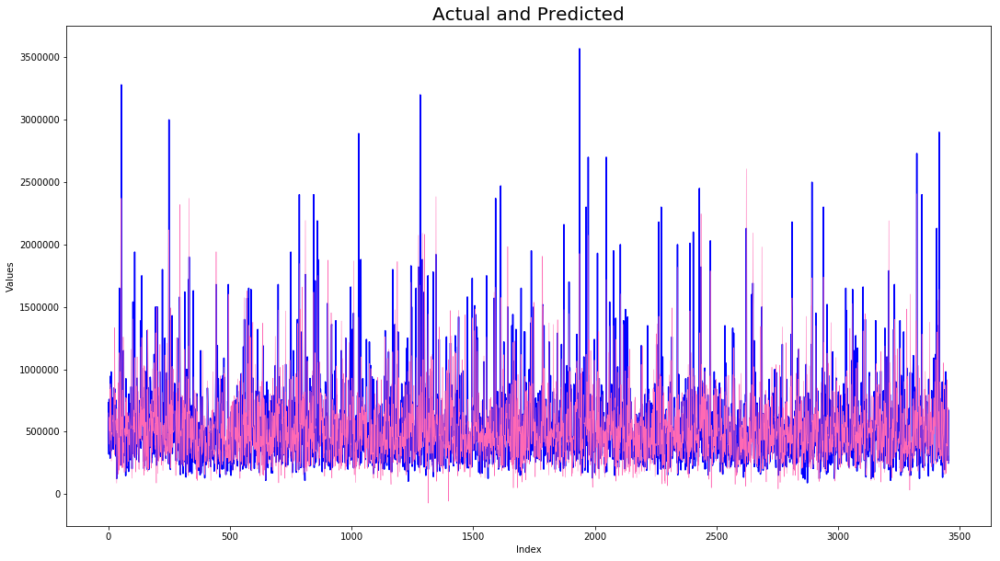

In [27]:
clf=LinearRegression()
pipe_lr = Pipeline([('LR', clf)])
result_dff=pd.concat([result_dff,result('Linear Reg',pipe_lr,X_train,y_train,X_val,y_val)])
result_dff

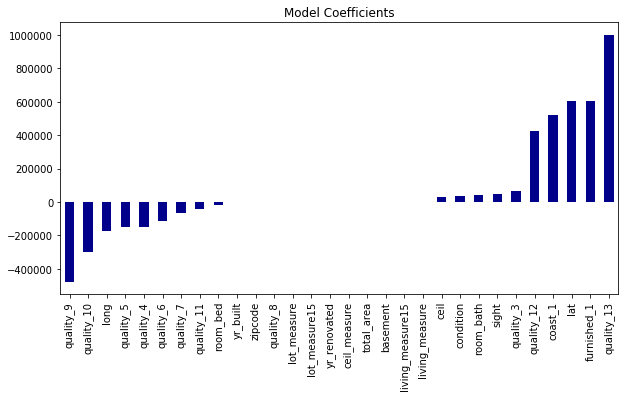

In [28]:
#checking the magnitude of coefficients
predictors = X_train.columns
coef = pd.Series(clf.coef_,predictors).sort_values()
coef.plot(kind='bar', title='Model Coefficients',color='darkblue',figsize=(10,5))

### RIDGE REGRESSION

In [29]:
from sklearn.linear_model import Ridge
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158


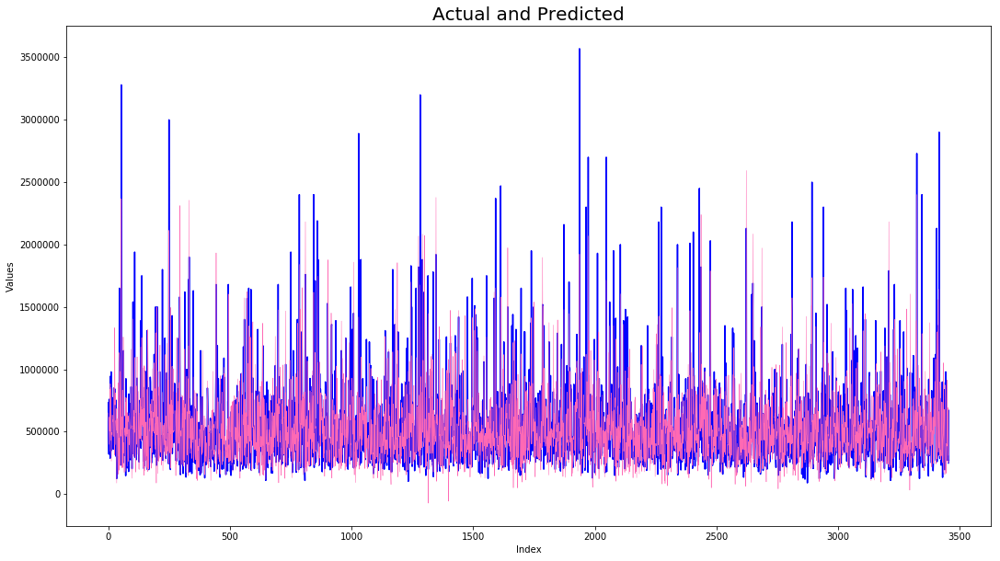

In [30]:
clf=Ridge()
pipe_ridge = Pipeline([('Ridge', clf)])
result_dff=pd.concat([result_dff,result('Ridge_Reg_1',pipe_ridge,X_train,y_train,X_val,y_val)])
result_dff

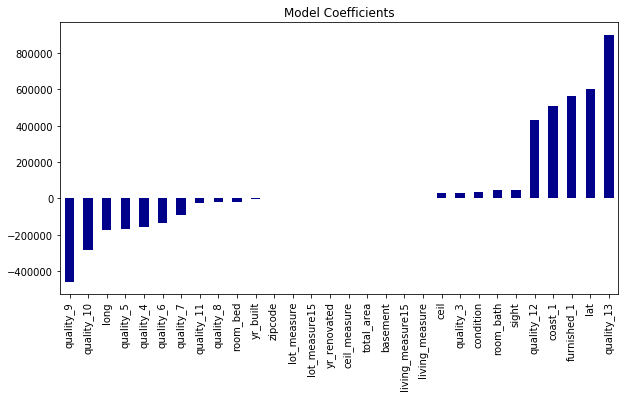

In [31]:
#checking the magnitude of coefficients
predictors = X_train.columns
coef = pd.Series(clf.coef_,predictors).sort_values()
coef.plot(kind='bar', title='Model Coefficients',color='darkblue',figsize=(10,5))

,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158
0,Ridge_Reg_2,0.71767,180805.99847,32690809082.18658,117107.34765,0.72770,181882.56950,33081269088.65812,116939.62012


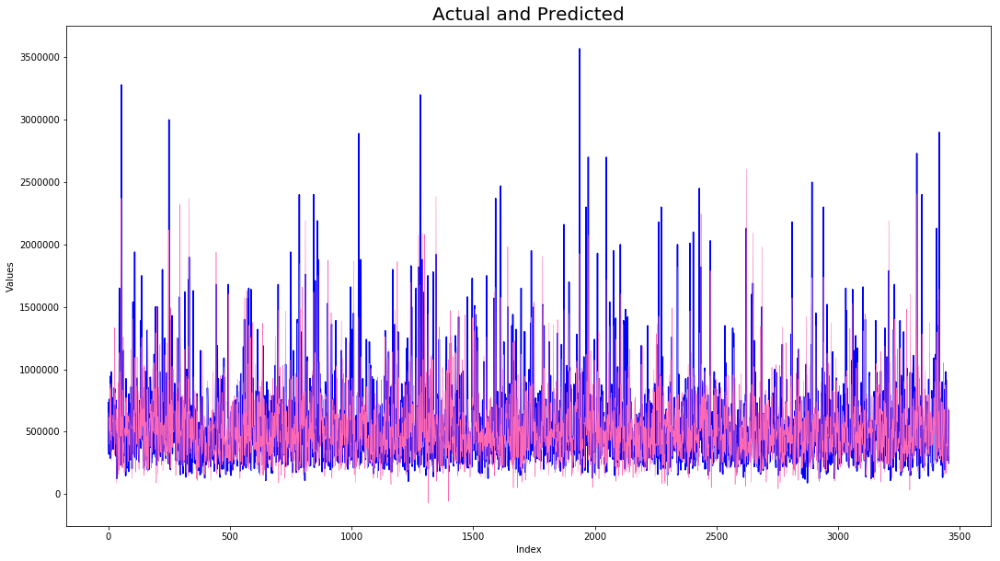

In [32]:
#Iteration 2
clf=Ridge(alpha=0.08)
pipe_ridge_1 = Pipeline([('Ridge',clf )])
result_dff=pd.concat([result_dff,result('Ridge_Reg_2',pipe_ridge_1,X_train,y_train,X_val,y_val)])
result_dff

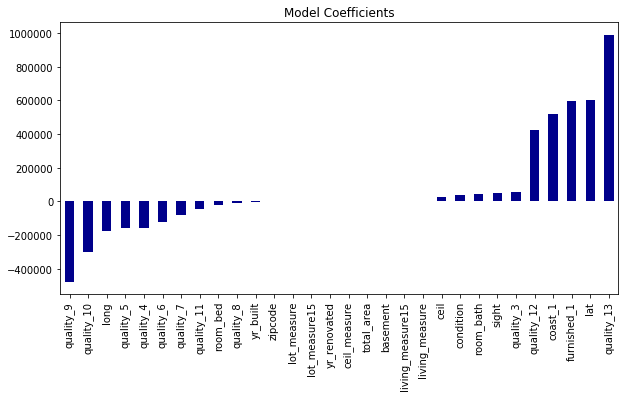

In [33]:
#checking the magnitude of coefficients
predictors = X_train.columns
coef = pd.Series(clf.coef_,predictors).sort_values()
coef.plot(kind='bar', title='Model Coefficients',color='darkblue',figsize=(10,5))

### LASSO REGRESSION

In [34]:
from sklearn.linear_model import Lasso

,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158
0,Ridge_Reg_2,0.71767,180805.99847,32690809082.18658,117107.34765,0.72770,181882.56950,33081269088.65812,116939.62012
0,Lasso_Reg_1,0.71779,180767.09977,32676744360.84573,117084.23084,0.72769,181885.74852,33082425513.47692,116934.69034


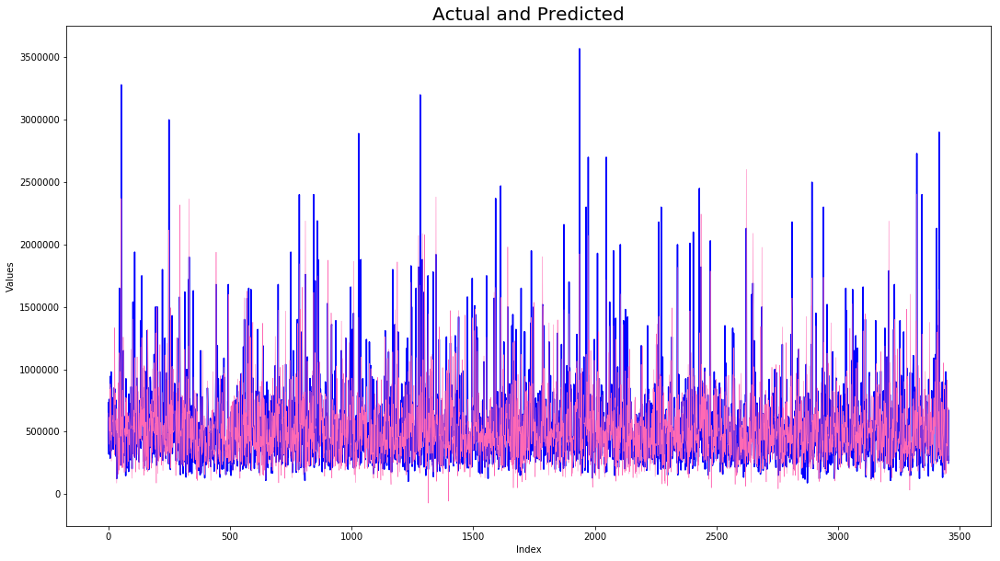

In [35]:
clf=Lasso(alpha=10, max_iter=1000)
pipe_lasso_1 = Pipeline([('Lasso',clf )])
result_dff=pd.concat([result_dff,result('Lasso_Reg_1',pipe_lasso_1,X_train,y_train,X_val,y_val)])
result_dff

In [36]:
#checking the magnitude of coefficients
predictors = X_train.columns
coef = pd.Series(clf.coef_,predictors).sort_values(ascending=False)
coef

quality_13         1282757.93547
quality_12          720634.25526
lat                 603385.77684
coast_1             515951.63187
furnished_1         356060.28711
quality_11          254292.72718
quality_8            51062.02158
sight                48526.08682
quality_3            47977.01520
room_bath            44364.15660
condition            35706.89861
ceil                 28507.08484
living_measure         126.78842
living_measure15        33.97555
yr_renovated            23.50688
total_area               0.35066
quality_10              -0.00000
lot_measure             -0.19029
lot_measure15           -0.29272
basement                -8.54716
ceil_measure           -15.67109
zipcode               -512.28283
yr_built             -2269.56051
quality_7           -16734.79835
room_bed            -18988.08235
quality_6           -63515.14160
quality_4           -89548.16152
quality_5           -97142.30729
long               -172566.03480
quality_9          -177720.13306
dtype: flo

### KNN Regressor

,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158
0,Ridge_Reg_2,0.71767,180805.99847,32690809082.18658,117107.34765,0.72770,181882.56950,33081269088.65812,116939.62012
0,Lasso_Reg_1,0.71779,180767.09977,32676744360.84573,117084.23084,0.72769,181885.74852,33082425513.47692,116934.69034
0,KNN Reg,0.49520,241764.35295,58450002356.08145,151384.98932,0.99935,8894.71112,79115885.95018,727.31898


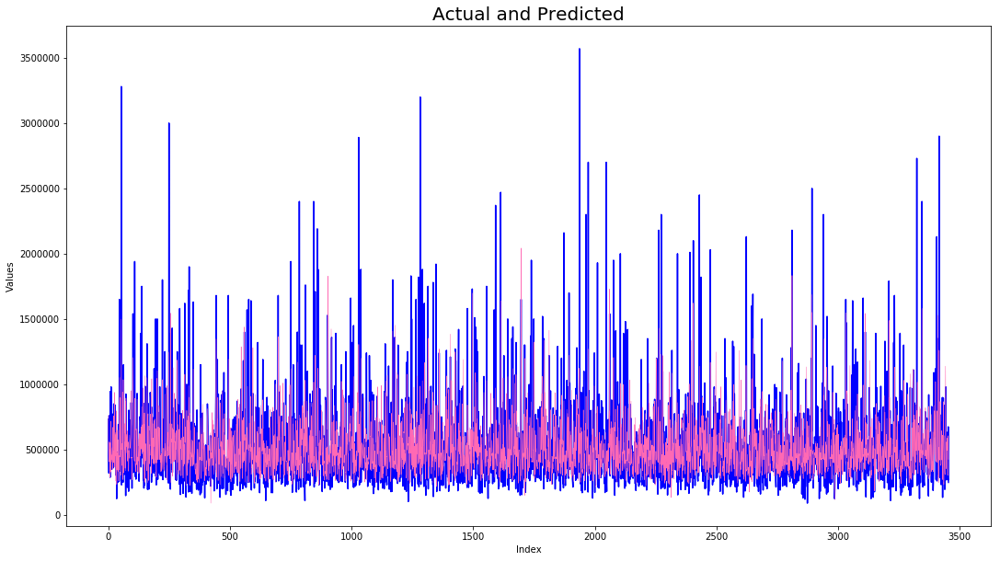

In [37]:
from sklearn.neighbors import KNeighborsRegressor

pipe_knr = Pipeline([('KNNR', KNeighborsRegressor(n_neighbors=20,weights='distance'))])
result_dff=pd.concat([result_dff,result('KNN Reg',pipe_knr,X_train,y_train,X_val,y_val)])
result_dff

### Support Vector Regressor

In [38]:
#The model is not performing well at all.
#from sklearn.svm import SVR
#from sklearn.preprocessing import StandardScaler

#pipe_svr_1 = Pipeline([('scl', StandardScaler()),('SVR_1', SVR(kernel='rbf'))])
#result_dff=pd.concat([result_dff,result('SVR_1',pipe_svr_1,X_train_rfe,y_train,X_val_rfe,y_val)])
#result_dff

### DECISION TREE

In [39]:
#Feature importance function
def feat_imp(model,X_data_set):
    imp_feature_1=pd.DataFrame(model.feature_importances_, columns = ["Imp"], index = X_data_set.columns)
    imp_feature_1=imp_feature_1.sort_values(by="Imp",ascending=False)
    print(imp_feature_1)
    
    #feature importance
    plt.figure(figsize=(10,10))
    imp_feature_1[:30].plot.bar(figsize=(15,5))

    #First 20 and 30 feature importance sum
    print("\nFirst 8 feature importance:\t",(imp_feature_1[:8].sum())*100)
    print("\nFirst 12 feature importance:\t",(imp_feature_1[:12].sum())*100)

,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158
0,Ridge_Reg_2,0.71767,180805.99847,32690809082.18658,117107.34765,0.72770,181882.56950,33081269088.65812,116939.62012
0,Lasso_Reg_1,0.71779,180767.09977,32676744360.84573,117084.23084,0.72769,181885.74852,33082425513.47692,116934.69034
0,KNN Reg,0.49520,241764.35295,58450002356.08145,151384.98932,0.99935,8894.71112,79115885.95018,727.31898
0,DT1,0.73194,176176.01494,31037988240.89530,98457.42069,0.99935,8894.71112,79115885.95018,727.31898


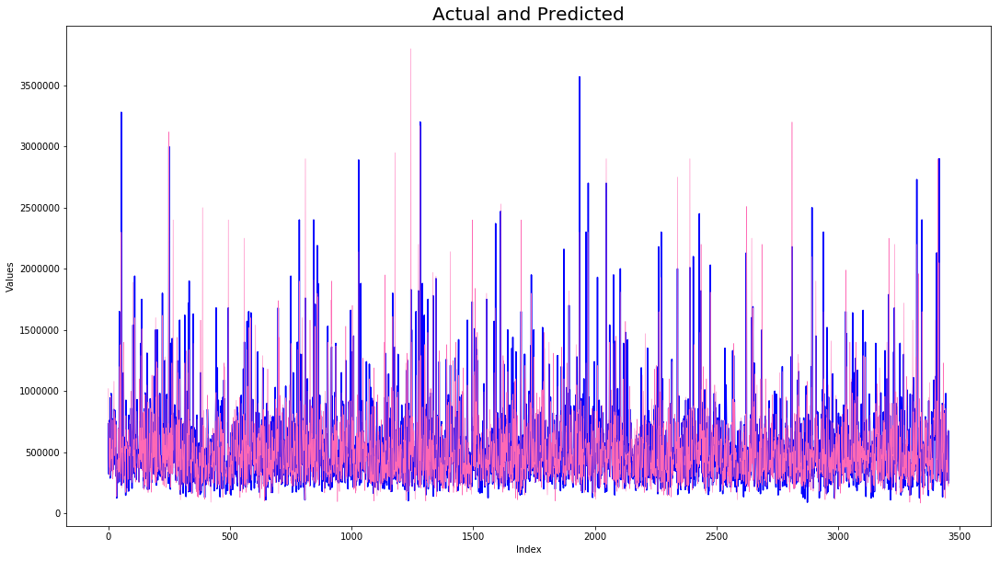

In [40]:
#Import library
from sklearn.tree import DecisionTreeRegressor

clf=DecisionTreeRegressor(random_state=1)
pipe_DT_1=Pipeline([('DT1',clf)])
result_dff=pd.concat([result_dff,result('DT1',pipe_DT_1,X_train,y_train,X_val,y_val)])
result_dff

                     Imp
furnished_1      0.33440
living_measure   0.19412
lat              0.17853
long             0.06748
coast_1          0.03510
ceil_measure     0.03389
yr_built         0.03233
living_measure15 0.03192
lot_measure      0.01480
zipcode          0.01341
lot_measure15    0.01192
total_area       0.00832
quality_9        0.00781
room_bath        0.00697
sight            0.00633
quality_8        0.00496
basement         0.00436
condition        0.00266
quality_12       0.00247
quality_10       0.00206
room_bed         0.00199
ceil             0.00180
yr_renovated     0.00080
quality_13       0.00048
quality_11       0.00044
quality_7        0.00030
quality_6        0.00026
quality_5        0.00008
quality_4        0.00000
quality_3        0.00000

First 8 feature importance:	 Imp   90.77687
dtype: float64

First 12 feature importance:	 Imp   95.62215
dtype: float64


<Figure size 720x720 with 0 Axes>

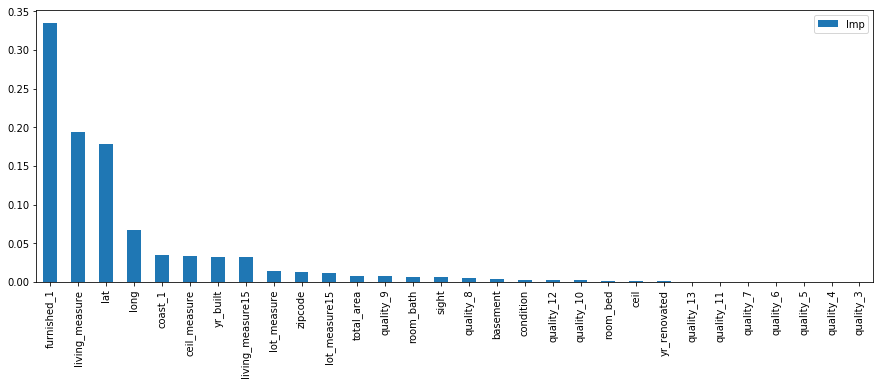

In [41]:
#Feature importance
feat_imp(clf,X_train)

### RANDOM FOREST REGRESSOR

In [42]:
from sklearn.ensemble import RandomForestRegressor

,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158
0,Ridge_Reg_2,0.71767,180805.99847,32690809082.18658,117107.34765,0.72770,181882.56950,33081269088.65812,116939.62012
0,Lasso_Reg_1,0.71779,180767.09977,32676744360.84573,117084.23084,0.72769,181885.74852,33082425513.47692,116934.69034
0,KNN Reg,0.49520,241764.35295,58450002356.08145,151384.98932,0.99935,8894.71112,79115885.95018,727.31898
0,DT1,0.73194,176176.01494,31037988240.89530,98457.42069,0.99935,8894.71112,79115885.95018,727.31898
0,RF1,0.86124,126756.92547,16067318155.28575,72879.33149,0.97466,55482.79772,3078340842.83595,29823.87866


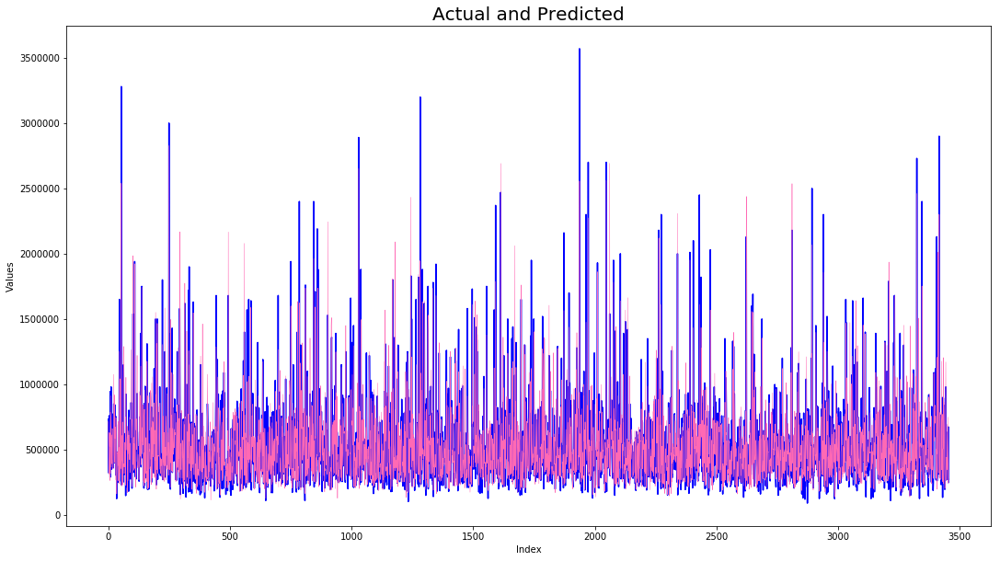

In [43]:
clf=RandomForestRegressor(random_state=2)
pipe_RF_1=Pipeline([('RF1',clf)])
result_dff=pd.concat([result_dff,result('RF1',pipe_RF_1,X_train,y_train,X_val,y_val)])
result_dff

                     Imp
furnished_1      0.30826
living_measure   0.23477
lat              0.17234
long             0.06825
living_measure15 0.03089
yr_built         0.02564
coast_1          0.02493
sight            0.01985
ceil_measure     0.01696
zipcode          0.01531
lot_measure15    0.01387
quality_9        0.01243
total_area       0.01047
lot_measure      0.00850
room_bath        0.00705
basement         0.00688
quality_8        0.00417
room_bed         0.00380
condition        0.00321
quality_12       0.00262
yr_renovated     0.00247
ceil             0.00221
quality_11       0.00169
quality_10       0.00148
quality_13       0.00096
quality_7        0.00063
quality_6        0.00030
quality_5        0.00005
quality_4        0.00001
quality_3        0.00000

First 8 feature importance:	 Imp   88.49277
dtype: float64

First 12 feature importance:	 Imp   94.34987
dtype: float64


<Figure size 720x720 with 0 Axes>

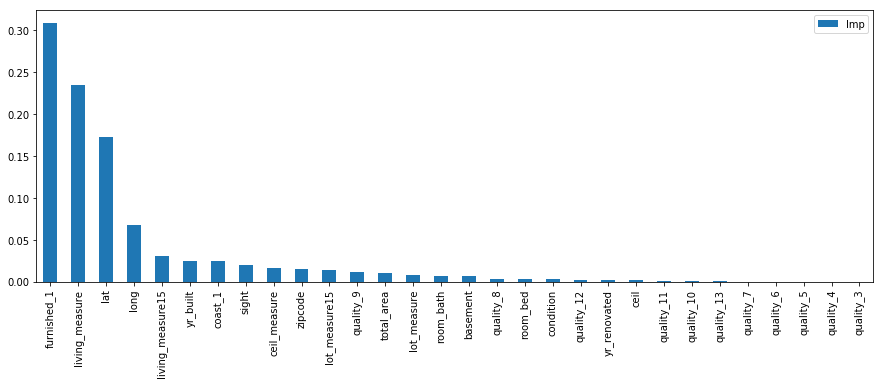

In [44]:
#Feature importance
feat_imp(clf,X_train)

,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158
0,Ridge_Reg_2,0.71767,180805.99847,32690809082.18658,117107.34765,0.72770,181882.56950,33081269088.65812,116939.62012
0,Lasso_Reg_1,0.71779,180767.09977,32676744360.84573,117084.23084,0.72769,181885.74852,33082425513.47692,116934.69034
0,KNN Reg,0.49520,241764.35295,58450002356.08145,151384.98932,0.99935,8894.71112,79115885.95018,727.31898
0,DT1,0.73194,176176.01494,31037988240.89530,98457.42069,0.99935,8894.71112,79115885.95018,727.31898
0,RF1,0.86124,126756.92547,16067318155.28575,72879.33149,0.97466,55482.79772,3078340842.83595,29823.87866
0,RF2,0.84822,132566.13475,17573780083.03317,73418.66929,0.90321,108435.52475,11758263028.16183,58027.92388


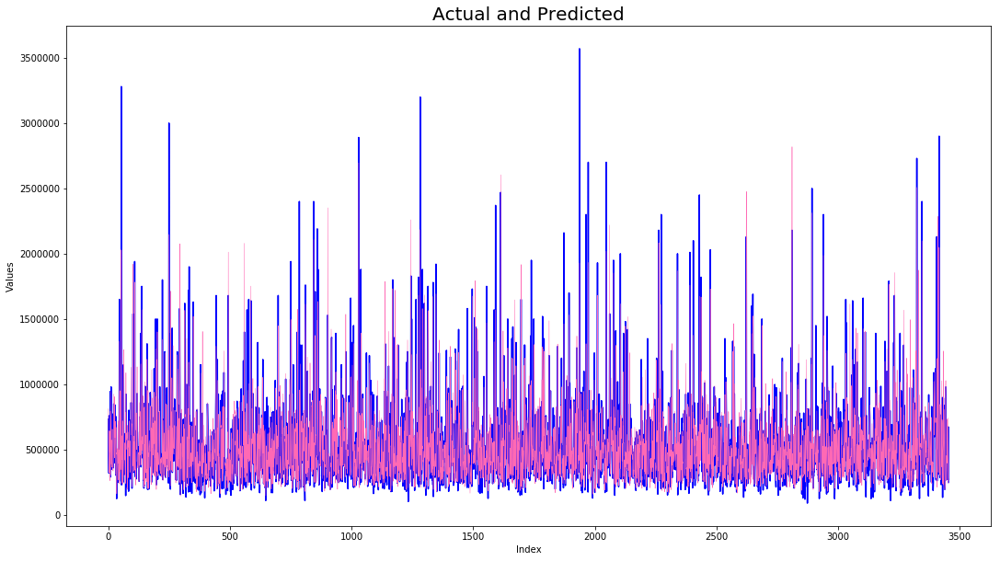

In [45]:
clf=RandomForestRegressor(n_estimators=50,max_depth=18,min_samples_leaf=10,random_state=3)
pipe_RF_2=Pipeline([('RF2',clf)])
result_dff=pd.concat([result_dff,result('RF2',pipe_RF_2,X_train,y_train,X_val,y_val)])
result_dff

                     Imp
furnished_1      0.34209
living_measure   0.25693
lat              0.18194
long             0.07106
living_measure15 0.02514
yr_built         0.02336
sight            0.01984
ceil_measure     0.01841
zipcode          0.01135
quality_9        0.00908
coast_1          0.00864
lot_measure15    0.00801
total_area       0.00561
quality_8        0.00449
lot_measure      0.00336
room_bath        0.00277
basement         0.00172
quality_12       0.00139
condition        0.00123
quality_11       0.00095
room_bed         0.00073
quality_10       0.00073
quality_7        0.00044
ceil             0.00036
yr_renovated     0.00022
quality_6        0.00017
quality_5        0.00001
quality_4        0.00000
quality_3        0.00000
quality_13       0.00000

First 8 feature importance:	 Imp   93.87443
dtype: float64

First 12 feature importance:	 Imp   97.58247
dtype: float64


<Figure size 720x720 with 0 Axes>

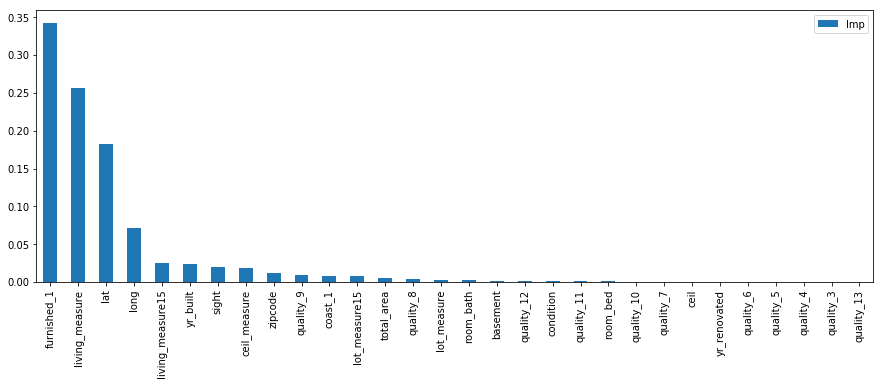

In [46]:
#Feature importance
feat_imp(clf,X_train)

### Gradient Boost Regressor

,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158
0,Ridge_Reg_2,0.71767,180805.99847,32690809082.18658,117107.34765,0.72770,181882.56950,33081269088.65812,116939.62012
0,Lasso_Reg_1,0.71779,180767.09977,32676744360.84573,117084.23084,0.72769,181885.74852,33082425513.47692,116934.69034
0,KNN Reg,0.49520,241764.35295,58450002356.08145,151384.98932,0.99935,8894.71112,79115885.95018,727.31898
0,DT1,0.73194,176176.01494,31037988240.89530,98457.42069,0.99935,8894.71112,79115885.95018,727.31898
0,RF1,0.86124,126756.92547,16067318155.28575,72879.33149,0.97466,55482.79772,3078340842.83595,29823.87866
0,RF2,0.84822,132566.13475,17573780083.03317,73418.66929,0.90321,108435.52475,11758263028.16183,58027.92388
0,GB1,0.87310,121214.62351,14692984951.50343,75637.11090,0.89488,113007.60730,12770719307.93105,72392.61443


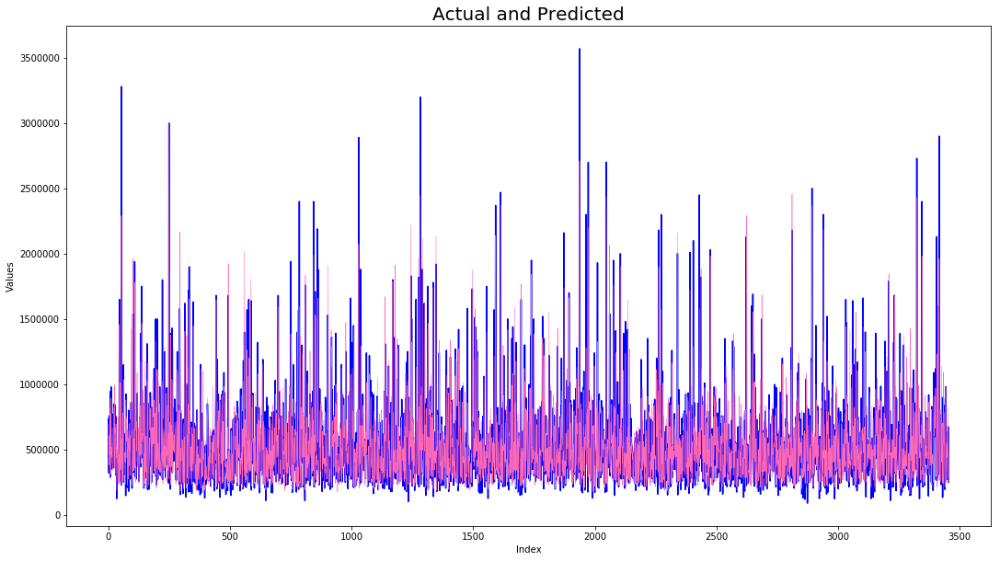

In [47]:
from sklearn.ensemble import GradientBoostingRegressor

clf=GradientBoostingRegressor(random_state=4)
pipe_GB_1=Pipeline([('GB1',clf)])
result_dff=pd.concat([result_dff,result('GB1',pipe_GB_1,X_train,y_train,X_val,y_val)])
result_dff

                     Imp
living_measure   0.32718
furnished_1      0.21738
lat              0.17507
long             0.06494
living_measure15 0.03217
coast_1          0.03081
yr_built         0.03081
sight            0.02848
zipcode          0.01718
quality_9        0.01411
ceil_measure     0.01139
quality_12       0.00933
quality_8        0.00850
room_bath        0.00848
quality_11       0.00673
quality_13       0.00363
lot_measure15    0.00331
condition        0.00300
basement         0.00221
total_area       0.00147
yr_renovated     0.00103
lot_measure      0.00079
quality_7        0.00052
ceil             0.00048
quality_10       0.00046
room_bed         0.00037
quality_6        0.00017
quality_3        0.00000
quality_4        0.00000
quality_5        0.00000

First 8 feature importance:	 Imp   90.68436
dtype: float64

First 12 feature importance:	 Imp   95.88511
dtype: float64


<Figure size 720x720 with 0 Axes>

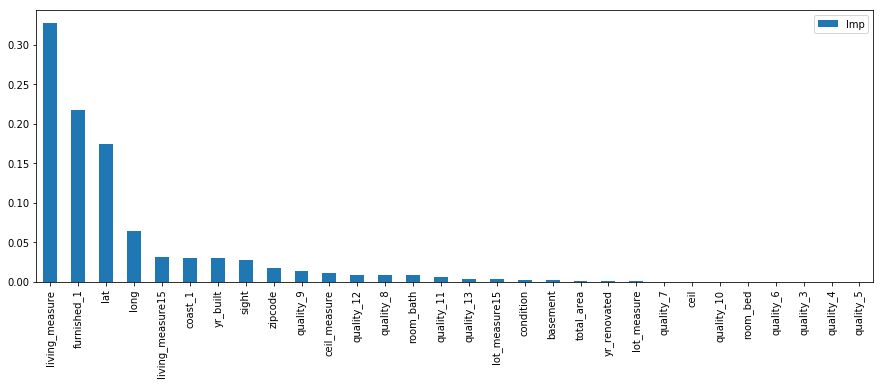

In [48]:
#Feature importance
feat_imp(clf,X_train)

,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158
0,Ridge_Reg_2,0.71767,180805.99847,32690809082.18658,117107.34765,0.72770,181882.56950,33081269088.65812,116939.62012
0,Lasso_Reg_1,0.71779,180767.09977,32676744360.84573,117084.23084,0.72769,181885.74852,33082425513.47692,116934.69034
0,KNN Reg,0.49520,241764.35295,58450002356.08145,151384.98932,0.99935,8894.71112,79115885.95018,727.31898
0,DT1,0.73194,176176.01494,31037988240.89530,98457.42069,0.99935,8894.71112,79115885.95018,727.31898
0,RF1,0.86124,126756.92547,16067318155.28575,72879.33149,0.97466,55482.79772,3078340842.83595,29823.87866
0,RF2,0.84822,132566.13475,17573780083.03317,73418.66929,0.90321,108435.52475,11758263028.16183,58027.92388
0,GB1,0.87310,121214.62351,14692984951.50343,75637.11090,0.89488,113007.60730,12770719307.93105,72392.61443
0,GB2,0.89502,110253.77869,12155895714.51771,65759.78139,0.95298,75577.21752,5711915808.16859,52291.11107


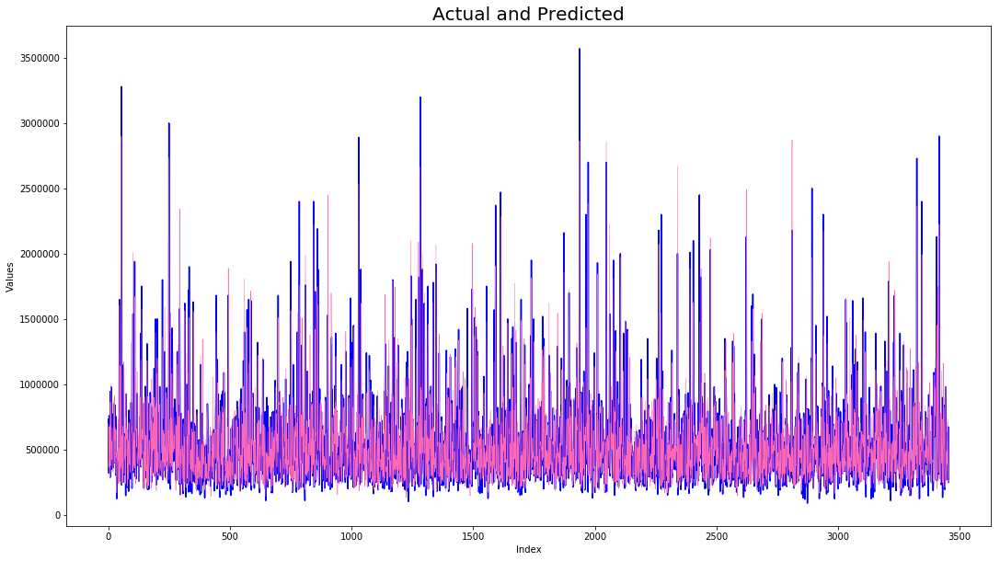

In [49]:
clf=GradientBoostingRegressor(n_estimators=150,max_depth=5,random_state=5)
pipe_GB_2=Pipeline([('GB2',clf)])
result_dff=pd.concat([result_dff,result('GB2',pipe_GB_2,X_train,y_train,X_val,y_val)])
result_dff

                     Imp
living_measure   0.28697
furnished_1      0.22921
lat              0.17826
long             0.07063
living_measure15 0.04054
yr_built         0.03118
coast_1          0.03031
quality_9        0.02114
sight            0.02033
zipcode          0.01644
ceil_measure     0.01361
quality_8        0.00939
quality_10       0.00815
total_area       0.00797
room_bath        0.00609
lot_measure15    0.00533
lot_measure      0.00417
basement         0.00412
quality_12       0.00352
quality_11       0.00347
condition        0.00311
quality_13       0.00196
yr_renovated     0.00142
room_bed         0.00107
ceil             0.00096
quality_7        0.00053
quality_6        0.00009
quality_5        0.00004
quality_3        0.00000
quality_4        0.00000

First 8 feature importance:	 Imp   88.82445
dtype: float64

First 12 feature importance:	 Imp   94.80237
dtype: float64


<Figure size 720x720 with 0 Axes>

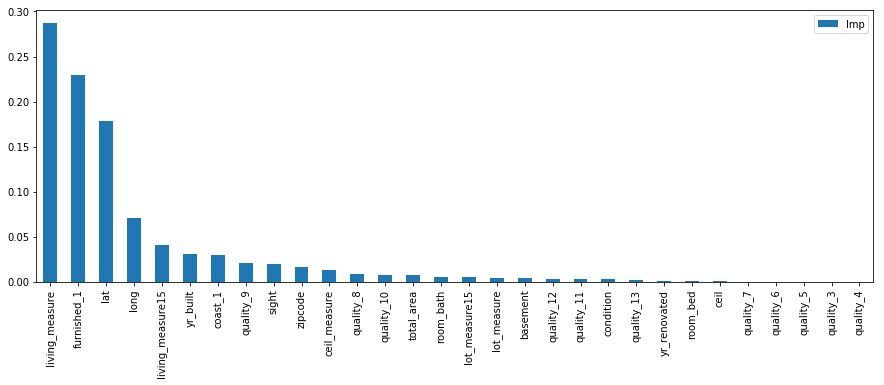

In [50]:
#Feature importance
feat_imp(clf,X_train)

### XGBOOST REGRESSOR

,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158
0,Ridge_Reg_2,0.71767,180805.99847,32690809082.18658,117107.34765,0.72770,181882.56950,33081269088.65812,116939.62012
0,Lasso_Reg_1,0.71779,180767.09977,32676744360.84573,117084.23084,0.72769,181885.74852,33082425513.47692,116934.69034
0,KNN Reg,0.49520,241764.35295,58450002356.08145,151384.98932,0.99935,8894.71112,79115885.95018,727.31898
0,DT1,0.73194,176176.01494,31037988240.89530,98457.42069,0.99935,8894.71112,79115885.95018,727.31898
0,RF1,0.86124,126756.92547,16067318155.28575,72879.33149,0.97466,55482.79772,3078340842.83595,29823.87866
0,RF2,0.84822,132566.13475,17573780083.03317,73418.66929,0.90321,108435.52475,11758263028.16183,58027.92388
0,GB1,0.87310,121214.62351,14692984951.50343,75637.11090,0.89488,113007.60730,12770719307.93105,72392.61443
0,GB2,0.89502,110253.77869,12155895714.51771,65759.78139,0.95298,75577.21752,5711915808.16859,52291.11107


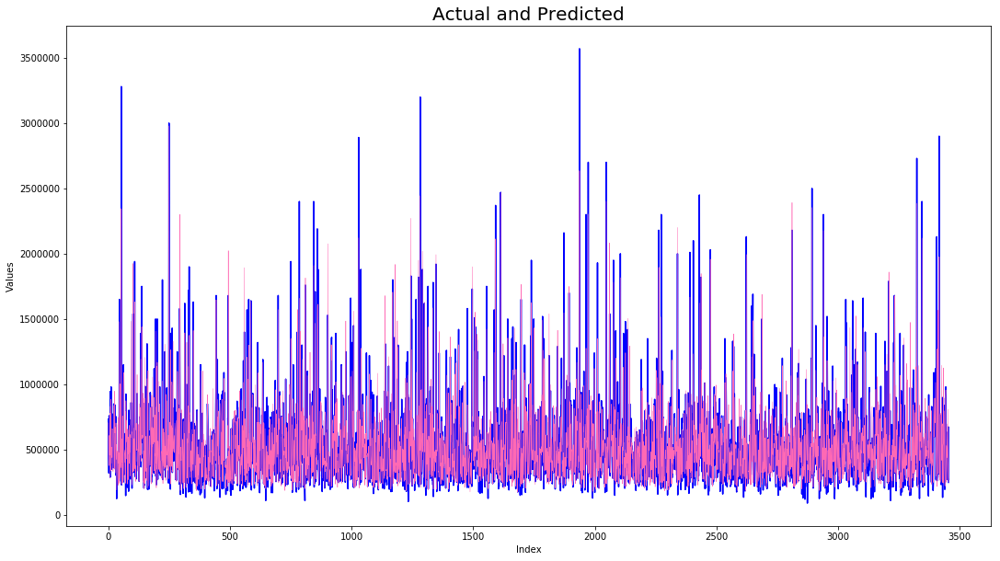

In [51]:
from xgboost.sklearn import XGBRegressor

clf=XGBRegressor(objective='reg:squarederror',random_state=6)
pipe_XGB_1=Pipeline([('XGB1',clf)])
result_dff=pd.concat([result_dff,result('XGB1',pipe_XGB_1,X_train,y_train,X_val,y_val)])
result_dff

                     Imp
furnished_1      0.44495
quality_9        0.15441
living_measure   0.08844
coast_1          0.04030
sight            0.03631
quality_8        0.03330
lat              0.03246
long             0.02696
quality_12       0.02049
yr_built         0.01917
living_measure15 0.01869
room_bath        0.01360
zipcode          0.01226
quality_11       0.01098
quality_7        0.00875
ceil_measure     0.00861
quality_13       0.00664
condition        0.00428
lot_measure15    0.00364
yr_renovated     0.00294
basement         0.00252
lot_measure      0.00238
ceil             0.00213
total_area       0.00198
quality_6        0.00197
room_bed         0.00186
quality_3        0.00000
quality_4        0.00000
quality_5        0.00000
quality_10       0.00000

First 8 feature importance:	 Imp   85.71182
dtype: float32

First 12 feature importance:	 Imp   92.90607
dtype: float32


<Figure size 720x720 with 0 Axes>

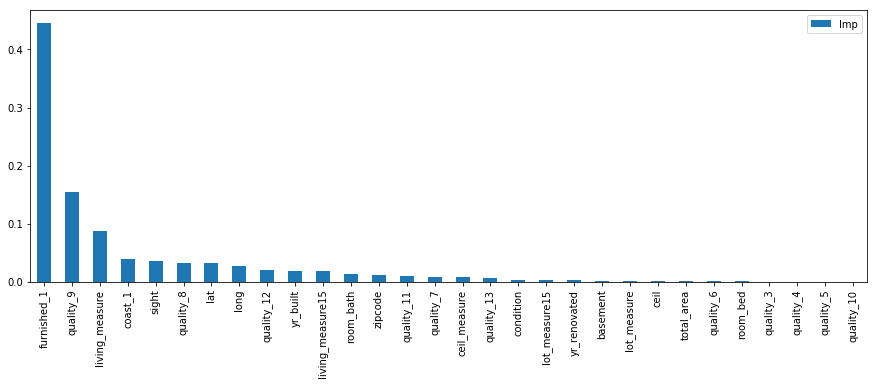

In [52]:
#Feature importance
feat_imp(clf,X_train)

[18:09:21] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158
0,Ridge_Reg_2,0.71767,180805.99847,32690809082.18658,117107.34765,0.72770,181882.56950,33081269088.65812,116939.62012
0,Lasso_Reg_1,0.71779,180767.09977,32676744360.84573,117084.23084,0.72769,181885.74852,33082425513.47692,116934.69034
0,KNN Reg,0.49520,241764.35295,58450002356.08145,151384.98932,0.99935,8894.71112,79115885.95018,727.31898
0,DT1,0.73194,176176.01494,31037988240.89530,98457.42069,0.99935,8894.71112,79115885.95018,727.31898
0,RF1,0.86124,126756.92547,16067318155.28575,72879.33149,0.97466,55482.79772,3078340842.83595,29823.87866
0,RF2,0.84822,132566.13475,17573780083.03317,73418.66929,0.90321,108435.52475,11758263028.16183,58027.92388
0,GB1,0.87310,121214.62351,14692984951.50343,75637.11090,0.89488,113007.60730,12770719307.93105,72392.61443
0,GB2,0.89502,110253.77869,12155895714.51771,65759.78139,0.95298,75577.21752,5711915808.16859,52291.11107


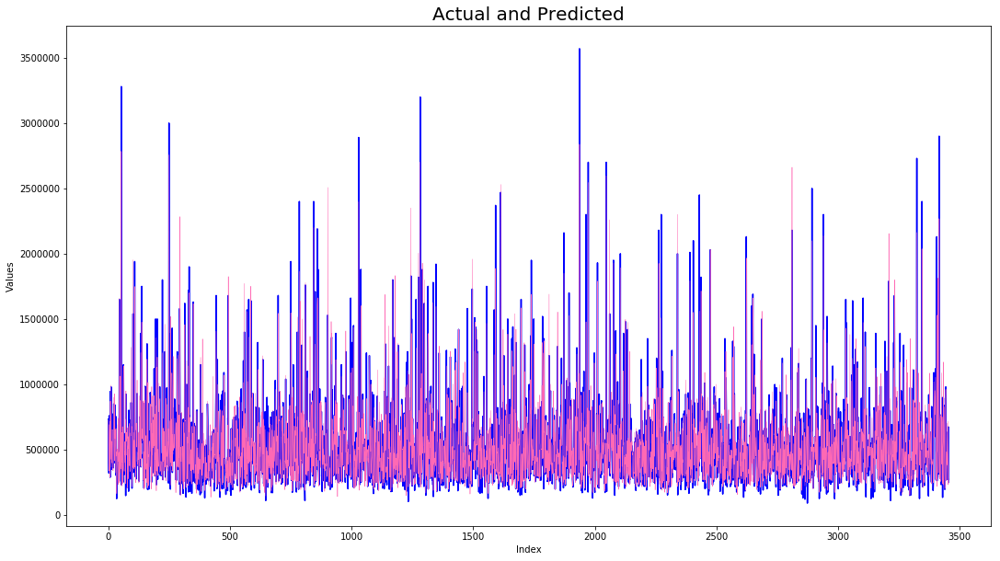

In [53]:
clf=XGBRegressor(n_estimators=150,max_depth=5,random_state=7)
pipe_XGB_2=Pipeline([('XGB2',clf)])
result_dff=pd.concat([result_dff,result('XGB2',pipe_XGB_2,X_train,y_train,X_val,y_val)])
result_dff

                     Imp
furnished_1      0.59499
living_measure   0.06767
quality_9        0.06470
coast_1          0.04365
quality_8        0.03345
lat              0.03122
quality_10       0.03027
sight            0.02396
long             0.01961
quality_12       0.01526
living_measure15 0.01122
yr_built         0.01016
quality_11       0.00679
quality_13       0.00676
zipcode          0.00626
ceil_measure     0.00527
quality_7        0.00439
condition        0.00407
total_area       0.00362
room_bath        0.00278
lot_measure15    0.00274
yr_renovated     0.00219
lot_measure      0.00217
basement         0.00205
quality_6        0.00153
ceil             0.00153
room_bed         0.00113
quality_5        0.00055
quality_4        0.00000
quality_3        0.00000

First 8 feature importance:	 Imp   88.99167
dtype: float32

First 12 feature importance:	 Imp   94.61620
dtype: float32


<Figure size 720x720 with 0 Axes>

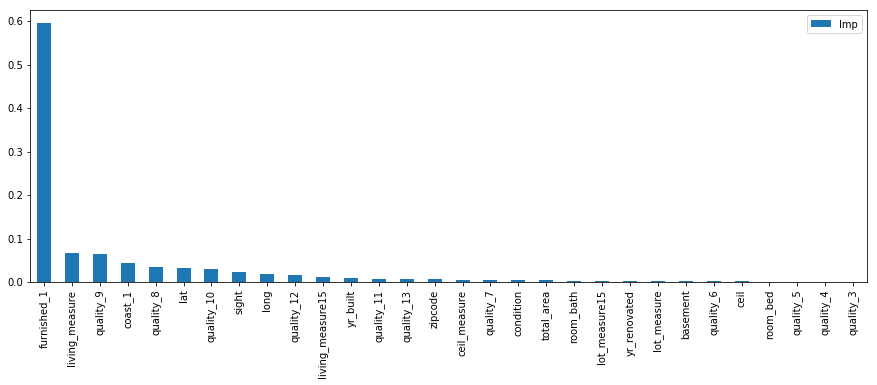

In [54]:
#Feature importance
feat_imp(clf,X_train)

### ADABOOST REGRESSOR

,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158
0,Ridge_Reg_2,0.71767,180805.99847,32690809082.18658,117107.34765,0.72770,181882.56950,33081269088.65812,116939.62012
0,Lasso_Reg_1,0.71779,180767.09977,32676744360.84573,117084.23084,0.72769,181885.74852,33082425513.47692,116934.69034
0,KNN Reg,0.49520,241764.35295,58450002356.08145,151384.98932,0.99935,8894.71112,79115885.95018,727.31898
0,DT1,0.73194,176176.01494,31037988240.89530,98457.42069,0.99935,8894.71112,79115885.95018,727.31898
0,RF1,0.86124,126756.92547,16067318155.28575,72879.33149,0.97466,55482.79772,3078340842.83595,29823.87866
0,RF2,0.84822,132566.13475,17573780083.03317,73418.66929,0.90321,108435.52475,11758263028.16183,58027.92388
0,GB1,0.87310,121214.62351,14692984951.50343,75637.11090,0.89488,113007.60730,12770719307.93105,72392.61443
0,GB2,0.89502,110253.77869,12155895714.51771,65759.78139,0.95298,75577.21752,5711915808.16859,52291.11107


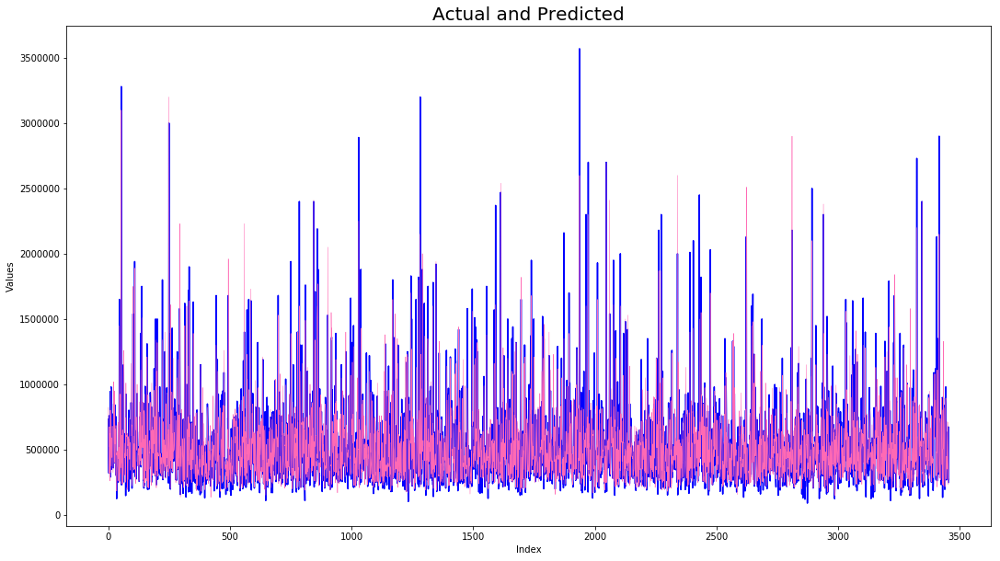

In [55]:
from sklearn.ensemble import AdaBoostRegressor

clf= AdaBoostRegressor(DecisionTreeRegressor(random_state=8))
pipe_ADAB_1=Pipeline([('ADAB1',clf)])
result_dff=pd.concat([result_dff,result('ADAB1',pipe_ADAB_1,X_train,y_train,X_val,y_val)])
result_dff

                     Imp
living_measure   0.50994
lat              0.09959
furnished_1      0.06601
long             0.06142
coast_1          0.04096
living_measure15 0.04011
sight            0.03042
ceil_measure     0.02662
yr_built         0.01886
lot_measure15    0.01721
zipcode          0.01391
total_area       0.01116
room_bath        0.01004
lot_measure      0.00888
quality_11       0.00824
basement         0.00793
quality_12       0.00540
quality_13       0.00373
quality_9        0.00355
room_bed         0.00343
ceil             0.00261
yr_renovated     0.00252
condition        0.00235
quality_8        0.00226
quality_10       0.00209
quality_7        0.00055
quality_6        0.00017
quality_5        0.00002
quality_4        0.00000
quality_3        0.00000

First 8 feature importance:	 Imp   87.50772
dtype: float64

First 12 feature importance:	 Imp   93.62163
dtype: float64


<Figure size 720x720 with 0 Axes>

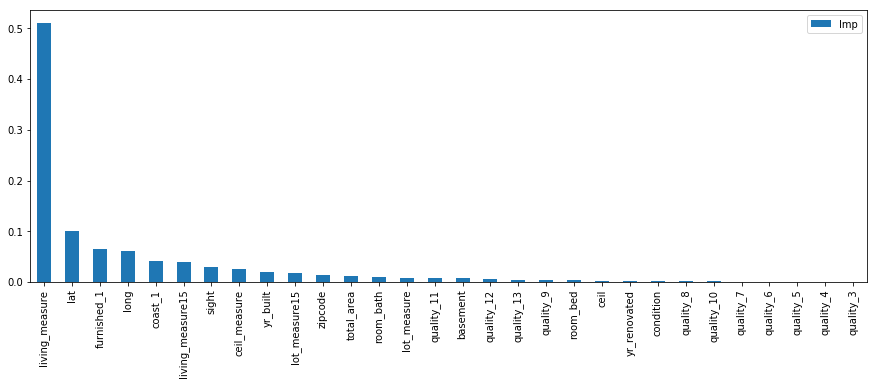

In [56]:
#Feature importance
feat_imp(clf,X_train)

,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158
0,Ridge_Reg_2,0.71767,180805.99847,32690809082.18658,117107.34765,0.72770,181882.56950,33081269088.65812,116939.62012
0,Lasso_Reg_1,0.71779,180767.09977,32676744360.84573,117084.23084,0.72769,181885.74852,33082425513.47692,116934.69034
0,KNN Reg,0.49520,241764.35295,58450002356.08145,151384.98932,0.99935,8894.71112,79115885.95018,727.31898
0,DT1,0.73194,176176.01494,31037988240.89530,98457.42069,0.99935,8894.71112,79115885.95018,727.31898
0,RF1,0.86124,126756.92547,16067318155.28575,72879.33149,0.97466,55482.79772,3078340842.83595,29823.87866
0,RF2,0.84822,132566.13475,17573780083.03317,73418.66929,0.90321,108435.52475,11758263028.16183,58027.92388
0,GB1,0.87310,121214.62351,14692984951.50343,75637.11090,0.89488,113007.60730,12770719307.93105,72392.61443
0,GB2,0.89502,110253.77869,12155895714.51771,65759.78139,0.95298,75577.21752,5711915808.16859,52291.11107


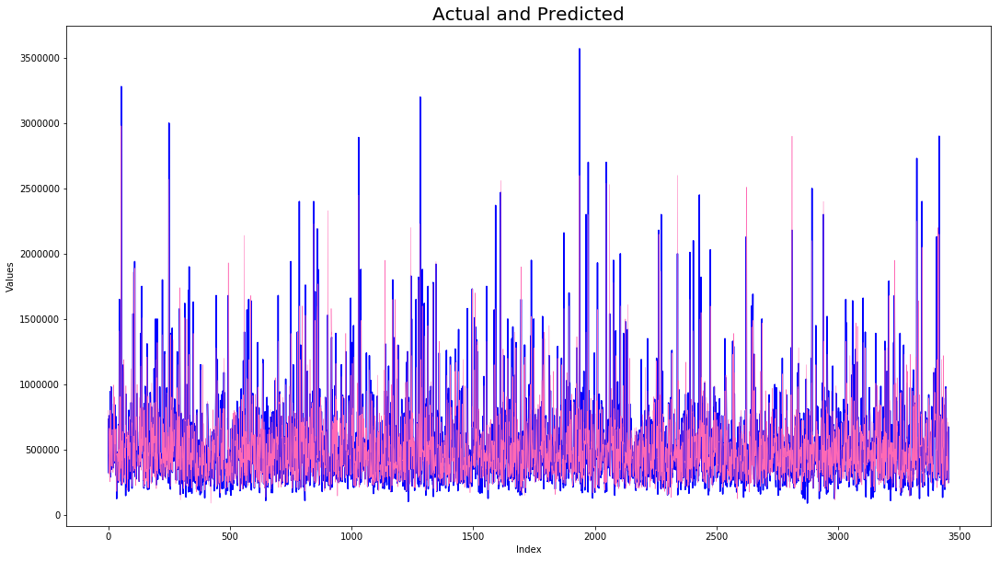

In [57]:
clf= AdaBoostRegressor(DecisionTreeRegressor(max_depth=20),n_estimators=250,learning_rate=0.005,random_state=9)
pipe_ADAB_2=Pipeline([('ADAB2',clf)])
result_dff=pd.concat([result_dff,result('ADAB2',pipe_ADAB_2,X_train,y_train,X_val,y_val)])
result_dff

                     Imp
living_measure   0.31020
furnished_1      0.22982
lat              0.16848
long             0.07221
living_measure15 0.03353
coast_1          0.02876
yr_built         0.02456
ceil_measure     0.02078
sight            0.01669
zipcode          0.01550
lot_measure15    0.01533
total_area       0.01060
lot_measure      0.00862
quality_9        0.00846
room_bath        0.00701
basement         0.00560
quality_8        0.00364
room_bed         0.00335
condition        0.00317
quality_12       0.00265
quality_11       0.00260
yr_renovated     0.00229
ceil             0.00218
quality_10       0.00175
quality_13       0.00100
quality_7        0.00080
quality_6        0.00032
quality_5        0.00008
quality_4        0.00001
quality_3        0.00000

First 8 feature importance:	 Imp   88.83441
dtype: float64

First 12 feature importance:	 Imp   94.64739
dtype: float64


<Figure size 720x720 with 0 Axes>

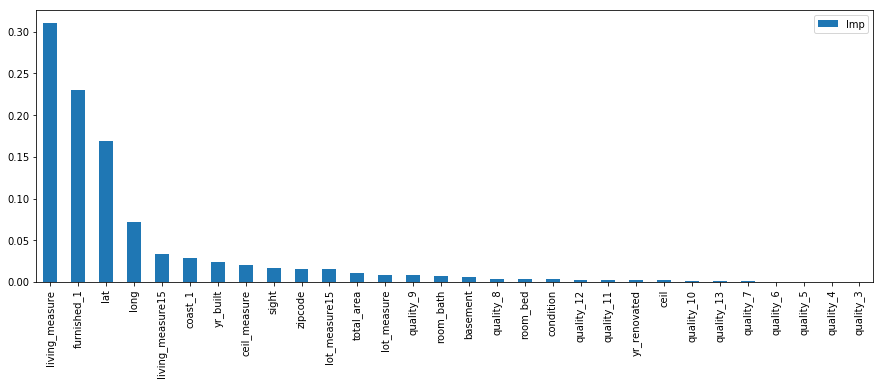

In [58]:
#Feature importance
feat_imp(clf,X_train)

### BAGGING REGRESSION

,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158
0,Ridge_Reg_2,0.71767,180805.99847,32690809082.18658,117107.34765,0.72770,181882.56950,33081269088.65812,116939.62012
0,Lasso_Reg_1,0.71779,180767.09977,32676744360.84573,117084.23084,0.72769,181885.74852,33082425513.47692,116934.69034
0,KNN Reg,0.49520,241764.35295,58450002356.08145,151384.98932,0.99935,8894.71112,79115885.95018,727.31898
0,DT1,0.73194,176176.01494,31037988240.89530,98457.42069,0.99935,8894.71112,79115885.95018,727.31898
0,RF1,0.86124,126756.92547,16067318155.28575,72879.33149,0.97466,55482.79772,3078340842.83595,29823.87866
0,RF2,0.84822,132566.13475,17573780083.03317,73418.66929,0.90321,108435.52475,11758263028.16183,58027.92388
0,GB1,0.87310,121214.62351,14692984951.50343,75637.11090,0.89488,113007.60730,12770719307.93105,72392.61443
0,GB2,0.89502,110253.77869,12155895714.51771,65759.78139,0.95298,75577.21752,5711915808.16859,52291.11107


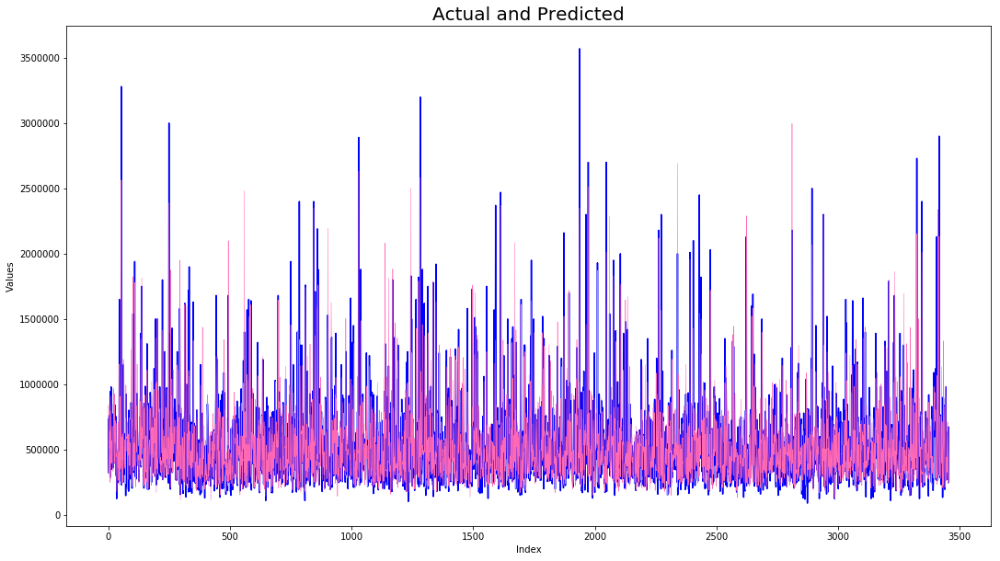

In [59]:
from sklearn.ensemble import BaggingRegressor

clf= BaggingRegressor(random_state=10)
pipe_BAG_1=Pipeline([('BAG1',clf)])
result_dff=pd.concat([result_dff,result('BAG1',pipe_BAG_1,X_train,y_train,X_val,y_val)])
result_dff

In [60]:
#Feature Importance
feature_importances = np.mean([ tree.feature_importances_ for tree in clf.estimators_], axis=0)
bg_imp_feature=pd.DataFrame(feature_importances, columns = ["Imp"],index=X_train.columns)
bg_imp_feature.sort_values(by="Imp",ascending=False)

,Imp
furnished_1,0.32952
living_measure,0.21044
lat,0.17412
long,0.06964
living_measure15,0.03440
yr_built,0.03000
coast_1,0.02448
ceil_measure,0.01991
zipcode,0.01548
sight,0.01531


,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158
0,Ridge_Reg_2,0.71767,180805.99847,32690809082.18658,117107.34765,0.72770,181882.56950,33081269088.65812,116939.62012
0,Lasso_Reg_1,0.71779,180767.09977,32676744360.84573,117084.23084,0.72769,181885.74852,33082425513.47692,116934.69034
0,KNN Reg,0.49520,241764.35295,58450002356.08145,151384.98932,0.99935,8894.71112,79115885.95018,727.31898
0,DT1,0.73194,176176.01494,31037988240.89530,98457.42069,0.99935,8894.71112,79115885.95018,727.31898
0,RF1,0.86124,126756.92547,16067318155.28575,72879.33149,0.97466,55482.79772,3078340842.83595,29823.87866
0,RF2,0.84822,132566.13475,17573780083.03317,73418.66929,0.90321,108435.52475,11758263028.16183,58027.92388
0,GB1,0.87310,121214.62351,14692984951.50343,75637.11090,0.89488,113007.60730,12770719307.93105,72392.61443
0,GB2,0.89502,110253.77869,12155895714.51771,65759.78139,0.95298,75577.21752,5711915808.16859,52291.11107


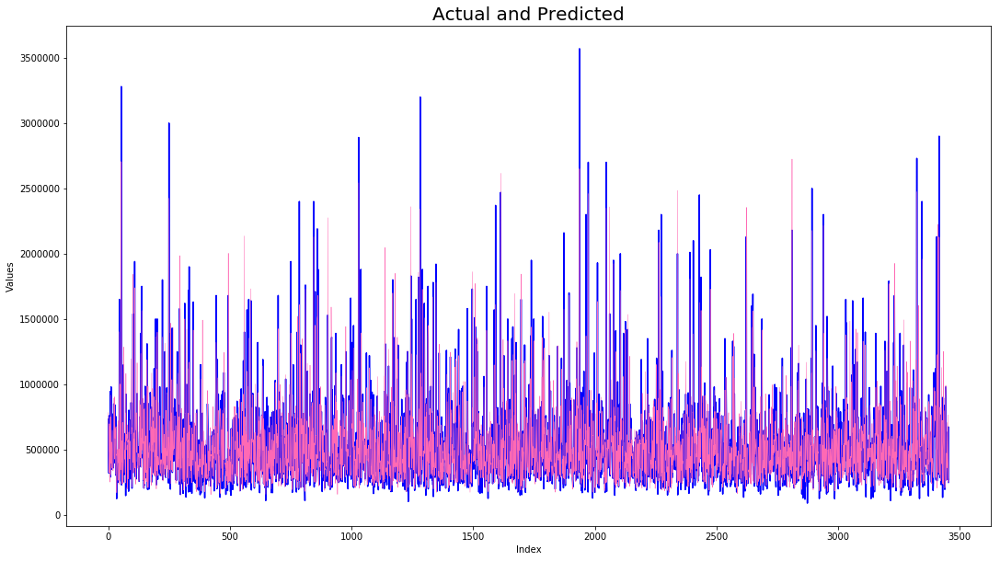

In [61]:
clf= BaggingRegressor(DecisionTreeRegressor(max_depth=12),n_estimators=250,random_state=11)
pipe_BAG_2=Pipeline([('BAG2',clf)])
result_dff=pd.concat([result_dff,result('BAG2',pipe_BAG_2,X_train,y_train,X_val,y_val)])
result_dff

In [62]:
#Feature Importance
pd.options.display.float_format = '{:.5f}'.format
feature_importances = np.mean([ tree.feature_importances_ for tree in clf.estimators_], axis=0)
bg_imp_feature=pd.DataFrame(feature_importances, columns = ["Imp"],index=X_train.columns)
bg_imp_feature.sort_values(by="Imp",ascending=False)

,Imp
furnished_1,0.31748
living_measure,0.23735
lat,0.17613
long,0.06834
living_measure15,0.02947
coast_1,0.02891
yr_built,0.02585
ceil_measure,0.01984
sight,0.01504
zipcode,0.01456


##### Dataset-2 model performance Summary
We have used Linear Regression, Ridge and Lasso, KNN, Ensemble Techniques - Decision Trees, Random Forest, Bagging, AdaBoost,
Gradient Boost and XGBoost - its gradient boost with regularization and its faster. R2 score on validation in range 70%-87% with RMSE in range 76000-107000. The model is showing better results.Lets hypertune to see if results could be improved further. Will use Random Forest, Gradient Boosting, XGBoost and AdaBoost hypertuning.
Dropping features which are zero or very close to zero in all above 4 algos - quality_12, quality_3, quality_4.

Kindly refer Excel sheet to compare the results.

In [ ]:
#Dropping features
X_train_ht=X_train.drop(['quality_5', 'quality_3', 'quality_4'],1)
X_test_ht=X_test.drop(['quality_5', 'quality_3', 'quality_4'],1)
X_val_ht=X_val.drop(['quality_5', 'quality_3', 'quality_4'],1)

In [ ]:
skf = KFold(n_splits=5, random_state=12)

### RANDOM FOREST HYPERTUNE

In [65]:
#Tuning of Random Forest
RF_ht = RandomForestRegressor()

params = {"n_estimators": np.arange(76,84,1),"max_depth": np.arange(16,20,1),
          "max_features":np.arange(6,9,1),'min_samples_leaf': range(5, 8, 1),
    'min_samples_split': range(18, 20, 1)}

RF_GV_1 = GridSearchCV(estimator = RF_ht, param_grid = params,cv=skf,verbose=1,return_train_score=True,n_jobs=2)
RF_GV_1.fit(X_train_ht,y_train) 

Fitting 5 folds for each of 576 candidates, totalling 2880 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:   35.0s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:  2.3min
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:  5.3min
[Parallel(n_jobs=2)]: Done 796 tasks      | elapsed: 10.0min
[Parallel(n_jobs=2)]: Done 1246 tasks      | elapsed: 15.5min
[Parallel(n_jobs=2)]: Done 1796 tasks      | elapsed: 22.5min
[Parallel(n_jobs=2)]: Done 2446 tasks      | elapsed: 30.7min
[Parallel(n_jobs=2)]: Done 2880 out of 2880 | elapsed: 36.6min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=12, shuffle=False),
       error_score='raise-deprecating',
       estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=2,
       param_grid={'n_estimators': array([76, 77, 78, 79, 80, 81, 82, 83]), 'max_depth': array([16, 17, 18, 19]), 'max_features': array([6, 7, 8]), 'min_samples_leaf': range(5, 8), 'min_samples_split': range(18, 20)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring=None, verbose=1)

In [66]:
# results of grid search CV
RF_results = pd.DataFrame(RF_GV_1.cv_results_)

#parameters best value
best_score_rf = RF_GV_1.best_score_
best_rf = RF_GV_1.best_params_
best_rf

{'max_depth': 18,
 'max_features': 8,
 'min_samples_leaf': 5,
 'min_samples_split': 18,
 'n_estimators': 81}

,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158
0,Ridge_Reg_2,0.71767,180805.99847,32690809082.18658,117107.34765,0.72770,181882.56950,33081269088.65812,116939.62012
0,Lasso_Reg_1,0.71779,180767.09977,32676744360.84573,117084.23084,0.72769,181885.74852,33082425513.47692,116934.69034
0,KNN Reg,0.49520,241764.35295,58450002356.08145,151384.98932,0.99935,8894.71112,79115885.95018,727.31898
0,DT1,0.73194,176176.01494,31037988240.89530,98457.42069,0.99935,8894.71112,79115885.95018,727.31898
0,RF1,0.86124,126756.92547,16067318155.28575,72879.33149,0.97466,55482.79772,3078340842.83595,29823.87866
0,RF2,0.84822,132566.13475,17573780083.03317,73418.66929,0.90321,108435.52475,11758263028.16183,58027.92388
0,GB1,0.87310,121214.62351,14692984951.50343,75637.11090,0.89488,113007.60730,12770719307.93105,72392.61443
0,GB2,0.89502,110253.77869,12155895714.51771,65759.78139,0.95298,75577.21752,5711915808.16859,52291.11107


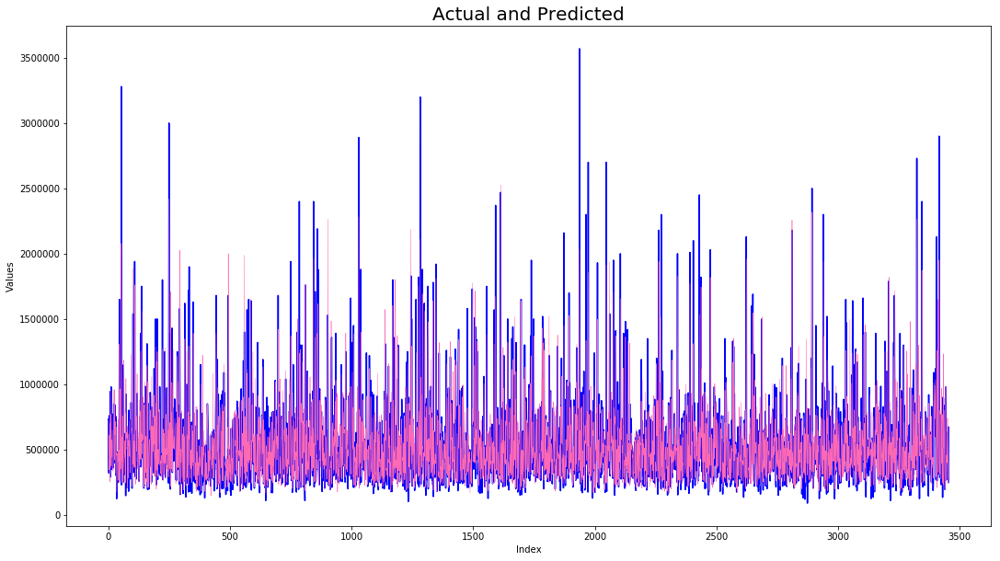

In [67]:
rf_best = RandomForestRegressor(max_depth= 18, max_features= 8,n_estimators=80,min_samples_leaf=5,min_samples_split=18,
                                random_state=14)

result_dff=pd.concat([result_dff,result('RF_ht',rf_best,X_train_ht,y_train,X_val_ht,y_val)])
result_dff

                     Imp
living_measure   0.20762
furnished_1      0.16841
lat              0.15958
living_measure15 0.08067
ceil_measure     0.07752
long             0.05371
room_bath        0.04081
yr_built         0.03216
sight            0.02628
zipcode          0.02266
quality_9        0.02174
coast_1          0.01627
basement         0.01216
quality_8        0.01187
total_area       0.01125
lot_measure15    0.01110
quality_11       0.00995
lot_measure      0.00946
quality_10       0.00673
quality_7        0.00643
condition        0.00437
quality_12       0.00272
quality_6        0.00216
room_bed         0.00135
yr_renovated     0.00130
ceil             0.00118
quality_13       0.00057

First 8 feature importance:	 Imp   82.04737
dtype: float64

First 12 feature importance:	 Imp   90.74157
dtype: float64


<Figure size 720x720 with 0 Axes>

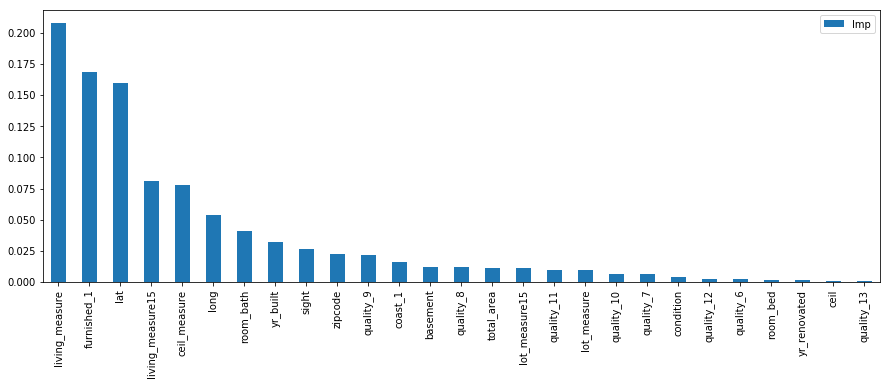

In [68]:
#Feature importance
feat_imp(rf_best,X_train_ht)

### GRADIENT BOOST HYPERTUNE

In [69]:
GB_ht=GradientBoostingRegressor()
params = {"n_estimators": [138,142,1],"learning_rate":[0.08,0.09],"max_depth": np.arange(8, 11,1),
          "max_features":np.arange(5,8,1),'min_samples_leaf': range(16, 21, 1)}
GB_GV_1 = GridSearchCV(estimator = GB_ht, param_grid = params,cv=skf,verbose=1,return_train_score=True,n_jobs=2)
GB_GV_1.fit(X_train_ht,y_train) 

# results of grid search CV
GB_results = pd.DataFrame(GB_GV_1.cv_results_)
#parameters best value
best_score_rf = GB_GV_1.best_score_
best_gb = GB_GV_1.best_params_
best_gb

Fitting 5 folds for each of 270 candidates, totalling 1350 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:   20.2s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:  1.5min
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:  3.9min
[Parallel(n_jobs=2)]: Done 796 tasks      | elapsed:  7.1min
[Parallel(n_jobs=2)]: Done 1246 tasks      | elapsed: 11.2min
[Parallel(n_jobs=2)]: Done 1350 out of 1350 | elapsed: 12.4min finished


{'learning_rate': 0.09,
 'max_depth': 8,
 'max_features': 7,
 'min_samples_leaf': 17,
 'n_estimators': 142}

,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158
0,Ridge_Reg_2,0.71767,180805.99847,32690809082.18658,117107.34765,0.72770,181882.56950,33081269088.65812,116939.62012
0,Lasso_Reg_1,0.71779,180767.09977,32676744360.84573,117084.23084,0.72769,181885.74852,33082425513.47692,116934.69034
0,KNN Reg,0.49520,241764.35295,58450002356.08145,151384.98932,0.99935,8894.71112,79115885.95018,727.31898
0,DT1,0.73194,176176.01494,31037988240.89530,98457.42069,0.99935,8894.71112,79115885.95018,727.31898
0,RF1,0.86124,126756.92547,16067318155.28575,72879.33149,0.97466,55482.79772,3078340842.83595,29823.87866
0,RF2,0.84822,132566.13475,17573780083.03317,73418.66929,0.90321,108435.52475,11758263028.16183,58027.92388
0,GB1,0.87310,121214.62351,14692984951.50343,75637.11090,0.89488,113007.60730,12770719307.93105,72392.61443
0,GB2,0.89502,110253.77869,12155895714.51771,65759.78139,0.95298,75577.21752,5711915808.16859,52291.11107


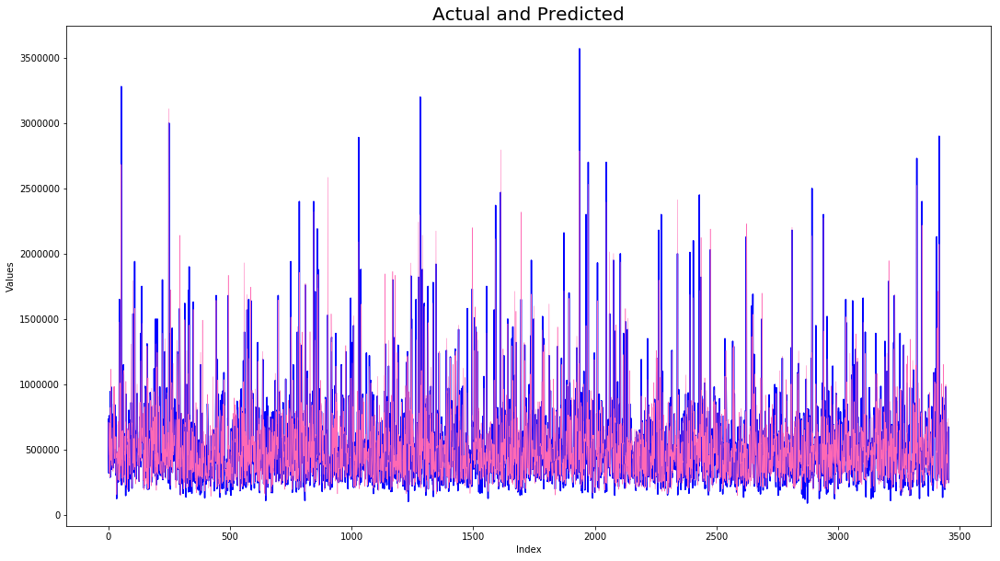

In [70]:
gb_best = GradientBoostingRegressor(learning_rate= 0.09, n_estimators= 150,max_depth= 10, 
                                           max_features= 7,min_samples_leaf=19)

result_dff=pd.concat([result_dff,result('GB_ht',gb_best,X_train_ht,y_train,X_val_ht,y_val)])
result_dff

                     Imp
living_measure   0.21739
lat              0.15607
furnished_1      0.13874
living_measure15 0.10908
long             0.06063
ceil_measure     0.05424
room_bath        0.04955
sight            0.03128
yr_built         0.02943
coast_1          0.02644
zipcode          0.02530
lot_measure15    0.01702
quality_9        0.01336
total_area       0.01053
lot_measure      0.01020
basement         0.00833
condition        0.00829
quality_7        0.00649
quality_12       0.00592
quality_8        0.00494
quality_11       0.00487
quality_10       0.00320
quality_6        0.00318
room_bed         0.00243
yr_renovated     0.00185
ceil             0.00125
quality_13       0.00000

First 8 feature importance:	 Imp   81.69770
dtype: float64

First 12 feature importance:	 Imp   91.51647
dtype: float64


<Figure size 720x720 with 0 Axes>

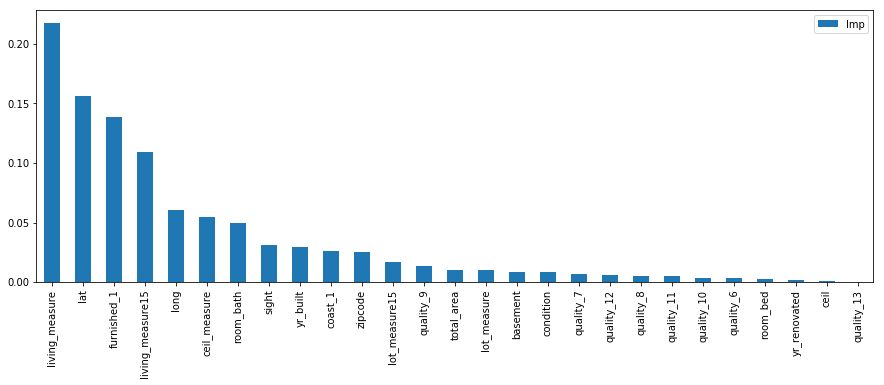

In [71]:
#Feature importance
feat_imp(gb_best,X_train_ht)

### ADABOOST HYPERTUNE

In [72]:
ADAB_ht=AdaBoostRegressor(DecisionTreeRegressor(max_depth=28))
params = {"n_estimators": [176,182,1],"learning_rate":[0.4,0.5,0.6],'loss':['linear','square']}
ADAB_GV_1 = GridSearchCV(estimator = ADAB_ht, param_grid = params,cv=skf,verbose=1,return_train_score=True,n_jobs=2)
ADAB_GV_1.fit(X_train_ht,y_train) 


Fitting 5 folds for each of 18 candidates, totalling 90 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  3.9min
[Parallel(n_jobs=2)]: Done  90 out of  90 | elapsed:  7.5min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=12, shuffle=False),
       error_score='raise-deprecating',
       estimator=AdaBoostRegressor(base_estimator=DecisionTreeRegressor(criterion='mse', max_depth=28, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best'),
         learning_rate=1.0, loss='linear', n_estimators=50,
         random_state=None),
       fit_params=None, iid='warn', n_jobs=2,
       param_grid={'n_estimators': [176, 182, 1], 'learning_rate': [0.4, 0.5, 0.6], 'loss': ['linear', 'square']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring=None, verbose=1)

In [73]:
# results of grid search CV
ADAB_results = pd.DataFrame(ADAB_GV_1.cv_results_)
#parameters best value
best_score_rf = ADAB_GV_1.best_score_
best_adab = ADAB_GV_1.best_params_
best_adab

{'learning_rate': 0.5, 'loss': 'linear', 'n_estimators': 176}

,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158
0,Ridge_Reg_2,0.71767,180805.99847,32690809082.18658,117107.34765,0.72770,181882.56950,33081269088.65812,116939.62012
0,Lasso_Reg_1,0.71779,180767.09977,32676744360.84573,117084.23084,0.72769,181885.74852,33082425513.47692,116934.69034
0,KNN Reg,0.49520,241764.35295,58450002356.08145,151384.98932,0.99935,8894.71112,79115885.95018,727.31898
0,DT1,0.73194,176176.01494,31037988240.89530,98457.42069,0.99935,8894.71112,79115885.95018,727.31898
0,RF1,0.86124,126756.92547,16067318155.28575,72879.33149,0.97466,55482.79772,3078340842.83595,29823.87866
0,RF2,0.84822,132566.13475,17573780083.03317,73418.66929,0.90321,108435.52475,11758263028.16183,58027.92388
0,GB1,0.87310,121214.62351,14692984951.50343,75637.11090,0.89488,113007.60730,12770719307.93105,72392.61443
0,GB2,0.89502,110253.77869,12155895714.51771,65759.78139,0.95298,75577.21752,5711915808.16859,52291.11107


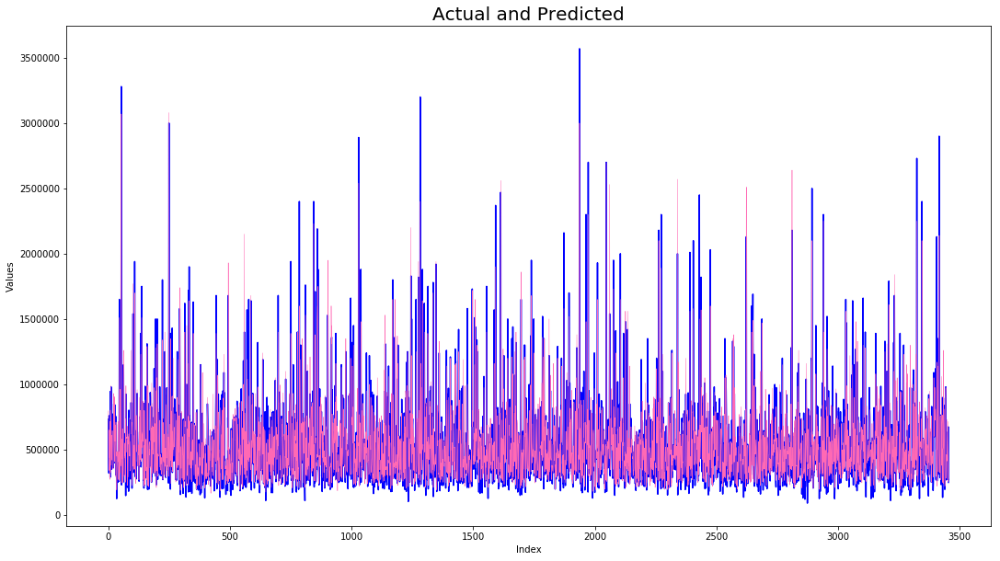

In [74]:
adab_best = AdaBoostRegressor(DecisionTreeRegressor(max_depth=28),n_estimators=180,learning_rate=0.5,loss='linear',
                              random_state=15)

result_dff=pd.concat([result_dff,result('ADAB_ht',adab_best,X_train_ht,y_train,X_val_ht,y_val)])
result_dff

                     Imp
living_measure   0.48898
furnished_1      0.10561
lat              0.09726
long             0.05701
coast_1          0.03784
living_measure15 0.03747
sight            0.02427
ceil_measure     0.02000
yr_built         0.01993
lot_measure15    0.01562
zipcode          0.01534
room_bath        0.01240
total_area       0.01094
lot_measure      0.00964
basement         0.00810
quality_9        0.00798
quality_11       0.00571
quality_12       0.00445
room_bed         0.00382
yr_renovated     0.00322
condition        0.00291
quality_10       0.00286
ceil             0.00268
quality_8        0.00253
quality_13       0.00252
quality_7        0.00073
quality_6        0.00017

First 8 feature importance:	 Imp   86.84492
dtype: float64

First 12 feature importance:	 Imp   93.17415
dtype: float64


<Figure size 720x720 with 0 Axes>

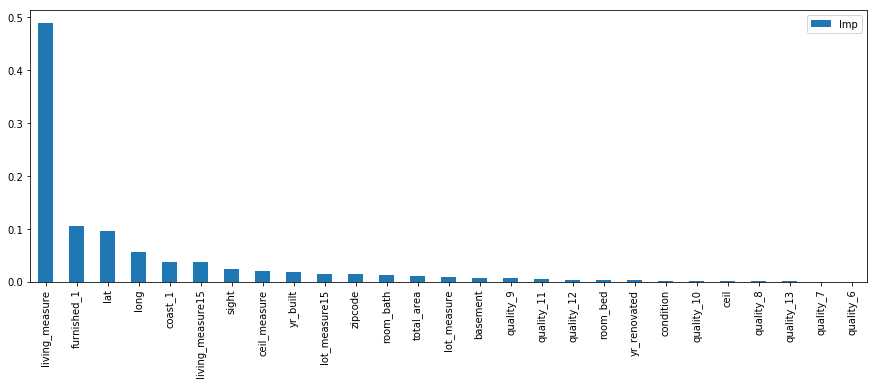

In [75]:
#Feature importance
feat_imp(adab_best,X_train_ht)

### XGBoost Regressor

In [76]:
#Regularization using GridSearchCV - 1st Iteration
XGB_ht_1=XGBRegressor(objective='reg:squarederror')
params1 = {
    "colsample_bytree": [i/100.0 for i in range(66,74,2)],
    "learning_rate": [0.2,0.22,0.24], 
    "n_estimators": [185,188,1],
    "subsample": [i/100.0 for i in range(62,68,1)]
}
XGB_GV_1 = GridSearchCV(estimator = XGB_ht_1, param_grid = params1, 
                        cv=skf,
                        verbose = 1,
                       return_train_score=True,n_jobs=2) 
XGB_GV_1.fit(X_train_ht,y_train) 

Fitting 5 folds for each of 216 candidates, totalling 1080 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:   27.5s
[Parallel(n_jobs=2)]: Done 257 tasks      | elapsed:  1.8min
[Parallel(n_jobs=2)]: Done 617 tasks      | elapsed:  4.3min
[Parallel(n_jobs=2)]: Done 1077 out of 1080 | elapsed:  7.5min remaining:    1.2s
[Parallel(n_jobs=2)]: Done 1080 out of 1080 | elapsed:  7.5min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=12, shuffle=False),
       error_score='raise-deprecating',
       estimator=XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0,
       importance_type='gain', learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=None, objective='reg:squarederror',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=None, subsample=1, verbosity=1),
       fit_params=None, iid='warn', n_jobs=2,
       param_grid={'colsample_bytree': [0.66, 0.68, 0.7, 0.72], 'learning_rate': [0.2, 0.22, 0.24], 'n_estimators': [185, 188, 1], 'subsample': [0.62, 0.63, 0.64, 0.65, 0.66, 0.67]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring=None, verbose=1)

In [77]:
# results of grid search CV
XGB_results_1 = pd.DataFrame(XGB_GV_1.cv_results_)
#parameters best value
best_score_xgb_1 = XGB_GV_1.best_score_
best_xgb_1 = XGB_GV_1.best_params_
best_xgb_1

{'colsample_bytree': 0.68,
 'learning_rate': 0.2,
 'n_estimators': 185,
 'subsample': 0.67}

,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158
0,Ridge_Reg_2,0.71767,180805.99847,32690809082.18658,117107.34765,0.72770,181882.56950,33081269088.65812,116939.62012
0,Lasso_Reg_1,0.71779,180767.09977,32676744360.84573,117084.23084,0.72769,181885.74852,33082425513.47692,116934.69034
0,KNN Reg,0.49520,241764.35295,58450002356.08145,151384.98932,0.99935,8894.71112,79115885.95018,727.31898
0,DT1,0.73194,176176.01494,31037988240.89530,98457.42069,0.99935,8894.71112,79115885.95018,727.31898
0,RF1,0.86124,126756.92547,16067318155.28575,72879.33149,0.97466,55482.79772,3078340842.83595,29823.87866
0,RF2,0.84822,132566.13475,17573780083.03317,73418.66929,0.90321,108435.52475,11758263028.16183,58027.92388
0,GB1,0.87310,121214.62351,14692984951.50343,75637.11090,0.89488,113007.60730,12770719307.93105,72392.61443
0,GB2,0.89502,110253.77869,12155895714.51771,65759.78139,0.95298,75577.21752,5711915808.16859,52291.11107


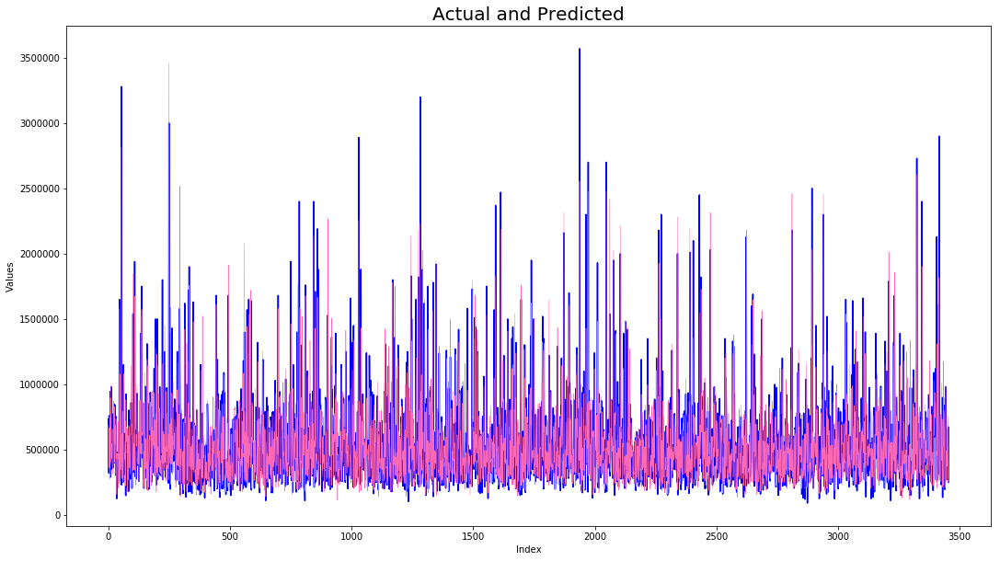

In [78]:
#Choosing best parameter from 1st Iteration
xgb_best_1 = XGBRegressor(colsample_bytree=0.7,learning_rate=0.22,n_estimators=186,subsample=0.65,objective='reg:squarederror',
                         random_state=16)

result_dff=pd.concat([result_dff,result('xgb_1_ht',xgb_best_1,X_train_ht,y_train,X_val_ht,y_val)])
result_dff

                     Imp
furnished_1      0.45991
living_measure   0.08495
quality_9        0.07530
lat              0.05495
sight            0.04581
coast_1          0.04306
quality_8        0.02980
long             0.02709
quality_12       0.02143
living_measure15 0.01880
quality_6        0.01387
quality_11       0.01343
quality_13       0.01221
zipcode          0.01197
room_bath        0.01166
yr_built         0.01035
condition        0.01023
quality_10       0.00940
ceil_measure     0.00728
lot_measure15    0.00666
basement         0.00661
total_area       0.00550
ceil             0.00534
yr_renovated     0.00469
lot_measure      0.00348
room_bed         0.00313
quality_7        0.00312

First 8 feature importance:	 Imp   82.08646
dtype: float32

First 12 feature importance:	 Imp   88.83791
dtype: float32


<Figure size 720x720 with 0 Axes>

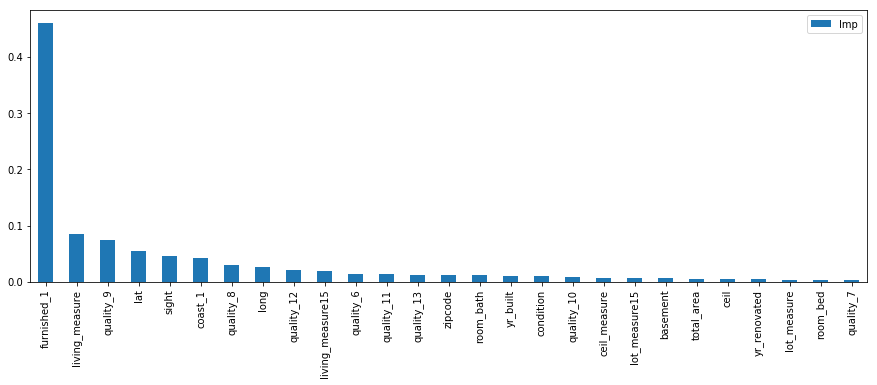

In [79]:
#Feature importance
feat_imp(xgb_best_1,X_train_ht)

In [80]:
#Regularization using GridSearchCV - 2nd Iteration

params2 = {
    'min_child_weight':[6,7,8,9,10],"max_depth": [3,4,5],
}

xgb_best_2 = GridSearchCV(estimator = xgb_best_1, param_grid = params2, 
                        cv=skf,
                        verbose = 1,
                       return_train_score=True,n_jobs=2) 

xgb_best_2.fit(X_train_ht, y_train) 

# results of grid search CV
XGB_results_2 = pd.DataFrame(xgb_best_2.cv_results_)
XGB_results_2

#parameters best value
best_score_xgb_2 = xgb_best_2.best_score_
best_xgb_2 = xgb_best_2.best_params_
best_xgb_2

Fitting 5 folds for each of 15 candidates, totalling 75 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:   31.6s
[Parallel(n_jobs=2)]: Done  75 out of  75 | elapsed:   59.3s finished


{'max_depth': 5, 'min_child_weight': 7}

,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158
0,Ridge_Reg_2,0.71767,180805.99847,32690809082.18658,117107.34765,0.72770,181882.56950,33081269088.65812,116939.62012
0,Lasso_Reg_1,0.71779,180767.09977,32676744360.84573,117084.23084,0.72769,181885.74852,33082425513.47692,116934.69034
0,KNN Reg,0.49520,241764.35295,58450002356.08145,151384.98932,0.99935,8894.71112,79115885.95018,727.31898
0,DT1,0.73194,176176.01494,31037988240.89530,98457.42069,0.99935,8894.71112,79115885.95018,727.31898
0,RF1,0.86124,126756.92547,16067318155.28575,72879.33149,0.97466,55482.79772,3078340842.83595,29823.87866
0,RF2,0.84822,132566.13475,17573780083.03317,73418.66929,0.90321,108435.52475,11758263028.16183,58027.92388
0,GB1,0.87310,121214.62351,14692984951.50343,75637.11090,0.89488,113007.60730,12770719307.93105,72392.61443
0,GB2,0.89502,110253.77869,12155895714.51771,65759.78139,0.95298,75577.21752,5711915808.16859,52291.11107


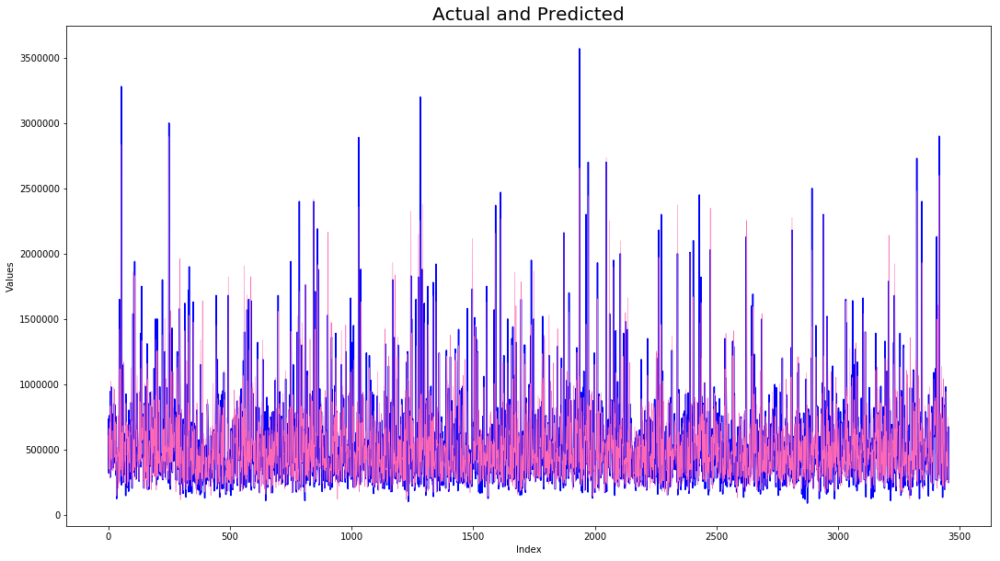

In [81]:
#Choosing best parameter from 2nd Iteration
xgb_best_2 = XGBRegressor(colsample_bytree=0.7,learning_rate=0.22,n_estimators=186,subsample=0.65,objective='reg:squarederror',
                         random_state=17,max_depth=4,min_child_weight=8)
result_dff=pd.concat([result_dff,result('xgb_2_ht',xgb_best_2,X_train_ht,y_train,X_val_ht,y_val)])
result_dff

                     Imp
furnished_1      0.46173
quality_9        0.08325
living_measure   0.07545
coast_1          0.06976
lat              0.04473
sight            0.02880
room_bath        0.02802
quality_8        0.02780
long             0.02034
quality_10       0.01916
quality_7        0.01823
yr_built         0.01647
living_measure15 0.01506
quality_12       0.01277
zipcode          0.01129
quality_11       0.01026
quality_13       0.00990
lot_measure15    0.00685
condition        0.00637
ceil_measure     0.00625
lot_measure      0.00535
room_bed         0.00455
total_area       0.00408
ceil             0.00406
basement         0.00383
yr_renovated     0.00322
quality_6        0.00243

First 8 feature importance:	 Imp   81.95339
dtype: float32

First 12 feature importance:	 Imp   89.37298
dtype: float32


<Figure size 720x720 with 0 Axes>

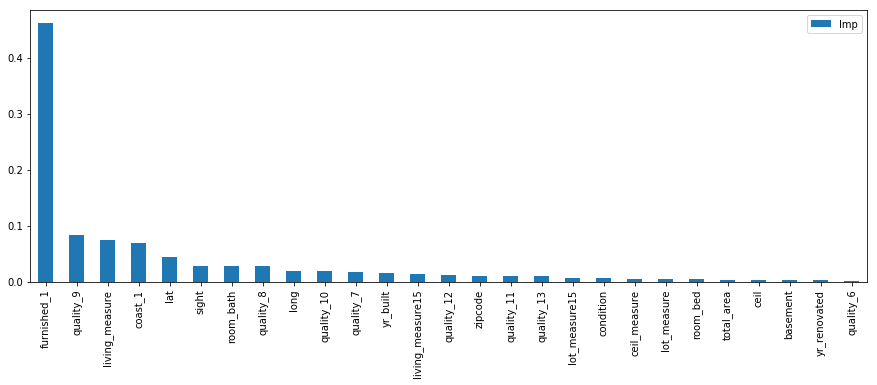

In [82]:
#Feature importance
feat_imp(xgb_best_2,X_train_ht)

In [83]:
#Regularization using GridSearchCV - 3rd Iteration

params3 = {
    'gamma':[i/1.0 for i in range(50,55,1)]
}

xgb_best_3 = GridSearchCV(estimator = xgb_best_2, param_grid = params3, 
                        cv=skf,
                        verbose = 1,
                       return_train_score=True) 

xgb_best_3.fit(X_train_ht, y_train) 

# results of grid search CV
XGB_results_3 = pd.DataFrame(xgb_best_3.cv_results_)
XGB_results_3

#parameters best value
best_score_xgb_3 = xgb_best_3.best_score_
best_xgb_3 = xgb_best_3.best_params_
best_xgb_3

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:   39.0s finished


{'gamma': 50.0}

,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158
0,Ridge_Reg_2,0.71767,180805.99847,32690809082.18658,117107.34765,0.72770,181882.56950,33081269088.65812,116939.62012
0,Lasso_Reg_1,0.71779,180767.09977,32676744360.84573,117084.23084,0.72769,181885.74852,33082425513.47692,116934.69034
0,KNN Reg,0.49520,241764.35295,58450002356.08145,151384.98932,0.99935,8894.71112,79115885.95018,727.31898
0,DT1,0.73194,176176.01494,31037988240.89530,98457.42069,0.99935,8894.71112,79115885.95018,727.31898
0,RF1,0.86124,126756.92547,16067318155.28575,72879.33149,0.97466,55482.79772,3078340842.83595,29823.87866
0,RF2,0.84822,132566.13475,17573780083.03317,73418.66929,0.90321,108435.52475,11758263028.16183,58027.92388
0,GB1,0.87310,121214.62351,14692984951.50343,75637.11090,0.89488,113007.60730,12770719307.93105,72392.61443
0,GB2,0.89502,110253.77869,12155895714.51771,65759.78139,0.95298,75577.21752,5711915808.16859,52291.11107


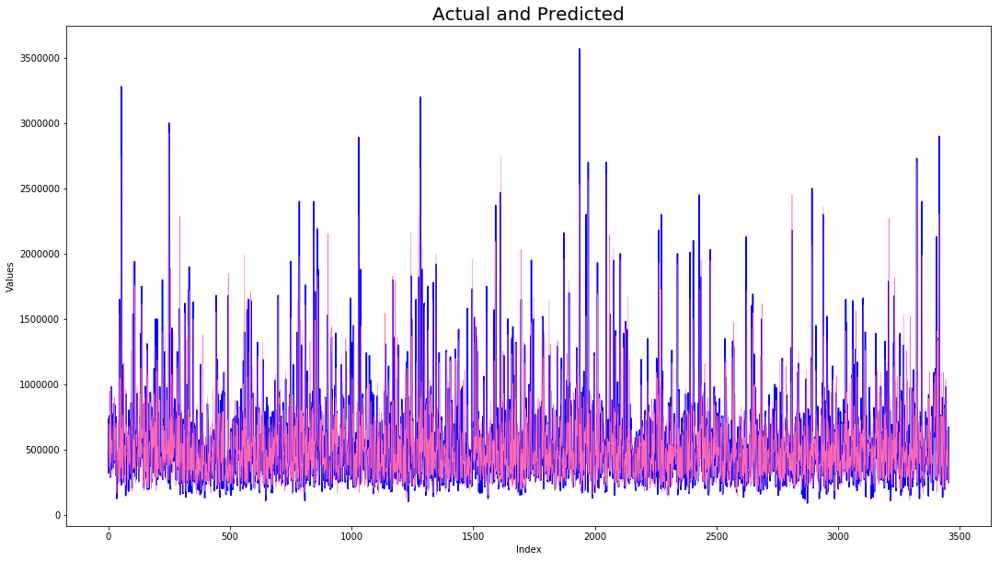

In [84]:
#Choosing best parameter from 3rd Iteration
xgb_best_3 = XGBRegressor(colsample_bytree=0.7,learning_rate=0.22,n_estimators=186,subsample=0.65,objective='reg:squarederror',
                         random_state=18,max_depth=4,min_child_weight=8,reg_lambda=52)
result_dff=pd.concat([result_dff,result('xgb_3_ht',xgb_best_3,X_train_ht,y_train,X_val_ht,y_val)])
result_dff

                     Imp
furnished_1      0.55026
living_measure   0.11252
coast_1          0.04955
sight            0.04906
lat              0.04026
quality_8        0.03380
long             0.01515
quality_6        0.01480
quality_11       0.01418
quality_12       0.01409
living_measure15 0.01227
quality_9        0.00959
zipcode          0.00910
condition        0.00887
quality_10       0.00752
ceil_measure     0.00718
yr_built         0.00665
total_area       0.00638
yr_renovated     0.00607
quality_13       0.00578
room_bath        0.00527
room_bed         0.00497
ceil             0.00429
lot_measure      0.00399
basement         0.00379
lot_measure15    0.00335
quality_7        0.00128

First 8 feature importance:	 Imp   86.54022
dtype: float32

First 12 feature importance:	 Imp   91.55212
dtype: float32


<Figure size 720x720 with 0 Axes>

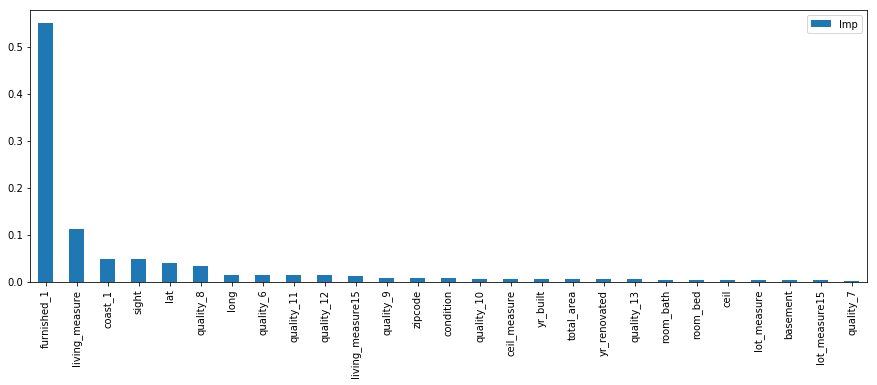

In [85]:
#Feature importance
feat_imp(xgb_best_3,X_train_ht)

We have executed many models and post comparing results we hyper tuned four models. All models are working well with R2 score greater than 86% RMSE is below 132600.

But best of of all is Xtreme Gradient boost - which is enhanced version of gradient boost. It includes regularisation and is faster too. Its giving R2 score of around 89.5% with RMSE of around 109000. 

Moving forward this model can be improved further as dont have much data for very high priced houses. 
So when more data comes in we can revisit our model and make mecessary changes to accommodate more variation in data to deliver better results, maybe try to decrease RMSE.

Finally lets run our model on test data, which we havent used till now and see how it performs.

#### Executing xgb_3_ht on test data set

,Method,val score,RMSE_val,MSE_val,MAE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr
0,Linear Reg,0.71763,180818.45737,32695314526.97058,117107.93415,0.72770,181882.36852,33081195977.82660,116936.92426
0,Ridge_Reg_1,0.71810,180667.04663,32640581737.12561,117098.44994,0.72763,181906.28901,33089897982.93209,116967.24158
0,Ridge_Reg_2,0.71767,180805.99847,32690809082.18658,117107.34765,0.72770,181882.56950,33081269088.65812,116939.62012
0,Lasso_Reg_1,0.71779,180767.09977,32676744360.84573,117084.23084,0.72769,181885.74852,33082425513.47692,116934.69034
0,KNN Reg,0.49520,241764.35295,58450002356.08145,151384.98932,0.99935,8894.71112,79115885.95018,727.31898
0,DT1,0.73194,176176.01494,31037988240.89530,98457.42069,0.99935,8894.71112,79115885.95018,727.31898
0,RF1,0.86124,126756.92547,16067318155.28575,72879.33149,0.97466,55482.79772,3078340842.83595,29823.87866
0,RF2,0.84822,132566.13475,17573780083.03317,73418.66929,0.90321,108435.52475,11758263028.16183,58027.92388
0,GB1,0.87310,121214.62351,14692984951.50343,75637.11090,0.89488,113007.60730,12770719307.93105,72392.61443
0,GB2,0.89502,110253.77869,12155895714.51771,65759.78139,0.95298,75577.21752,5711915808.16859,52291.11107


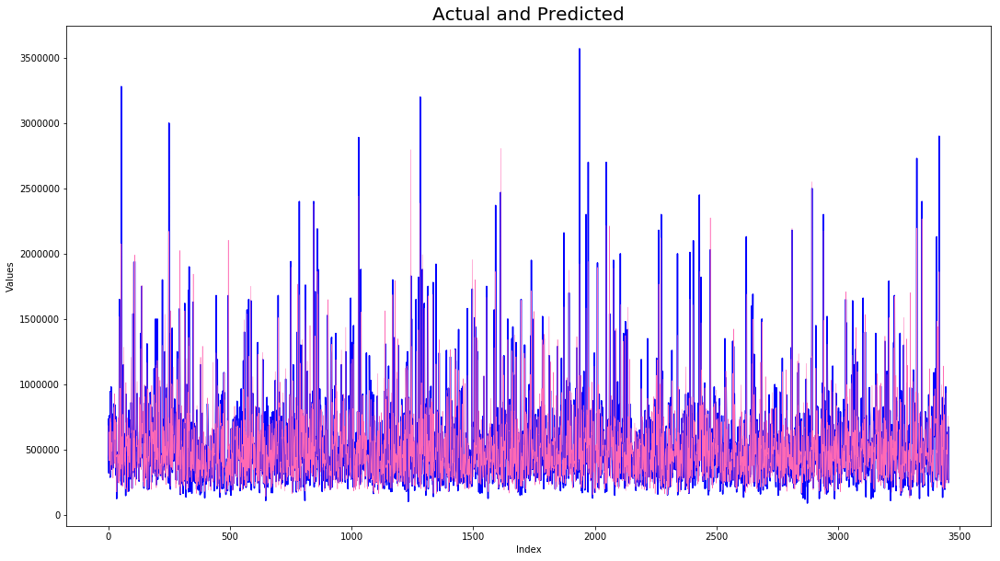

In [86]:
result_dff=pd.concat([result_dff,result('xgb_test',xgb_best_3,X_test_ht,y_test,X_val_ht,y_val)])
result_dff

                     Imp
furnished_1      0.53507
living_measure   0.13423
sight            0.05095
coast_1          0.03399
lat              0.03394
quality_9        0.02366
quality_8        0.02151
long             0.01854
quality_7        0.01645
ceil_measure     0.01541
room_bath        0.01410
living_measure15 0.01192
condition        0.01068
yr_renovated     0.00998
yr_built         0.00925
quality_11       0.00810
zipcode          0.00625
lot_measure15    0.00602
total_area       0.00579
quality_6        0.00567
basement         0.00538
quality_12       0.00534
quality_10       0.00493
lot_measure      0.00478
ceil             0.00428
room_bed         0.00379
quality_13       0.00000

First 8 feature importance:	 Imp   85.18983
dtype: float32

First 12 feature importance:	 Imp   90.97836
dtype: float32


<Figure size 720x720 with 0 Axes>

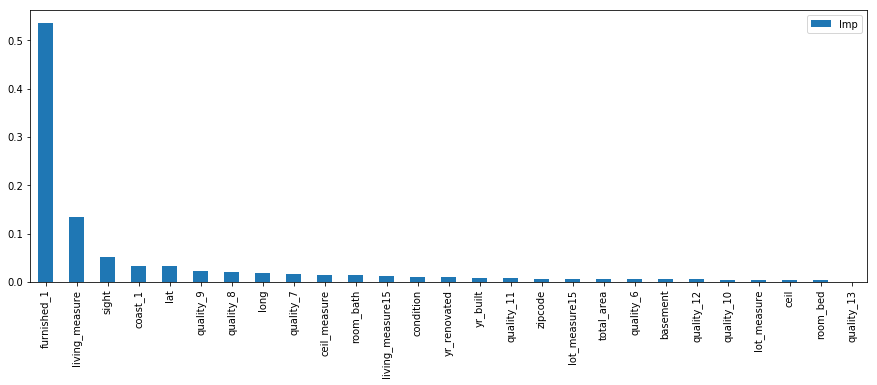

In [87]:
#Feature importance
feat_imp(xgb_best_3,X_test_ht)

### CALCULATING CONFIDENCE INTERVAL ON THE FINAL SELECTED MODEL at 95% ALPHA

In [88]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

num_folds = 200
seed = 7

kfold = KFold(n_splits=num_folds, random_state=seed)
results = cross_val_score(xgb_best_3, X_test_ht, y_test, cv=kfold)
print(results)
print("Accuracy: %.3f%% (%.3f%%)" % (results.mean()*100.0, results.std()*100.0))

[ 0.90391651  0.90916102  0.90837406  0.92102958  0.84137223  0.85154394
  0.79054082  0.97225657  0.62255882  0.95655541  0.87971233  0.54938847
  0.919873    0.90449203  0.91960521  0.82845636  0.85087562  0.84624357
  0.84949297  0.79902964  0.88093633  0.7965441   0.85767605  0.89117899
  0.87695964  0.81590065  0.77554087  0.82172976  0.89524705  0.60028268
  0.91819488  0.7676954   0.92467382  0.76400042 -0.01087648  0.94301005
  0.7988163   0.8973989   0.80375734  0.87449297  0.95865757  0.9275524
  0.9097657   0.91836083  0.92456681  0.96787804  0.8355066   0.97563326
  0.90399211  0.89793941  0.85086961  0.89391916  0.59636222  0.94398635
  0.53656514  0.87802398  0.86956142  0.86946016  0.82775075  0.90893744
  0.92036889  0.92163685  0.81946895  0.9143283   0.81252437  0.92824432
  0.75878566  0.81404196  0.87121462  0.73438774  0.80718153  0.88708332
  0.91354842  0.52667519  0.94112667  0.93731003  0.94483886  0.97033654
  0.76244928  0.93123175  0.77286008  0.87546557  0.

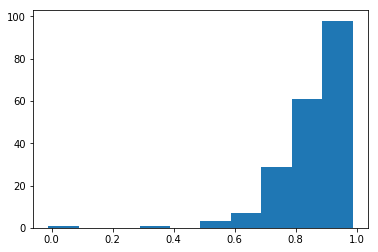

95.0 confidence interval 59.5% and 97.2%
Average accuracy result on test data is 85.137%:


In [89]:
from matplotlib import pyplot
# plot scores
pyplot.hist(results)
pyplot.show()
# confidence intervals
alpha = 0.95                     # for 95% confidence 
p = ((1.0-alpha)/2.0) * 100      # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(results, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(results, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))
print('Average accuracy result on test data is %.3f%%:' % (np.mean(results)*100))

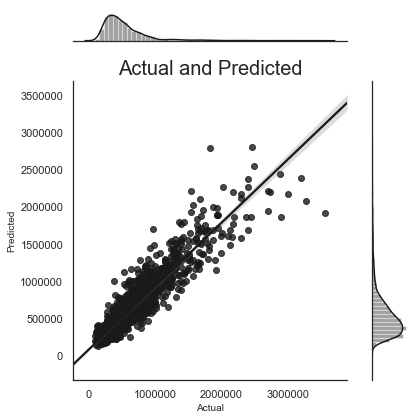

In [92]:
sns.set(style="darkgrid", color_codes=True)
            
with sns.axes_style("white"):
    
    sns.jointplot(x=y_val, y=xgb_best_3.predict(X_val_ht), kind="reg", color="k")
    plt.title('Actual and Predicted', fontsize=20)       # Plot heading 
    plt.xlabel('Actual', fontsize=10)                     # X-label
    plt.ylabel('Predicted', fontsize=10)
    plt.tight_layout()

## Dataset-2 Final summary

Finally we have the result, our final selected model is performing well on the test data <b><i> R2 score of around 87.0% with RMSE of around 120000.</b> </i>

Most important feature for pricing is <b>furnished</b>.The furnished house is priced higher. 

Some other important features that affect price the most are <b>living measure, latitude, above average quality of house and coastal house.</b> So, one needs to thoroughly introspect its property on parameters suggested and list its price accordingly, similarly if one wants buy house - needs to check the features suggested above in house and calculate the predicted price. The same can than be compared to listed price.


## Dataset-1 Final summary:
<li></li>
<b>
<li>The ensemble models have performed well compared to that of linear,KNN,SVR models</li>
<li>The best performance is given by Gradient boosting model with training (score-0.89,RMSE-81372), Validation (score-0.80,RSME-115867), Testing(score-0.79,RMSE-114695)
    The 95% confidence interval scores range from 0.72 to 0.85.</li>
    
<li>The top key features that drive the price of the property  are: 'furnished_1', 'yr_built', 'living_measure','quality_8', 'HouseLandRatio', 'lot_measure15', 'quality_9', 'ceil_measure', 'total_area'. </li>
    
<li>The above data is also reinforced by the analysis done during bivariate analysis.</li>

<li> For further improvization, the datasets can be made by treating outliers in different ways and hypertuning the ensemble models.</li></b>
    

## CONCLUSION and WAY FORWARD:

We have build different models on 2 datasets. The performance (score and 95% confidence interval scores) of the model build on dataset-1 is better than dataset-2 as the 95% confidence interval of dataset-1 is very narrow compared to that of dataset-2. Even though the score of dataset-2 model is higher, the model has very vast range of performance scores.

The top key features to consider for pricing a property are:'furnished_1', 'yr_built', 'living_measure','quality_8', 'lot_measure15', 'quality_9', 'ceil_measure', 'total_area'. These are almost similar in both the models

So, one needs to thoroughly introspect its property on parameters suggested and list its price accordingly, similarly if one wants buy house - needs to check the features suggested above in house and calculate the predicted price. The same can than be compared to listed price.

For further improvization, the datasets can be made by treating outliers in different ways and hypertuning the ensemble models. Making polynomial features and improvising the model performance can also be explored further.

## Pickle file Creation

First we will define the function for data-preprocessing that is required to run through the model. Then we will recall the same for predicting the price(target) of the property.

The pickle file is created as per the steps followed for dataset-2.

In [9]:
#Defining Funcation to process all required steps as done in model
def model(data):
    import pandas as pd   
    import numpy as np 
    
    X_test = pd.read_excel(data)
    
    #Removing outliers
    X_test_1=X_test[(X_test['living_measure']<=9000) & (X_test['price']<=4000000) & 
                      (X_test['room_bed']<=10) & (X_test['room_bath']<=6)]
                      
    cols=['cid','dayhours']
    X_test_1=X_test.drop(cols, inplace = False, axis = 1)
    
    #columns to be converted to category
    categ=['coast', 'furnished','quality']
    #X_test_2=X_test_1[categ].astype('category')

    # Concatenate X_test_dummy_1 variables with X_test_2
    #X_test_final = pd.concat([X_test_1, X_test_2], axis=1)
    X_test_final=X_test_1.copy()
    
    for i in range(1,2):
        X_test_final['coast_'+str(i)]=0
        X_test_final['furnished_'+str(i)]=0
    
    for i in range(1,14):
        X_test_final['quality_'+str(i)]=0

    for i in range(1,2):
        if ((X_test_final['coast']==i).bool()):
            X_test_final['coast_'+str(i)]=1
        
    for i in range(1,2):
        if ((X_test_final['furnished']==i).bool()):
            X_test_final['furnished_'+str(i)]=1
                
    for i in range(1,14):
        if ((X_test_final['quality']==i).bool()):
            X_test_final['quality_'+str(i)]=1
    X_test_final=X_test_final.drop([ 'quality_3', 'quality_4', 'quality_1', 'quality_2', 'quality_5','price'],1)
    # Drop categorical variable columns
    X_test_final = X_test_final.drop(X_test_final[categ], axis=1)

    return X_test_final

#### Test run on pickle file:

In [ ]:
import pickle
with open('model_pickle','wb') as f:
    pickle.dump(xgb_best_3,f)

In [11]:
with open('model_pickle','rb') as f:
    mp=pickle.load(f)

In [14]:
X_test=model('innercity.xlsx')
mp.predict(X_test)
#X_test.columns

array([314002.16], dtype=float32)

### We can see that with the given parameters, pickle file has run through the model and given predicted price of the property